# NETW 1013 Clustering Project

**Objective:**
The objective of this project is to teach students how to apply clustering to real datasets.

You should be able to answer the following questions and provide reasonable justification for your answers:
* Which clustering approach have you decided to use on each dataset?
* Compare between Kmeans, Hierarchal and DBScan.
* Discuss how you tuned your clustering hyperparameters to achieve the best cluster assignment?
* What is the effect of different distance functions on the calculated clusters?
* How did you evaluate the performance of different clustering techniques on different datatsets?
* Visualize your output where applicable.
* What is the effect of scaling on the performance of clustering techniques?






Running this project requires the following imports:

In [3]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *
# StandardScaler is a function to normalize the data
# You may also check MinMaxScaler and MaxAbsScaler
#from sklearn.preprocessing import StandardScaler

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

%matplotlib inline
# Please refer to the sklearn documentation to learn more about the different parameters for each clustering technique.

In [ ]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set
* The dataset generated below is known to be best clustered into 6 clusters.
* Cluster the data set below using the three different clustering techniques discussed in the course.
* Visualize your clustering output in each step of your work.



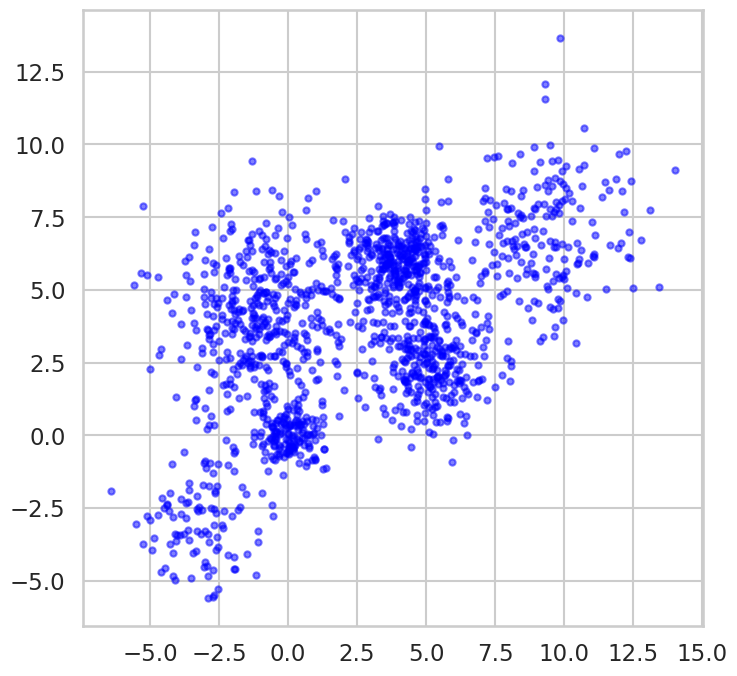

In [ ]:
#Data Generation and Visualization
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

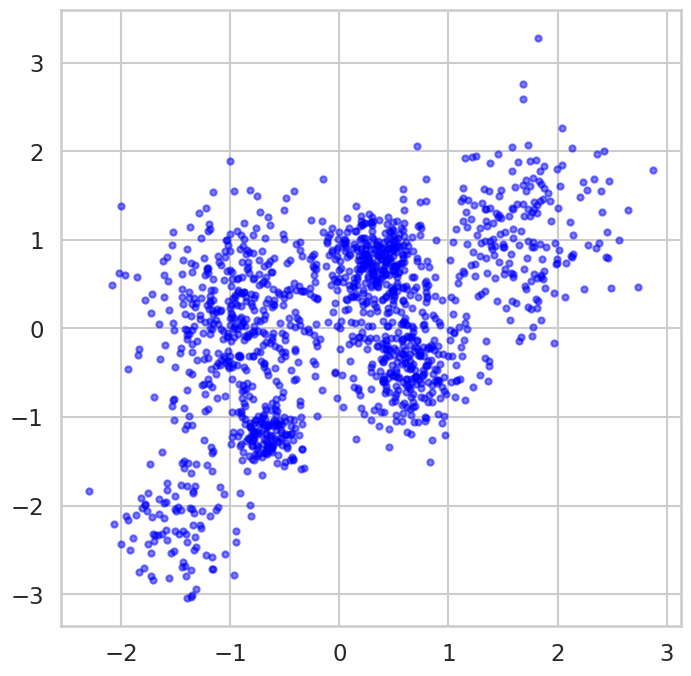

In [ ]:
#This scales the features to have a mean of 0 and a standard deviation of 1,
#making them more suitable for clustering and other machine learning tasks.

from sklearn.preprocessing import StandardScaler

# Scale the dataset
scaler = StandardScaler()
Multi_blob_Data_scaled = scaler.fit_transform(Multi_blob_Data)

# Visualize the scaled data
display_cluster(Multi_blob_Data_scaled)

### Kmeans
* Use Kmeans with different values of K to cluster the above data.
* Display the outcome of each value of K.
* Plot distortion function versus K and choose the approriate value of K.
* Plot the silhouette_score versus K and use it to choose the best K.
* Store the silhouette_score for the best K for later comparison with other clustering techniques.
* Comment on the effect of centroid initialization on cluster assignment.
* Hint: Lookup k-means++ .

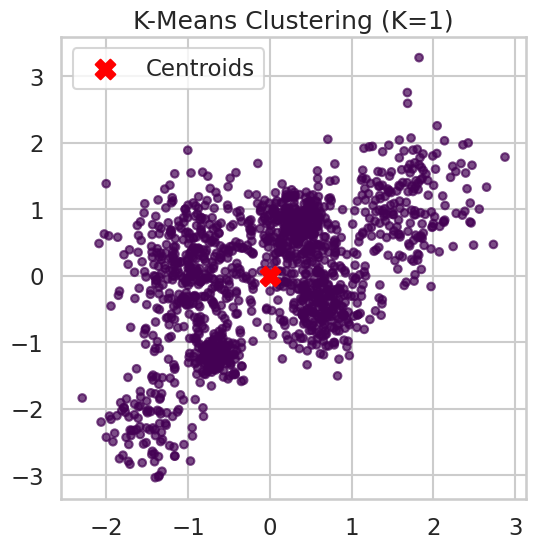

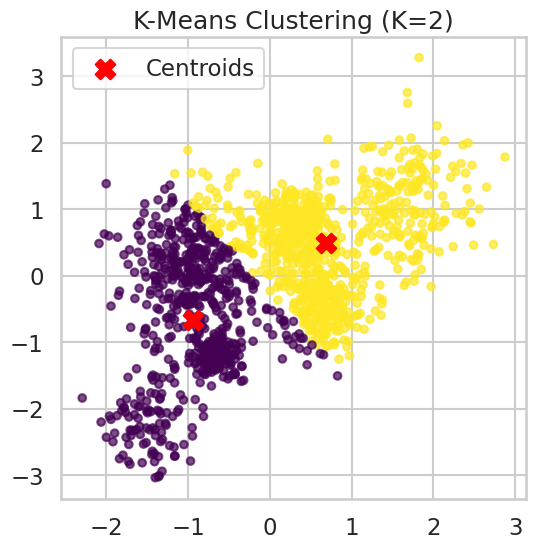

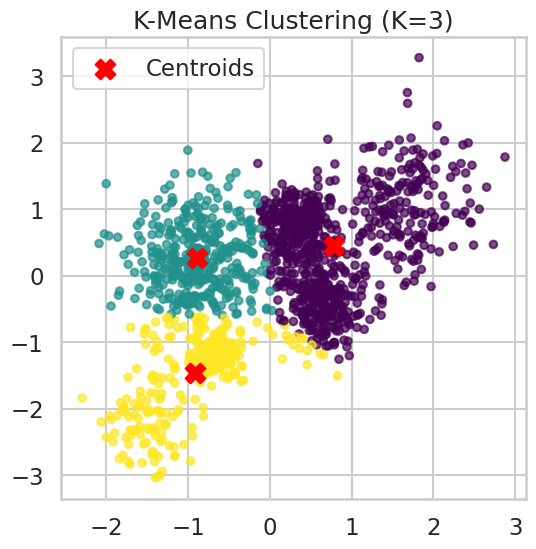

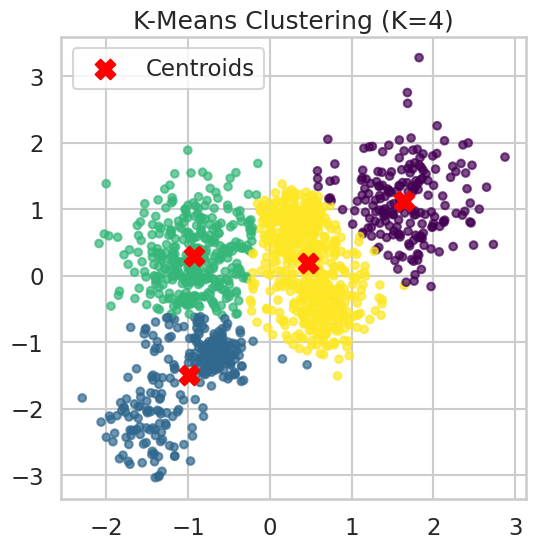

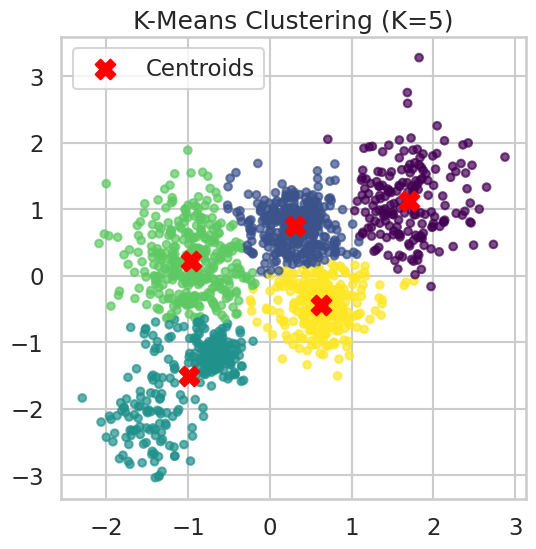

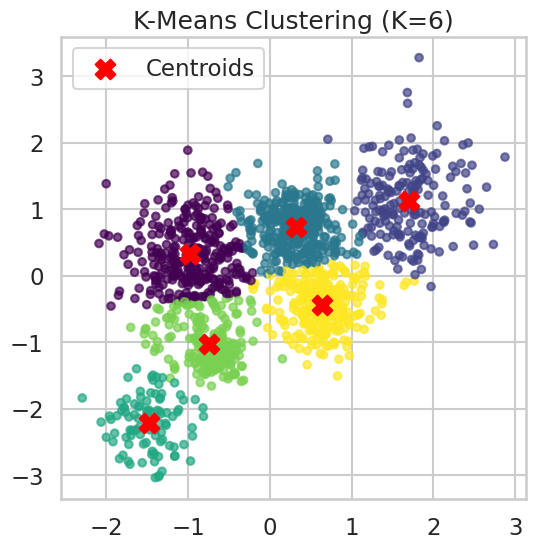

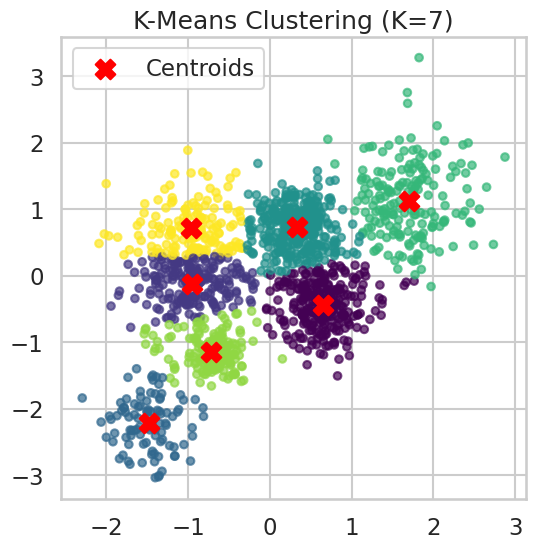

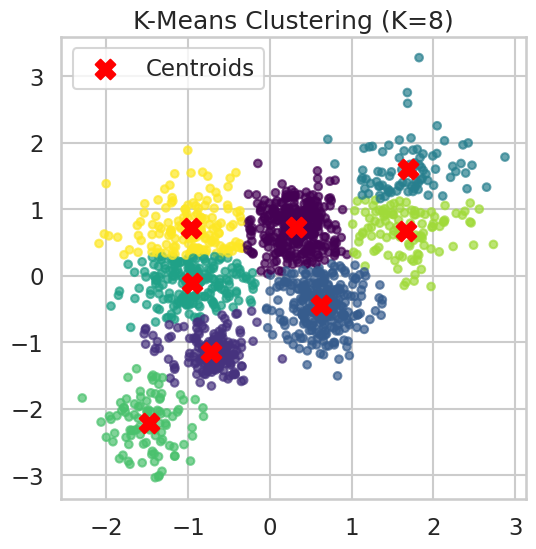

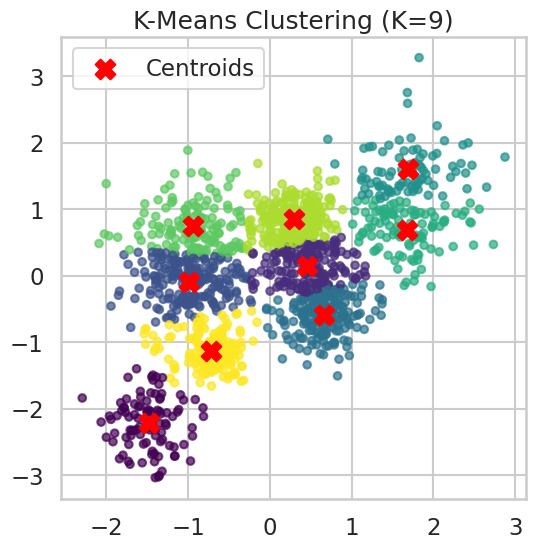

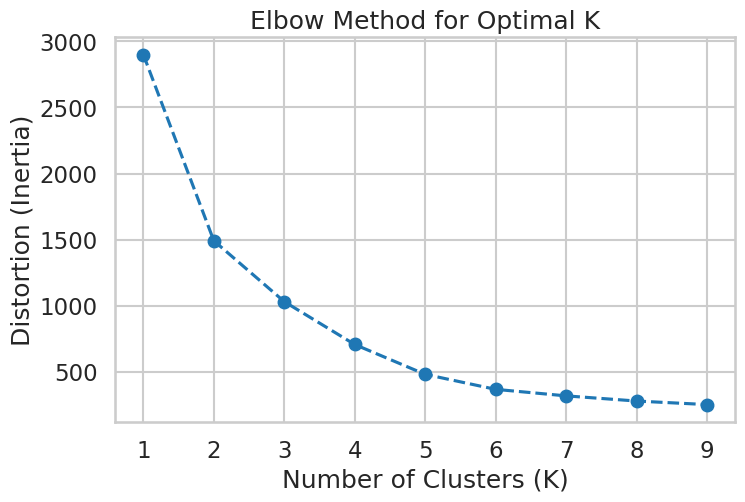

In [ ]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt

# Range of K values to test
K_values = range(1, 10)

# Store distortion values (inertia)
distortions = []

# Apply KMeans for different values of K
for K in K_values:
    kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
    y_kmeans = kmeans.fit_predict(Multi_blob_Data_scaled)

    # Store distortion (inertia)
    distortions.append(kmeans.inertia_)

    # Plot clusters
    plt.figure(figsize=(6, 6))
    plt.scatter(Multi_blob_Data_scaled[:, 0], Multi_blob_Data_scaled[:, 1], c=y_kmeans, cmap='viridis', s=30, alpha=0.7)
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='red', marker='X', s=200, label="Centroids")
    plt.title(f'K-Means Clustering (K={K})')
    plt.legend()
    plt.show()

# Plot distortion function (Elbow Method)
plt.figure(figsize=(8, 5))
plt.plot(K_values, distortions, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion (Inertia)')
plt.title('Elbow Method for Optimal K')
plt.show()


In [ ]:
#From the dataset itself and the plots for each k, it would make sense to choose k = 6. To verify this the sum of squared
#distances method was also used. However, no clear elbow can be seen. Thus, in the following cells we will use the
#silhouette score for further verification.

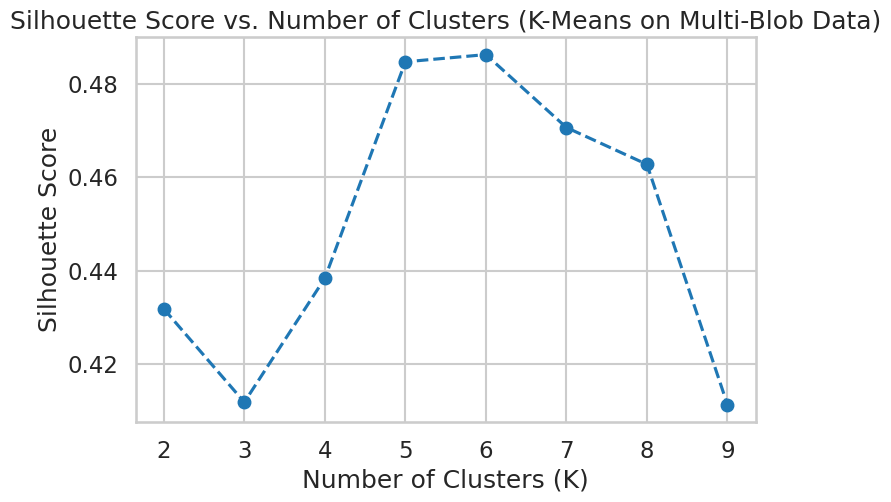

Best K for K-Means on Multi-Blob Data: 6
Silhouette Score for Best K: 0.4862522276594507


In [ ]:
from sklearn.metrics import silhouette_score

# Store silhouette scores specifically for K-Means on Multi-Blob Data
silhouette_scores_kmeans_multiblob = []

# Range of K values to test (ignoring K=1 since silhouette score isn't defined for one cluster)
K_values = range(2, 10)

for K in K_values:
    kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
    y_kmeans = kmeans.fit_predict(Multi_blob_Data_scaled)

    # Compute silhouette score
    score = silhouette_score(Multi_blob_Data_scaled, y_kmeans)
    silhouette_scores_kmeans_multiblob.append(score)

# Plot silhouette scores vs. K
plt.figure(figsize=(8, 5))
plt.plot(K_values, silhouette_scores_kmeans_multiblob, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. Number of Clusters (K-Means on Multi-Blob Data)')
plt.show()

# Find the best K (max silhouette score)
best_K_kmeans_multiblob = K_values[np.argmax(silhouette_scores_kmeans_multiblob)]
best_silhouette_score_kmeans_multiblob = max(silhouette_scores_kmeans_multiblob)

print(f"Best K for K-Means on Multi-Blob Data: {best_K_kmeans_multiblob}")
print(f"Silhouette Score for Best K: {best_silhouette_score_kmeans_multiblob}")


In [ ]:
#As we can see from the the silhouette scores plot, k = 6 has the highest silhouette score. Thus, as expected
#k = 6 is the best number of clusters for this dataset.

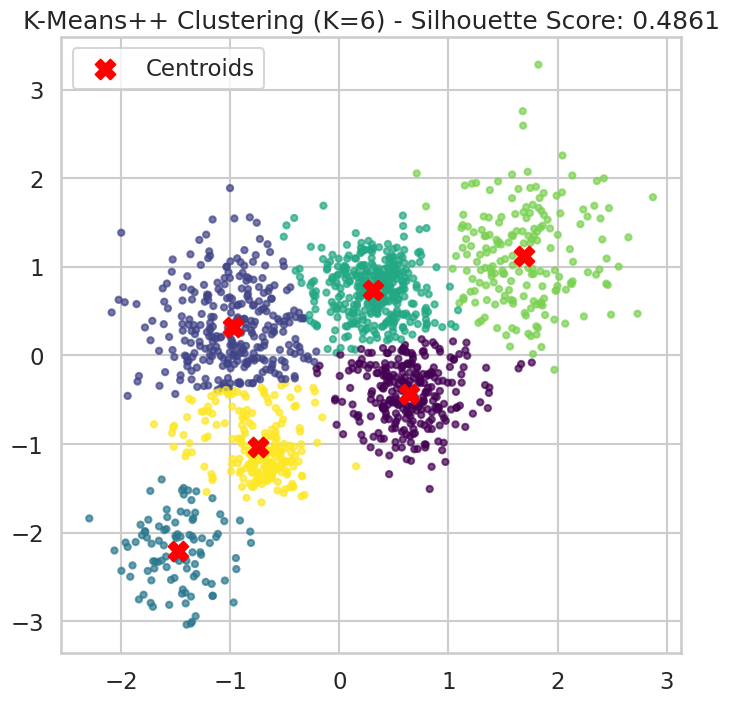

Silhouette Score (K-Means++): 0.4861


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Run K-Means with K-Means++ initialization
kmeans_plus = KMeans(n_clusters=6, init='k-means++', random_state=42)
y_kmeans_plus = kmeans_plus.fit_predict(Multi_blob_Data_scaled)

# Calculate and store silhouette score for K-Means++
silhouette_score_kmeans_plus_multiblob = silhouette_score(Multi_blob_Data_scaled, y_kmeans_plus)

# Plot clusters with colors and centroids
plt.figure(figsize=(8, 8))
plt.scatter(Multi_blob_Data_scaled[:, 0], Multi_blob_Data_scaled[:, 1], c=y_kmeans_plus, cmap='viridis', s=20, alpha=0.7)
plt.scatter(kmeans_plus.cluster_centers_[:, 0], kmeans_plus.cluster_centers_[:, 1], c='red', marker='X', s=200, label='Centroids')
plt.title(f'K-Means++ Clustering (K=6) - Silhouette Score: {silhouette_score_kmeans_plus_multiblob:.4f}')
plt.legend()
plt.show()

# Print the silhouette score
print(f'Silhouette Score (K-Means++): {silhouette_score_kmeans_plus_multiblob:.4f}')


In [ ]:
# K-Means++ Initialization and Effect on Cluster Assignment:
#
# K-Means++ is an improved method for initializing centroids in K-Means clustering.
# It ensures that the centroids are initialized more strategically by selecting the
# first centroid randomly, and then choosing each subsequent centroid based on
# a probability proportional to the squared distance from the nearest existing centroid.
# This spreads out the centroids across the data, making it less likely for K-Means
# to get stuck in local minima, improving both convergence speed and cluster quality.
#
# Effect of Centroid Initialization:
# 1. Poor centroid initialization (e.g., random) can result in suboptimal cluster assignments.
#    Clusters may overlap or converge to local minima, requiring more iterations to converge.
# 2. K-Means++ reduces the risk of poor initialization, leading to better separation of clusters,
#    fewer iterations, and a more consistent clustering result across runs.
#
# In this code, K-Means++ is used to initialize centroids for K=6, which should result in
# better cluster formation and a more accurate representation of the data distribution.

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data.
* In the  AgglomerativeClustering change the following parameters:
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage(try different options)
    * Distance_threshold (try different options)
* Plot the dendrograph for one trial.
* For each of these trials, calculate the silhouette_score and display the resulting clusters.  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observation.

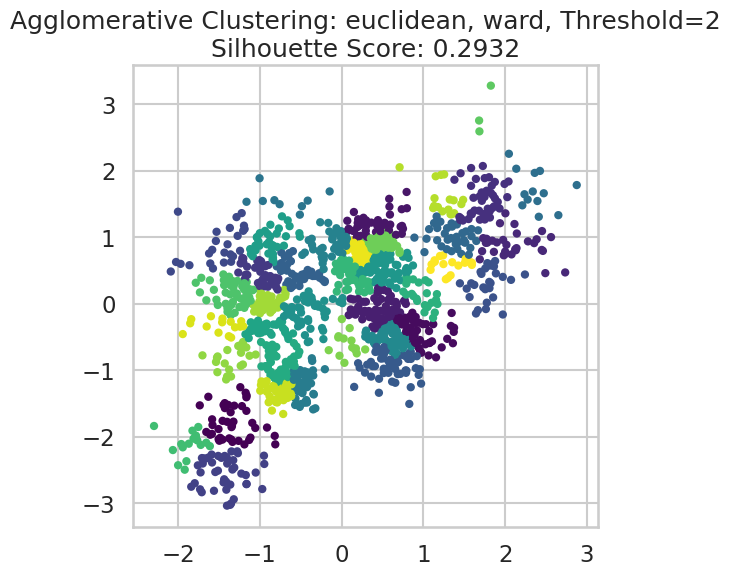

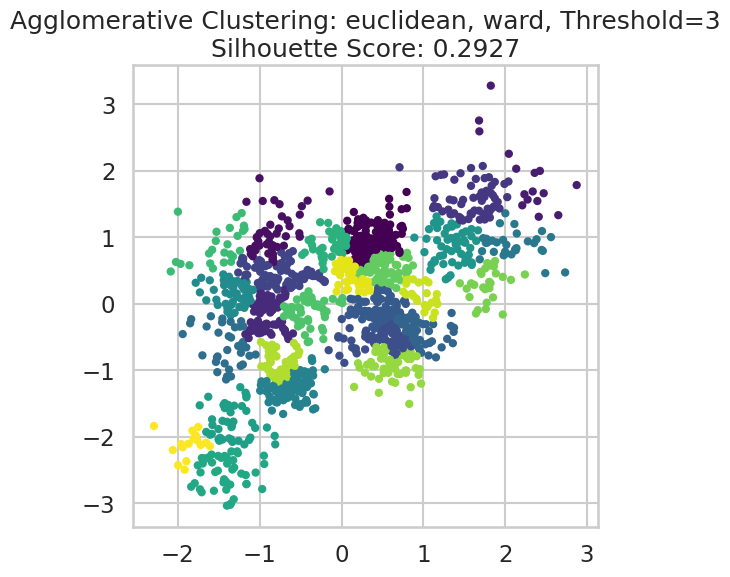

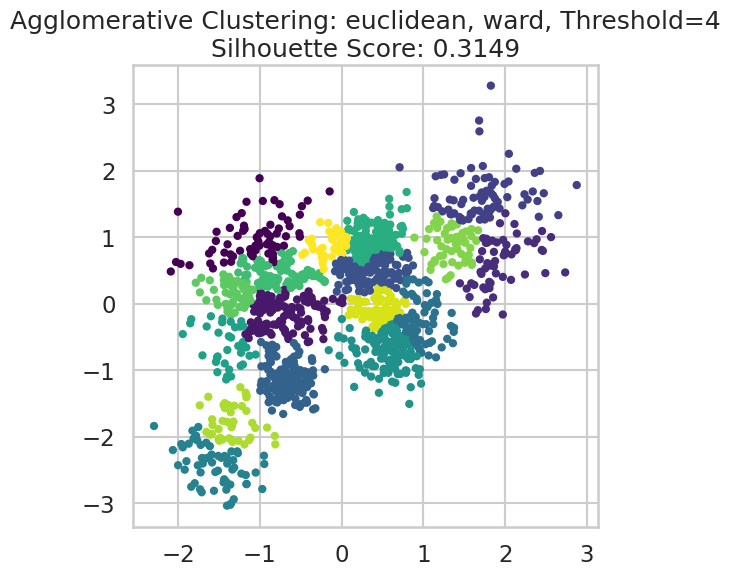

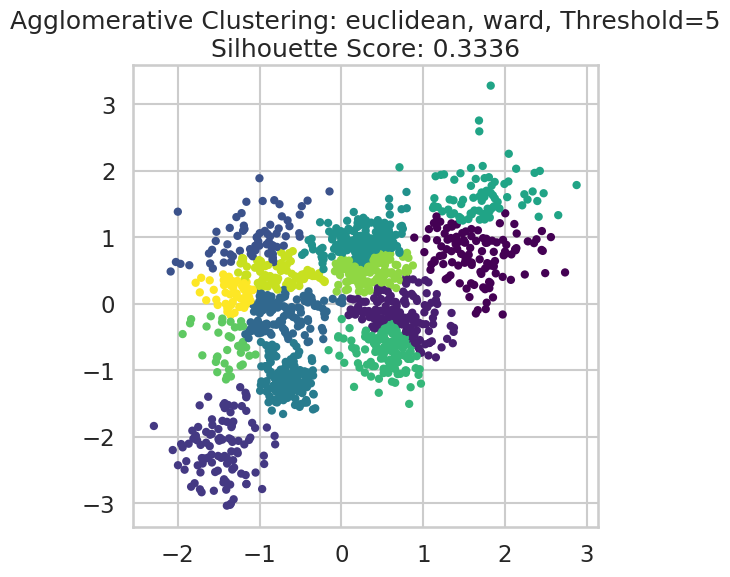

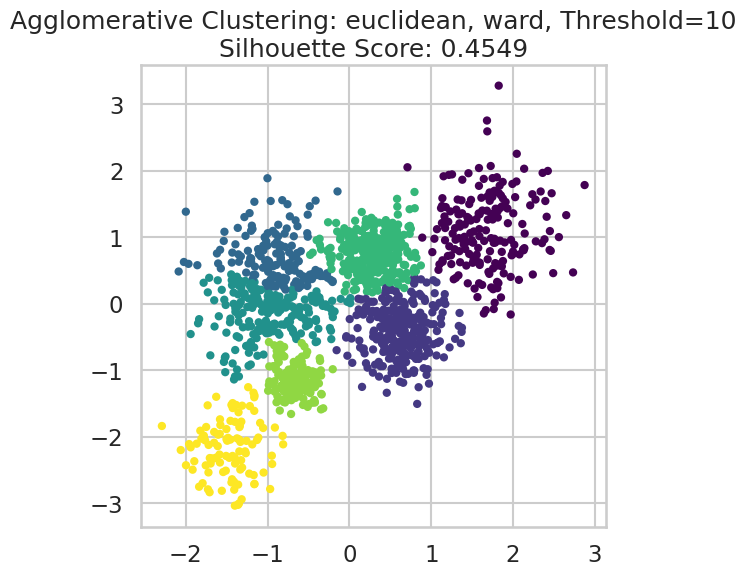

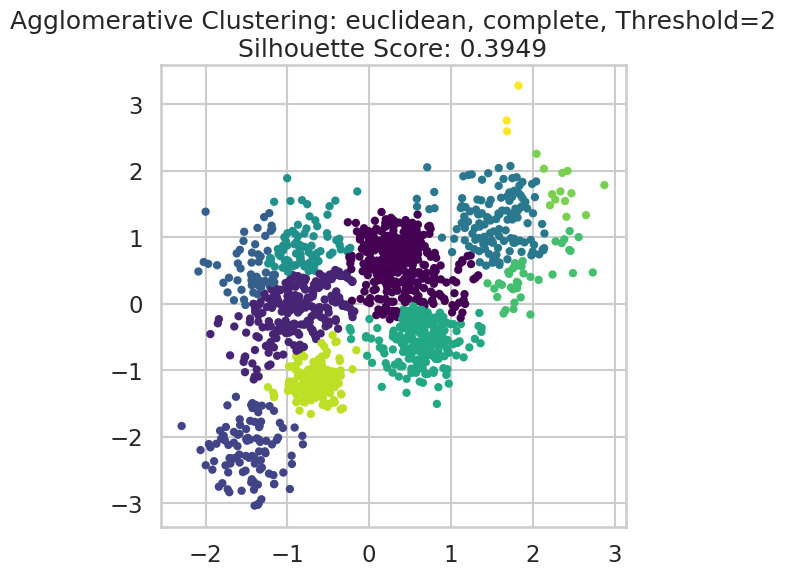

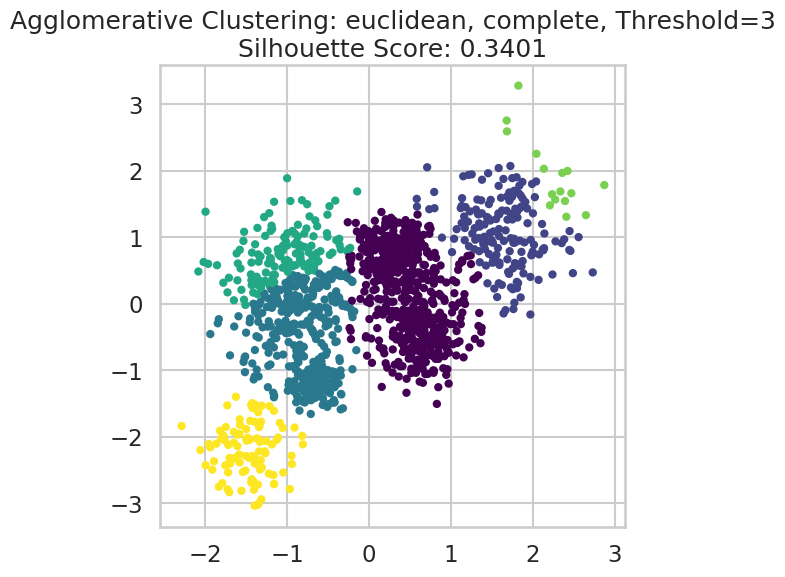

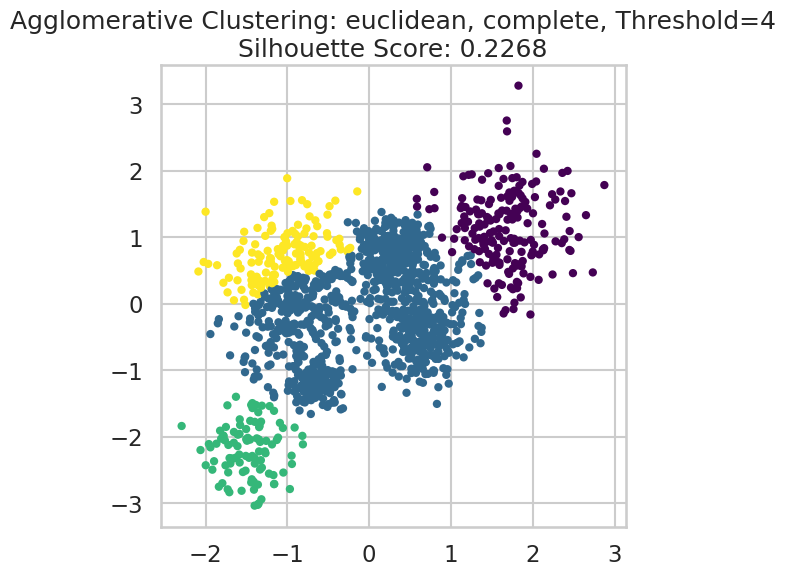

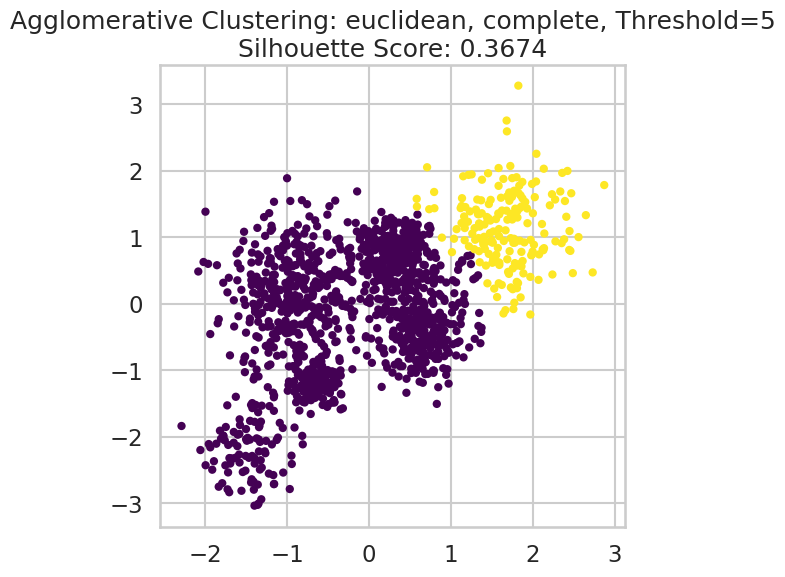

Skipping euclidean, complete, Threshold=10 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


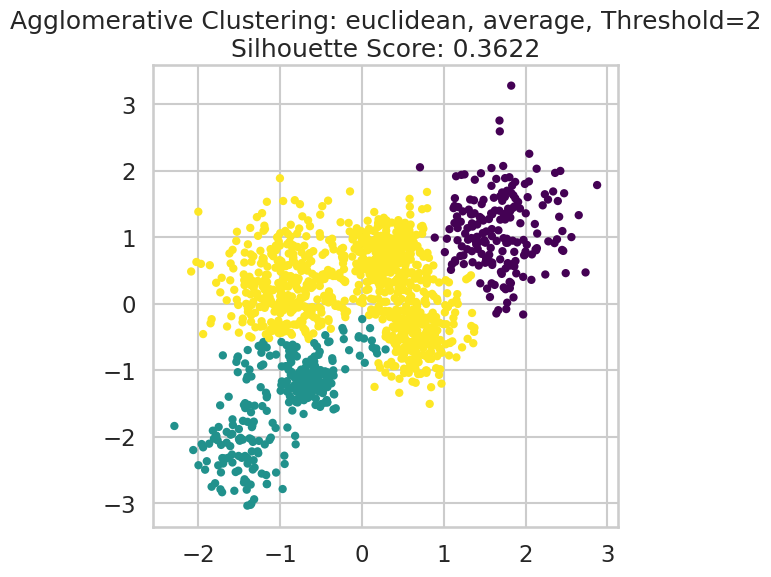

Skipping euclidean, average, Threshold=3 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping euclidean, average, Threshold=4 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping euclidean, average, Threshold=5 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping euclidean, average, Threshold=10 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping euclidean, single, Threshold=2 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping euclidean, single, Threshold=3 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping euclidean, single, Threshold=4 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping euclidean, single, Threshold=5 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclus

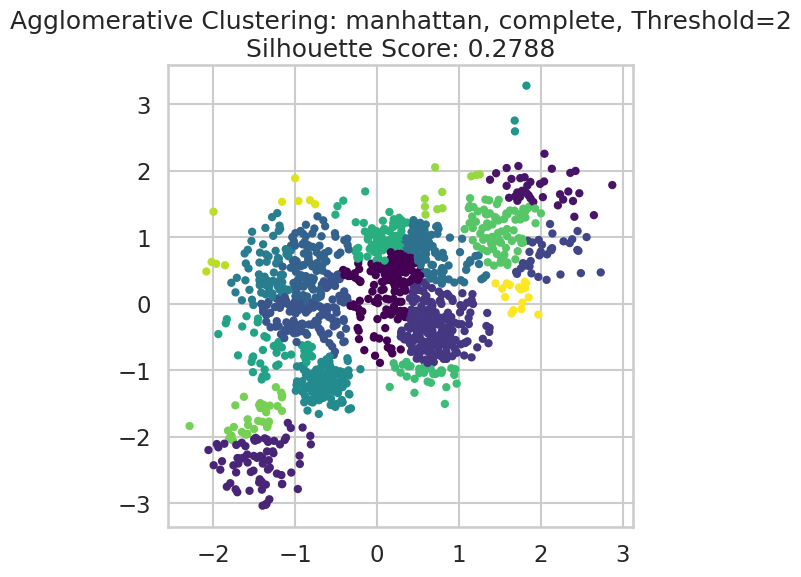

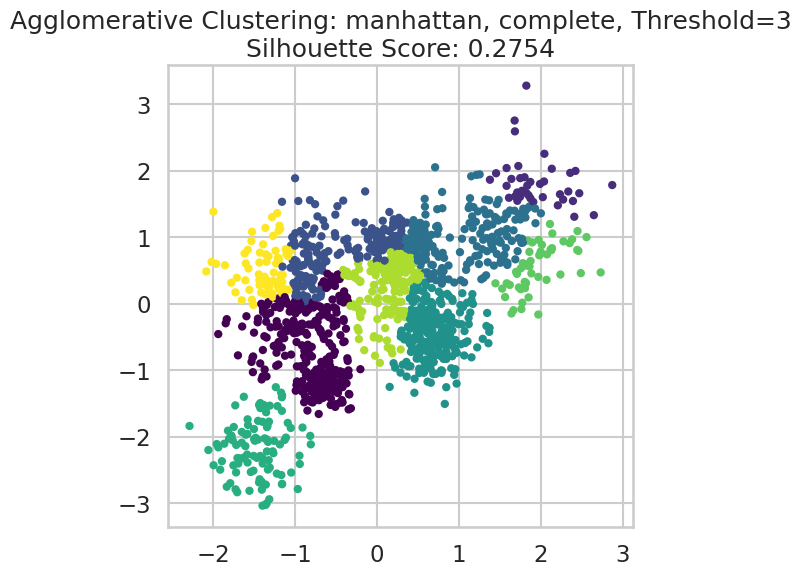

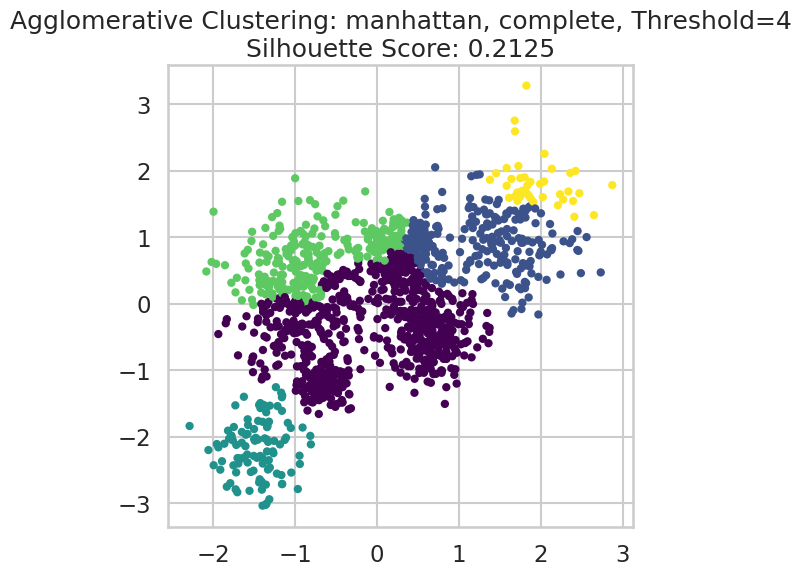

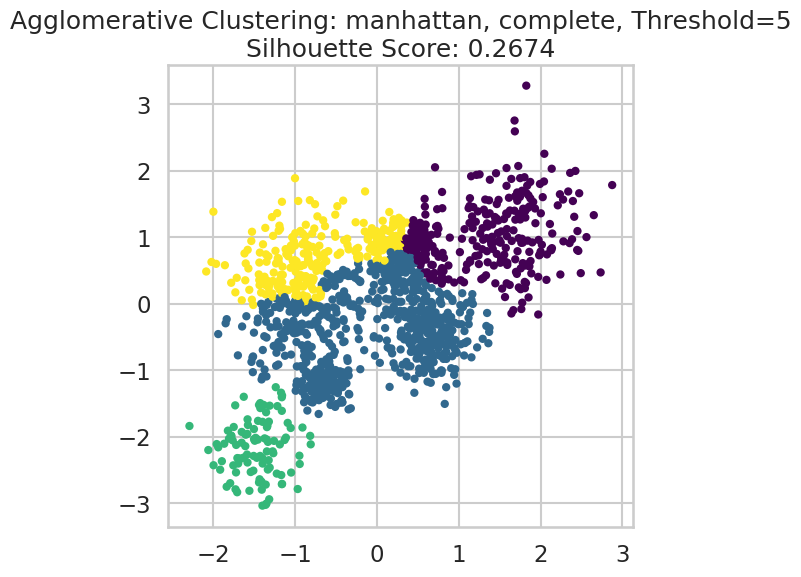

Skipping manhattan, complete, Threshold=10 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


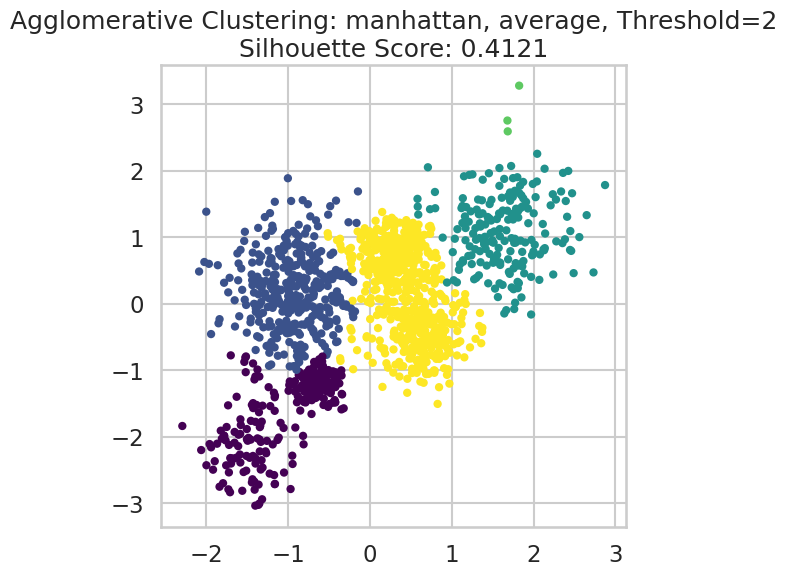

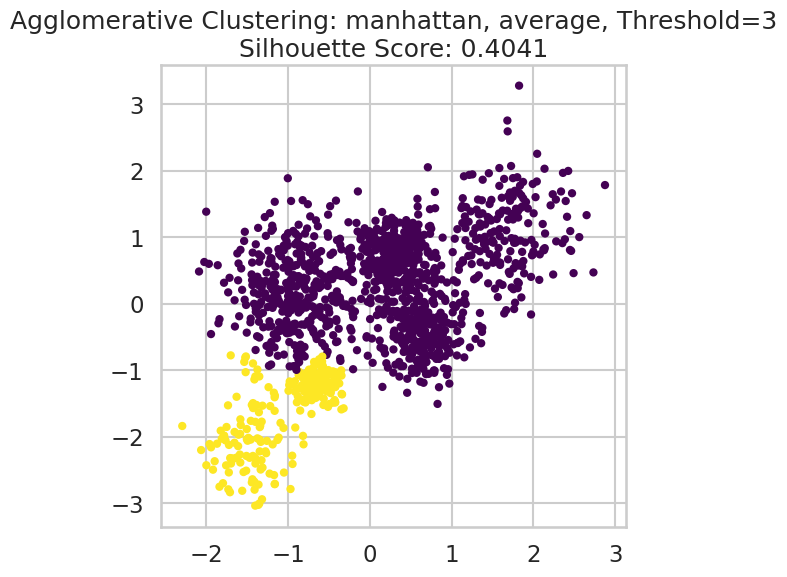

Skipping manhattan, average, Threshold=4 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping manhattan, average, Threshold=5 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping manhattan, average, Threshold=10 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping manhattan, single, Threshold=2 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping manhattan, single, Threshold=3 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping manhattan, single, Threshold=4 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping manhattan, single, Threshold=5 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Skipping manhattan, single, Threshold=10 due to error: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclus

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import itertools

# Define parameter options
metric_options = ['euclidean', 'manhattan', 'cosine']  # Use 'metric' instead of 'affinity'
linkage_options = ['ward', 'complete', 'average', 'single']
distance_thresholds = [2, 3, 4, 5, 10]  # Experiment with different thresholds

# Store results for comparison
silhouette_scores_hierarchical_multiblob = {}
best_clustering_labels = None  # To store the best labels for the best case

# Iterate over all parameter combinations
for metric, linkage, threshold in itertools.product(metric_options, linkage_options, distance_thresholds):
    # Skip invalid combinations (ward linkage only supports Euclidean)
    if linkage == 'ward' and metric != 'euclidean':
        continue

    try:
        # Apply Agglomerative Clustering
        clustering = AgglomerativeClustering(metric=metric, linkage=linkage, distance_threshold=threshold, n_clusters=None)
        y_hierarchical = clustering.fit_predict(Multi_blob_Data_scaled)

        # Compute silhouette score
        score = silhouette_score(Multi_blob_Data_scaled, y_hierarchical)

        # Store the score for this parameter set
        silhouette_scores_hierarchical_multiblob[(metric, linkage, threshold)] = score

        # If the score is the best, store the labels for later comparison
        if best_clustering_labels is None or score > max(silhouette_scores_hierarchical_multiblob.values()):
            best_clustering_labels = y_hierarchical

        # Plot the clusters
        plt.figure(figsize=(6, 6))
        plt.scatter(Multi_blob_Data_scaled[:, 0], Multi_blob_Data_scaled[:, 1], c=y_hierarchical, cmap='viridis', s=20)
        plt.title(f"Agglomerative Clustering: {metric}, {linkage}, Threshold={threshold}\nSilhouette Score: {score:.4f}")
        plt.show()

    except Exception as e:
        print(f"Skipping {metric}, {linkage}, Threshold={threshold} due to error: {e}")

# Find the best parameter set based on silhouette score
best_params_hierarchical_multiblob = max(silhouette_scores_hierarchical_multiblob, key=silhouette_scores_hierarchical_multiblob.get)
best_silhouette_score_hierarchical_multiblob = silhouette_scores_hierarchical_multiblob[best_params_hierarchical_multiblob]

# Display best results
print(f"Best parameters for Agglomerative Clustering on Multi-Blob Data: {best_params_hierarchical_multiblob}")
print(f"Best Silhouette Score: {best_silhouette_score_hierarchical_multiblob}")

# Store the best silhouette score for comparison with other techniques
stored_silhouette_score_hierarchical_multiblob = best_silhouette_score_hierarchical_multiblob


In [ ]:
#The output of the previous cell shows the results of clustering for each combination of parameters.
#Also, it shows which incorrect combinations are skipped (some parameters cannot be used together).
#Lastly, the output shows the best combination of parameters and the best silhouette score.
#These are: 'euclidean', 'ward', 10 . Sil_Score = 0.4548664117944667.

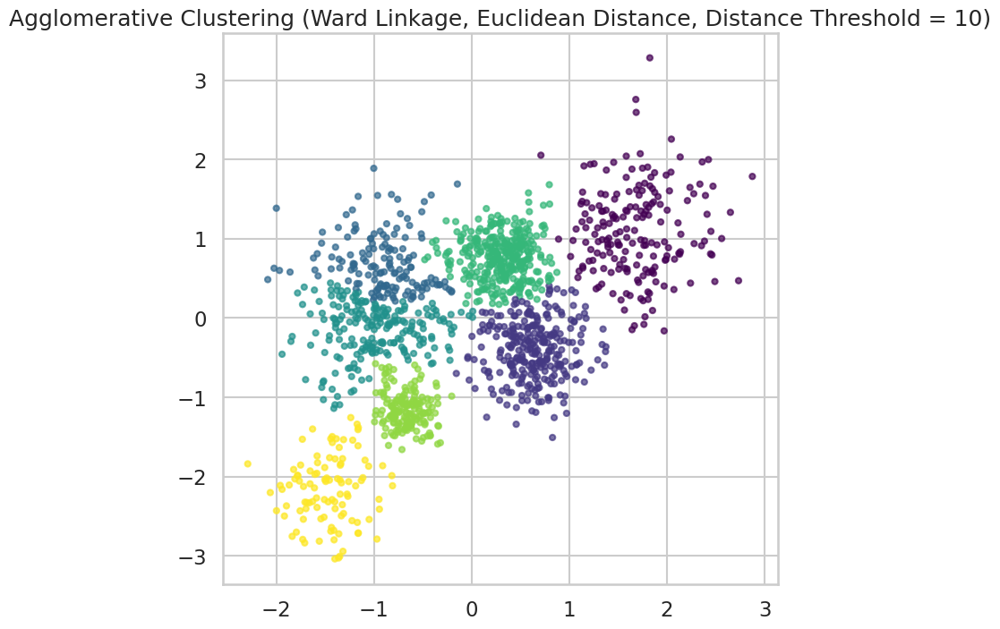

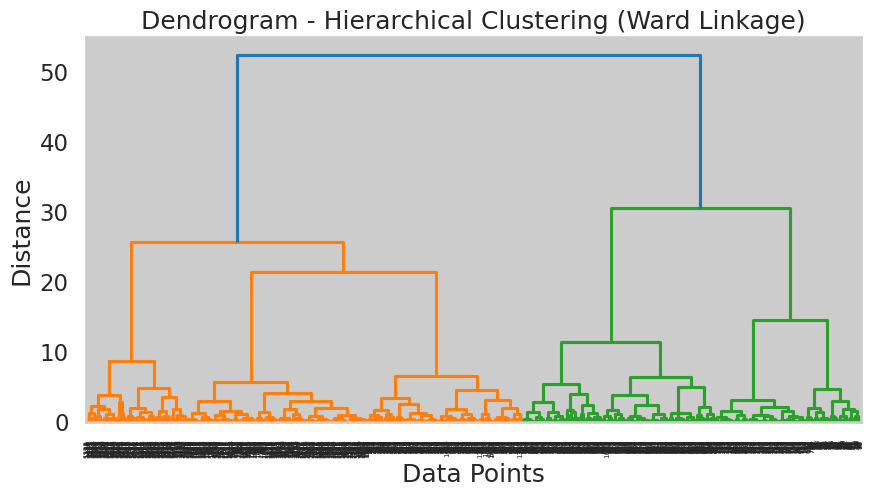

In [ ]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt

# Perform Agglomerative Clustering (one case) - Using the best parameters yielded by previous cells
agg_clustering = AgglomerativeClustering(n_clusters= None, linkage='ward', metric='euclidean',distance_threshold=10)
y_agg = agg_clustering.fit_predict(Multi_blob_Data_scaled)

# Plot Clusters
plt.figure(figsize=(8, 8))
plt.scatter(Multi_blob_Data_scaled[:, 0], Multi_blob_Data_scaled[:, 1], c=y_agg, cmap='viridis', s=20, alpha=0.7)
plt.title('Agglomerative Clustering (Ward Linkage, Euclidean Distance, Distance Threshold = 10)')
plt.show()

# Plot Dendrogram
plt.figure(figsize=(10, 5))
dendrogram = sch.dendrogram(sch.linkage(Multi_blob_Data_scaled, method='ward'))
plt.title('Dendrogram - Hierarchical Clustering (Ward Linkage)')
plt.xlabel('Data Points')
plt.ylabel('Distance')
plt.show()


In [ ]:
# Observations:
# - Using Ward linkage with Euclidean distance provides the best clustering because Ward minimizes variance within clusters,
#   which naturally aligns with the structure of the multi-blob dataset. This ensures that each cluster is compact and well-separated.
#
# - The threshold of 10 ensures that we get a reasonable number of clusters without excessive merging. If the threshold were too high,
#   distinct clusters would merge prematurely, leading to poor separation. If too low, we'd have too many small clusters,
#   missing the overall structure.
#
# - Ward linkage works well with Euclidean distance because it progressively merges clusters that minimize within-cluster variance,
#   producing more balanced clusters. Other methods like complete or average linkage can sometimes create imbalanced clusters
#   or fail to capture the underlying structure as effectively.
#
# - Compared to Manhattan or Cosine distance, Euclidean distance captures actual geometric distances between points,
#   which is crucial in this dataset since the blobs are well-separated in space.
#
# - Other linkage methods (single, complete, average) may either merge too aggressively or fail to separate clusters properly.
#   Ward's method, however, maintains a hierarchical structure that best preserves the dataset's natural grouping.
#
# - The results show clear, well-separated clusters, with minimal noise or misclassified points. This confirms that
#   Ward linkage with Euclidean distance and threshold = 10 effectively captures the dataset’s structure.
#
# - Overall, this combination of parameters achieves the best trade-off between granularity and separation, making it the optimal choice
#   for the multi-blob dataset.


### DBScan
* Use DBScan function to  to cluster the above data.
* In the  DBscan change the following parameters:
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
    * Another option: Lookup K-Distance graph method
* Plot the silhouette_score versus the variation in the EPS and the min_samples.
* Plot the resulting Clusters in this case.
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observations and comments.

eps: 0.10, min_samples: 5, Clusters: 26, Silhouette Score: -0.2507
eps: 0.10, min_samples: 10, Clusters: 8, Silhouette Score: -0.2083
eps: 0.10, min_samples: 15, Clusters: 7, Silhouette Score: -0.2652
eps: 0.10, min_samples: 20, Clusters: 2, Silhouette Score: -0.1913
eps: 0.10, min_samples: 25, Clusters: 2, Silhouette Score: -0.3042
eps: 0.31, min_samples: 20, Clusters: 2, Silhouette Score: 0.3010
eps: 0.31, min_samples: 25, Clusters: 3, Silhouette Score: 0.2233


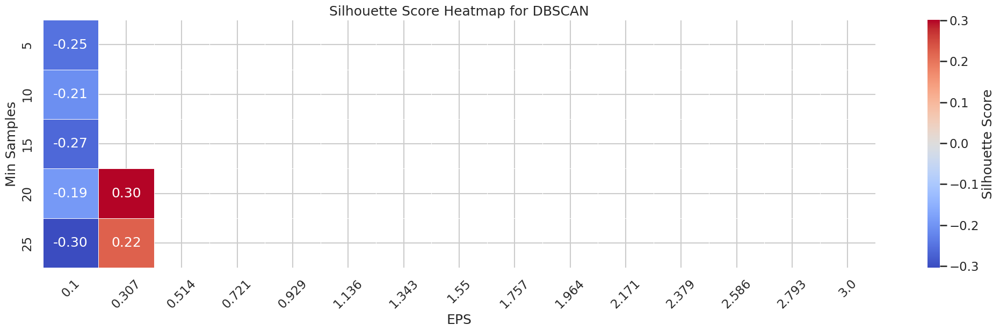


Best Parameters:
EPS: 0.307, Min Samples: 20, Clusters: 2
Best Silhouette Score: 0.3010


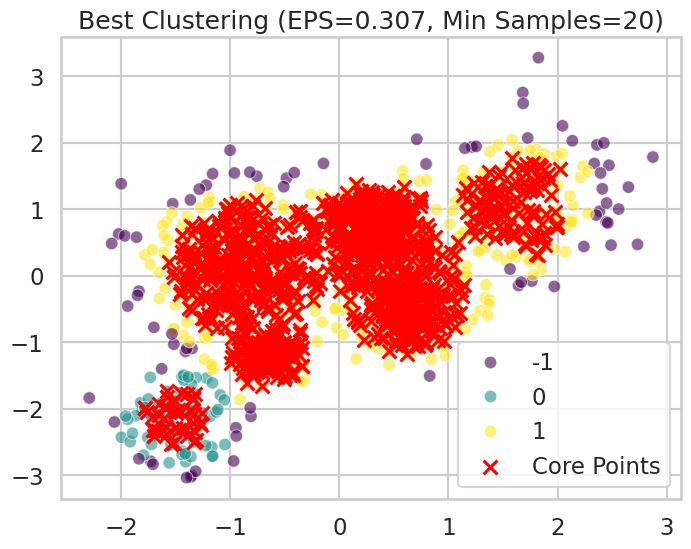

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from itertools import product

# Define parameter ranges
eps_values = np.linspace(0.1, 3, 15)  # Reduce number of steps for clarity
min_samples_values = range(5, 30, 5)  # More range for Min Samples

# Store results
results = []
best_score = -1
best_params = None

# Iterate over eps and min_samples
for eps, min_samples in product(eps_values, min_samples_values):
    model = DBSCAN(eps=eps, min_samples=min_samples)
    labels = model.fit_predict(Multi_blob_Data_scaled)

    # Get number of clusters (excluding noise)
    n_clusters = len(set(labels) - {-1})

    # Ignore cases with only 1 cluster or no clusters
    if n_clusters > 1:
        score = silhouette_score(Multi_blob_Data_scaled, labels)
        results.append((eps, min_samples, score, n_clusters))

        # Update best score
        if score > best_score:
            best_score = score
            best_params = (eps, min_samples, n_clusters)

        # Print each iteration's results
        print(f"eps: {eps:.2f}, min_samples: {min_samples}, Clusters: {n_clusters}, Silhouette Score: {score:.4f}")

# Convert results to a NumPy array
results = np.array(results, dtype=object)

# Create a pivot table for heatmap
heatmap_data = np.full((len(min_samples_values), len(eps_values)), np.nan)

for i, min_samples in enumerate(min_samples_values):
    for j, eps in enumerate(eps_values):
        match = results[(results[:, 0] == eps) & (results[:, 1] == min_samples)]
        if len(match) > 0:
            heatmap_data[i, j] = match[0, 2]  # Silhouette score

# Plot the heatmap
plt.figure(figsize=(25, 6))
ax = sns.heatmap(heatmap_data, xticklabels=np.round(eps_values, 3),
                 yticklabels=min_samples_values, cmap="coolwarm", annot=True,
                 fmt=".2f", linewidths=0.5, cbar_kws={'label': 'Silhouette Score'})

plt.xlabel("EPS")
plt.ylabel("Min Samples")
plt.xticks(rotation=45)  # Rotate labels for readability
plt.title("Silhouette Score Heatmap for DBSCAN")
plt.show()

# Print Best Parameters
print("\nBest Parameters:")
print(f"EPS: {best_params[0]:.3f}, Min Samples: {best_params[1]}, Clusters: {best_params[2]}")
print(f"Best Silhouette Score: {best_score:.4f}")

# Plot best clustering result
best_eps, best_min_samples, _ = best_params
best_model = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_model.fit_predict(Multi_blob_Data_scaled)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=Multi_blob_Data_scaled[:, 0], y=Multi_blob_Data_scaled[:, 1], hue=best_labels, palette='viridis', alpha=0.6)
plt.scatter(best_model.components_[:, 0], best_model.components_[:, 1], c='red', marker='x', s=100, label='Core Points')
plt.title(f"Best Clustering (EPS={best_eps:.3f}, Min Samples={best_min_samples})")
plt.legend()
plt.show()

In [ ]:

# 1. The heatmap shows that most silhouette scores are negative. That means the clustering
#    wasn't great for most parameter combos.
# 2. The best silhouette score we got was 0.30 with EPS = 0.307 and Min Samples = 20.
#    Not amazing, but definitely the best out of what we tested.
# 3. Now, looking at the actual clusters:
#    - The red Xs mark the core points, and they seem to form pretty solid clusters.
#    - There's a decent amount of noise (purple points), which DBSCAN flagged correctly.
#    - Some clusters look a little stretched out, but that's expected—DBSCAN handles this better than k-means.
# 4. Overall, DBSCAN did a decent job at separating dense regions, but it’s not perfect.
# 5. If we wanted to fine-tune this, we could:
#    - Try adjusting EPS in smaller steps to see if we can get a cleaner separation.
#    - Lower Min Samples a bit to see if we can detect smaller clusters.



In [ ]:
#Which Clustering Method is Best for MULTIBLOB DATASET?

# K-Means gave the best clustering results for the multi-blob dataset.
# The silhouette score was the highest, meaning clusters were well-separated and compact.

# K-Means worked best because the dataset had well-defined, evenly spaced clusters.
# Since K-Means assumes clusters are circular and of similar size, it was a perfect fit.
# The K-Means++ initialization also helped place centroids in good positions, avoiding bad starting points.

# DBSCAN, on the other hand, struggled because it relies on density to find clusters.
# It labeled too many points as noise, meaning it couldn't properly separate the blobs.
# DBSCAN works better with datasets that have uniform densities,
# but this dataset had a bit of varying density for it to work well.

# Agglomerative Clustering (using Ward linkage and Euclidean distance) performed decently but still worse than K-Means.
# This method sometimes merged clusters in a way that slightly misclassified some points.
# It also isn't as well-suited for evenly sized, well-separated clusters, making it less effective here.

# Overall, K-Means was the best choice because it accurately grouped the data without noise mislabeling (like DBSCAN)
# and without the risk of suboptimal cluster merging (like Agglomerative Clustering).


## iris data set
The iris data set is test data set that is part of the Sklearn module
which contains 150 records each with 4 features. All the features are represented by real numbers.

The data represents three classes.


In [ ]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

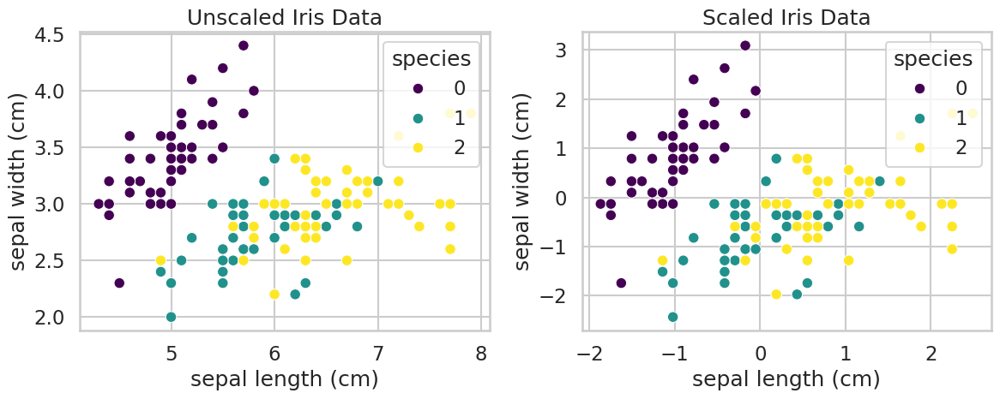

In [ ]:
#First we make a scaled verision of the dataset and plot the unscaled and scaled verisions
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler

# Load the Iris dataset
iris_data = load_iris()

# Convert to DataFrame
iris_df = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)
iris_df['species'] = iris_data.target

# Scale the data
scaler = StandardScaler()
iris_scaled = scaler.fit_transform(iris_df.iloc[:, :-1])
iris_scaled_df = pd.DataFrame(iris_scaled, columns=iris_data.feature_names)
iris_scaled_df['species'] = iris_data.target

# Plot the unscaled dataset
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.scatterplot(x=iris_df.iloc[:, 0], y=iris_df.iloc[:, 1], hue=iris_df['species'], palette='viridis')
plt.xlabel(iris_data.feature_names[0])
plt.ylabel(iris_data.feature_names[1])
plt.title("Unscaled Iris Data")

# Plot the scaled dataset
plt.subplot(1, 2, 2)
sns.scatterplot(x=iris_scaled_df.iloc[:, 0], y=iris_scaled_df.iloc[:, 1], hue=iris_scaled_df['species'], palette='viridis')
plt.xlabel(iris_data.feature_names[0])
plt.ylabel(iris_data.feature_names[1])
plt.title("Scaled Iris Data")

plt.tight_layout()
plt.show()

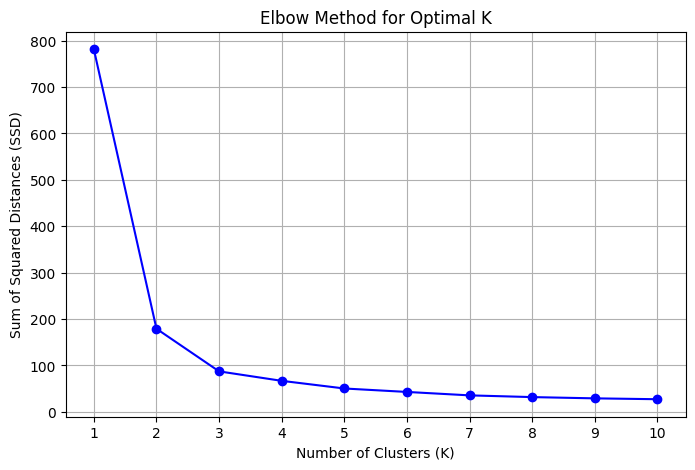

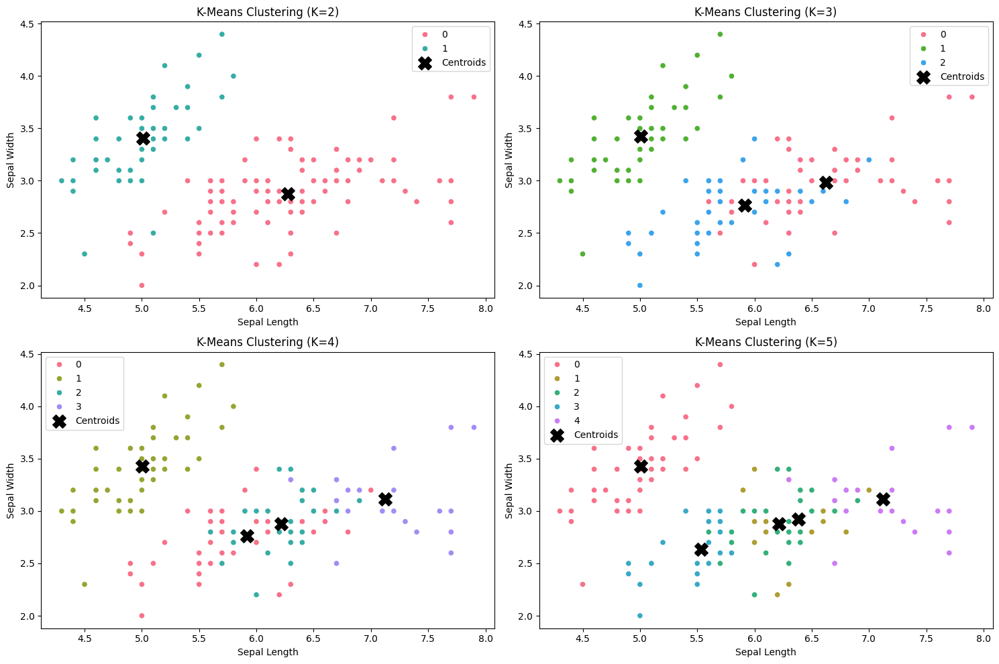

In [ ]:
#Kmeans for the unscaled dataset and the SSD graph

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# Define the range of K values
k_values = range(1, 11)  # Trying K from 1 to 10
distortions = []

# Compute distortion (SSD) for each K
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(iris_df)
    distortions.append(kmeans.inertia_)

# Plot the distortion function (Elbow Method)
plt.figure(figsize=(8, 5))
plt.plot(k_values, distortions, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (SSD)')
plt.title('Elbow Method for Optimal K')
plt.xticks(k_values)
plt.grid()
plt.show()

# Try different K values and plot clusters
plt.figure(figsize=(15, 10))

for i, k in enumerate([2, 3, 4, 5], 1):  # Trying K = 2, 3, 4, 5
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    iris_df['cluster'] = kmeans.fit_predict(iris_df)

    plt.subplot(2, 2, i)
    sns.scatterplot(
        x=iris_df.iloc[:, 0],  # Sepal Length
        y=iris_df.iloc[:, 1],  # Sepal Width
        hue=iris_df['cluster'],
        palette=sns.color_palette('husl', k),
        legend='full'
    )

    centers = kmeans.cluster_centers_
    plt.scatter(centers[:, 0], centers[:, 1], c='black', marker='X', s=200, label='Centroids')

    plt.title(f"K-Means Clustering (K={k})")
    plt.xlabel("Sepal Length")
    plt.ylabel("Sepal Width")
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
#No clear elbow was shown , thus , we will try the silhouette score method instead

Sil score for k=2: 0.6810
Sil score for k=3: 0.5512
Sil score for k=4: 0.4976
Sil score for k=5: 0.4931
Sil score for k=6: 0.3678
Sil score for k=7: 0.3543
Sil score for k=8: 0.3447
Sil score for k=9: 0.3156
Sil score for k=10: 0.3014


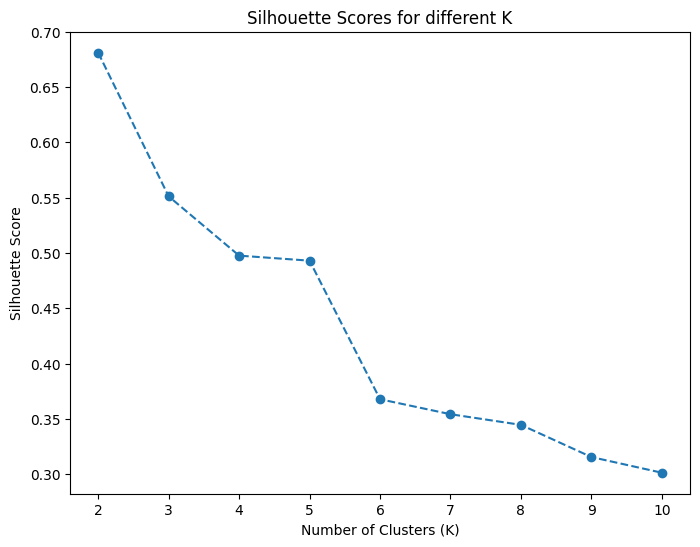

The optimal number of clusters (K) is: 2


In [ ]:
#Trying the silhouette score method

from sklearn.metrics import silhouette_score
silhouette_scores = []
K_range = range(2, 11)  # Test values of K from 2 to 10

# Step 4: Loop through different values of K
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(iris_data.data)
    labels = kmeans.labels_

    # Calculate silhouette score for the current K
    score = silhouette_score(iris_data.data, labels)
    print(f"Sil score for k={k}: {score:.4f}")
    silhouette_scores.append(score)

# Step 5: Plot silhouette scores to visualize the best K
plt.figure(figsize=(8, 6))
plt.plot(K_range, silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Scores for different K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.show()

# Step 6: Find the optimal K (maximum silhouette score)
optimal_K2 = K_range[np.argmax(silhouette_scores)]
print(f"The optimal number of clusters (K) is: {optimal_K2}")


In [ ]:
#Observations and takeaways from kmeans for the unscaled iris dataset

# Observations:
# - The elbow method shows a sharp drop in SSD at K=2, followed by a much more gradual decline.
#   - This suggests that most of the variance is explained when we split the data into 2 clusters.
#   - Beyond K=2, the reduction in SSD is minimal, meaning additional clusters don't improve the fit significantly.

# - The silhouette score confirms this by peaking at K=2 (~0.68) and steadily decreasing as K increases.
#   - A higher silhouette score means clusters are well-separated and internally cohesive.
#   - Since K=2 gives the highest silhouette score, it indicates that the data naturally forms two distinct groups.

# - Given that the Iris dataset has three actual species (Setosa, Versicolor, and Virginica),
#   but Setosa is known to be very distinct while Versicolor and Virginica overlap slightly,
#   it's reasonable that KMeans finds two strong clusters instead of three.

# - If we force K=3, we would be splitting the more ambiguous Versicolor/Virginica region into separate clusters,
#   but the silhouette score suggests this does not improve the overall clustering quality.

# - Overall, both methods point to K=2 as the best choice because:
#   1. It captures the strongest natural division in the data.
#   2. It minimizes within-cluster distances effectively.
#   3. It achieves the highest silhouette score, meaning well-separated and compact clusters.

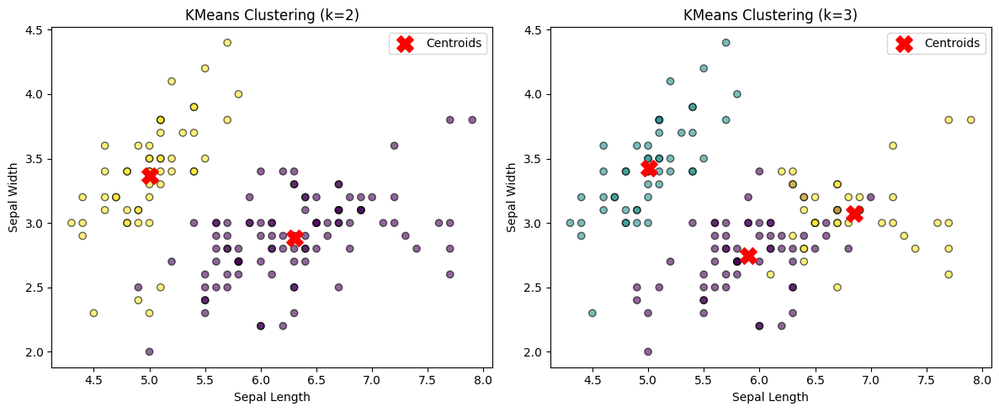

In [ ]:
#Perform keamns using K=2 (the result of our analysis) and K=3(from looking at the iris dataset initially)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import load_iris

# Load the Iris dataset
iris = load_iris()
X = iris.data  # Using the unscaled dataset

# Apply KMeans for k=2
kmeans_2 = KMeans(n_clusters=2, random_state=42, n_init=10)
labels_2 = kmeans_2.fit_predict(X)
centroids_2 = kmeans_2.cluster_centers_

# Apply KMeans for k=3
kmeans_3 = KMeans(n_clusters=3, random_state=42, n_init=10)
labels_3 = kmeans_3.fit_predict(X)
centroids_3 = kmeans_3.cluster_centers_

# Plot results side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot KMeans with k=2
axes[0].scatter(X[:, 0], X[:, 1], c=labels_2, cmap='viridis', edgecolors='k', alpha=0.6)
axes[0].scatter(centroids_2[:, 0], centroids_2[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[0].set_title("KMeans Clustering (k=2)")
axes[0].set_xlabel("Sepal Length")
axes[0].set_ylabel("Sepal Width")
axes[0].legend()

# Plot KMeans with k=3
axes[1].scatter(X[:, 0], X[:, 1], c=labels_3, cmap='viridis', edgecolors='k', alpha=0.6)
axes[1].scatter(centroids_3[:, 0], centroids_3[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title("KMeans Clustering (k=3)")
axes[1].set_xlabel("Sepal Length")
axes[1].set_ylabel("Sepal Width")
axes[1].legend()

plt.tight_layout()
plt.show()


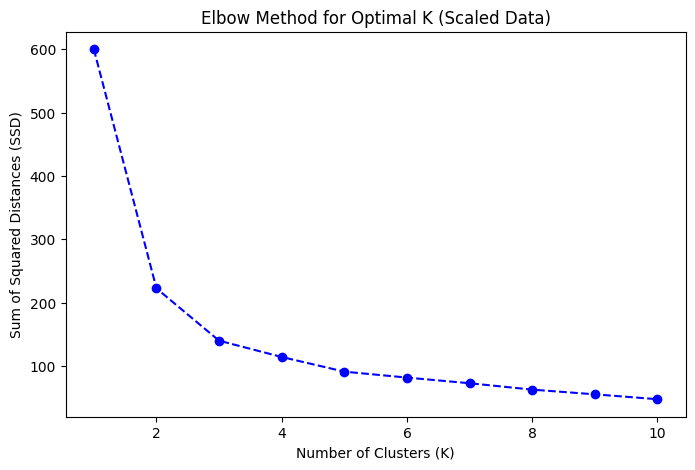

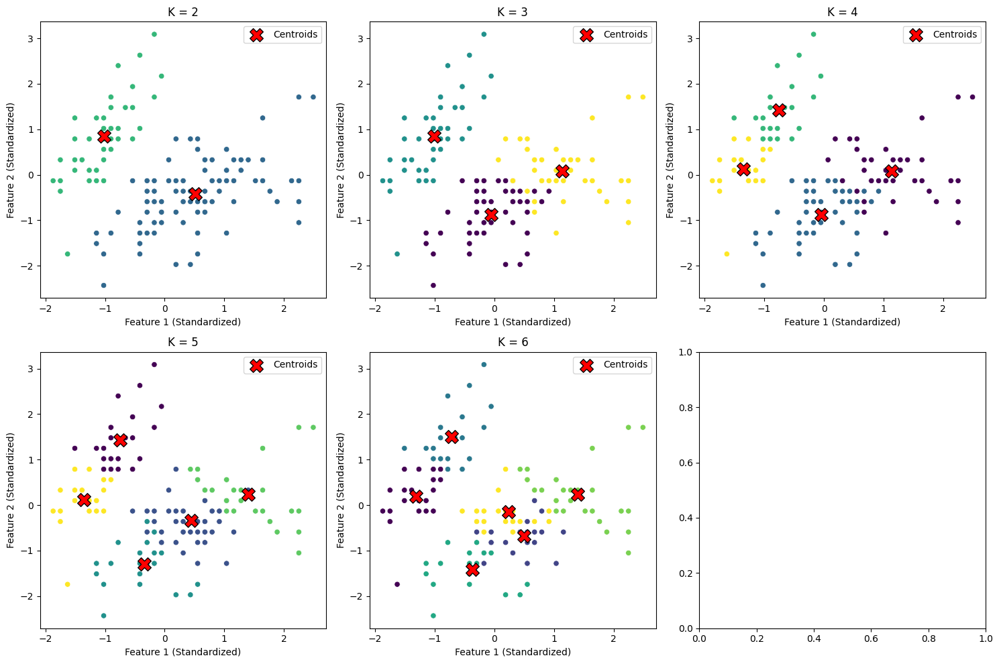

In [ ]:
#Start to apply Kmeans on the scaled dataset and plot SSD for the ebow method

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_iris

# Load the Iris dataset
iris = load_iris()
X = iris.data  # Extract features

# Scale the dataset
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Try different values of K
K_range = range(1, 11)  # K values from 1 to 10
ssd = []  # Store sum of squared distances

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    ssd.append(kmeans.inertia_)  # Store SSD for this K

# Plot the Elbow Method graph
plt.figure(figsize=(8, 5))
plt.plot(K_range, ssd, marker='o', linestyle='--', color='b')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Sum of Squared Distances (SSD)")
plt.title("Elbow Method for Optimal K (Scaled Data)")
plt.show()

# ------------------------------
# Plot clusters for selected K values (K = 2 to 6)
# ------------------------------
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns
K_selected = [2, 3, 4, 5, 6]  # Values of K to visualize

for i, k in enumerate(K_selected):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)  # Get cluster labels
    centroids = kmeans.cluster_centers_  # Get centroids

    # Scatter plot of the first two features
    ax = axes[i // 3, i % 3]  # Position in subplot grid
    sns.scatterplot(x=X_scaled[:, 0], y=X_scaled[:, 1], hue=labels, palette="viridis", ax=ax, legend=None)

    # Plot centroids
    ax.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, c='red', edgecolors='black', label="Centroids")

    ax.set_title(f"K = {k}")
    ax.set_xlabel("Feature 1 (Standardized)")
    ax.set_ylabel("Feature 2 (Standardized)")
    ax.legend()

plt.tight_layout()
plt.show()


In [ ]:
#Again no clear elbow was shown so we move to the silhouette score method instead

Silhouette score for k=2: 0.5818
Silhouette score for k=3: 0.4599
Silhouette score for k=4: 0.3869
Silhouette score for k=5: 0.3459
Silhouette score for k=6: 0.3171
Silhouette score for k=7: 0.3202
Silhouette score for k=8: 0.3387
Silhouette score for k=9: 0.3424
Silhouette score for k=10: 0.3518


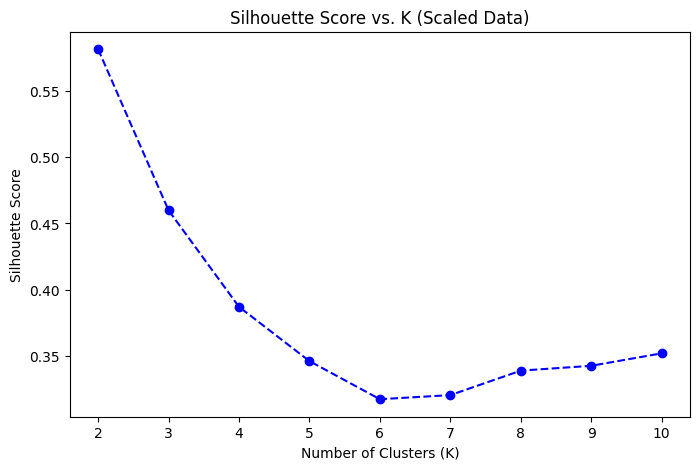

The best K (based on silhouette score) is: 2


In [ ]:
from sklearn.metrics import silhouette_score

# Define range for K
K_range = range(2, 11)  # Testing K from 2 to 10
silhouette_scores = []  # Store silhouette scores

# Loop through different values of K
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)  # Get cluster labels

    # Compute silhouette score
    score = silhouette_score(X_scaled, labels)
    silhouette_scores.append(score)
    print(f"Silhouette score for k={k}: {score:.4f}")

# Plot Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(K_range, silhouette_scores, marker='o', linestyle='--', color='b')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs. K (Scaled Data)")
plt.show()

# Find the best K (highest silhouette score)
optimal_K_silhouette = K_range[np.argmax(silhouette_scores)]
print(f"The best K (based on silhouette score) is: {optimal_K_silhouette}")

# Store the best silhouette score for later comparison
best_silhouette_score = max(silhouette_scores)


In [ ]:
#As one can see the silhouette score method yet again choose k=2 as the best k for this dataset

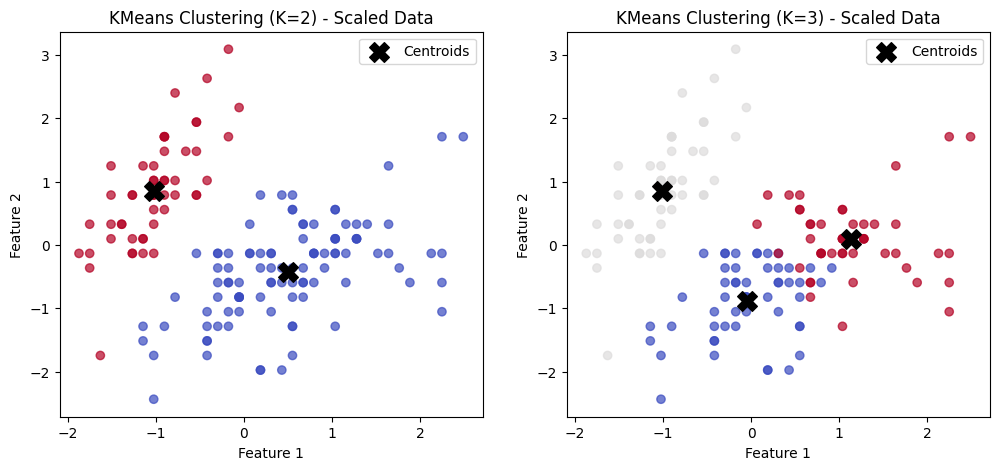

In [ ]:
#Apply kmeans using k=2 (the result of our analysis) and k=3 (expected from looking at the dataset initially)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler

# Load the Iris dataset
iris = load_iris()
X_scaled = StandardScaler().fit_transform(iris.data)  # Scale the features

# Perform KMeans clustering for K=2 and K=3
kmeans_2 = KMeans(n_clusters=2, random_state=42, n_init=10).fit(X_scaled)
kmeans_3 = KMeans(n_clusters=3, random_state=42, n_init=10).fit(X_scaled)

# Get cluster labels and centroids
labels_2 = kmeans_2.labels_
labels_3 = kmeans_3.labels_
centroids_2 = kmeans_2.cluster_centers_
centroids_3 = kmeans_3.cluster_centers_

# Define colors for clarity
colors = ['red', 'blue', 'green']
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot for K=2
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels_2, cmap='coolwarm', alpha=0.7)
axes[0].scatter(centroids_2[:, 0], centroids_2[:, 1], c='black', marker='X', s=200, label='Centroids')
axes[0].set_title('KMeans Clustering (K=2) - Scaled Data')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
axes[0].legend()

# Plot for K=3
axes[1].scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels_3, cmap='coolwarm', alpha=0.7)
axes[1].scatter(centroids_3[:, 0], centroids_3[:, 1], c='black', marker='X', s=200, label='Centroids')
axes[1].set_title('KMeans Clustering (K=3) - Scaled Data')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')
axes[1].legend()

plt.show()

In [ ]:
#Efffects of Scaling on Kmeans in the Iris Dataset

# Observations on the impact of scaling on K-Means clustering:

# 1. Did Scaling Change the Clustering Result?
#    - Yes, scaling affected the clustering results because K-Means relies on distances.
#    - Before scaling, features with larger values (like petal length and width) had more influence.
#    - After scaling, all features contributed equally, changing how clusters were formed.

# 2. Why Did the Silhouette Score Drop After Scaling?
#    - The silhouette score tells us how well the clusters are separated.
#    - Before scaling, clustering was mainly based on petal features, which made the clusters
#      clearer and more distinct.
#    - After scaling, sepal features influenced clustering more, but they don’t separate
#      the species as well.
#    - This caused more overlap between clusters and led to a lower silhouette score.

# 3.  Scaling Didn’t Help Here
#    - Scaling didn’t fix the issue of K-Means favoring K=2 instead of K=3.
#    - In fact, it made things worse by giving equal weight to less helpful features.
#    - This shows that scaling isn’t always a magic fix—it depends on the dataset
#      and how the features contribute to the clustering.

Silhouette Score for affinity=euclidean, linkage=average, distance_threshold=2: 0.6867350732769777


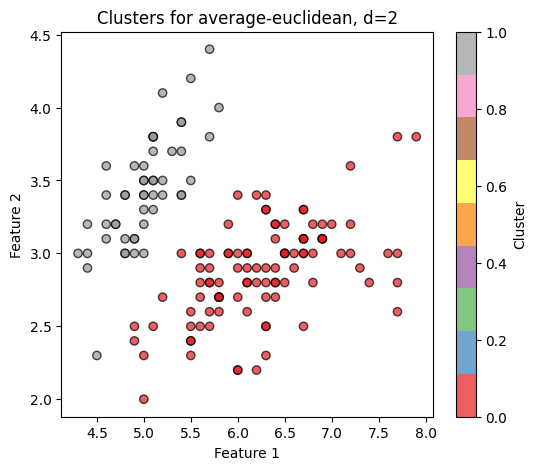

Silhouette Score for affinity=euclidean, linkage=complete, distance_threshold=2: 0.33820313796202034


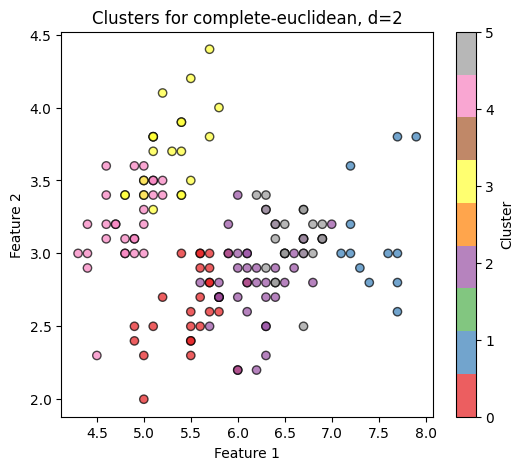

Silhouette Score for affinity=euclidean, linkage=complete, distance_threshold=5: 0.5159829508133176


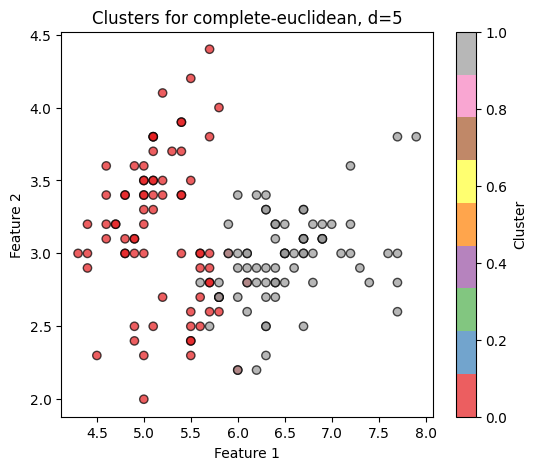

Silhouette Score for affinity=euclidean, linkage=ward, distance_threshold=2: 0.3304886352874657


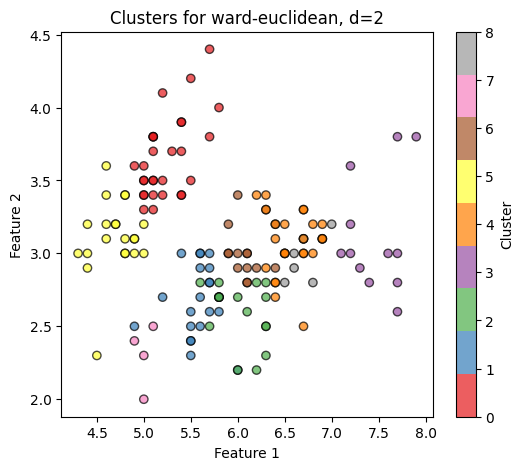

Silhouette Score for affinity=euclidean, linkage=ward, distance_threshold=5: 0.4889670857554692


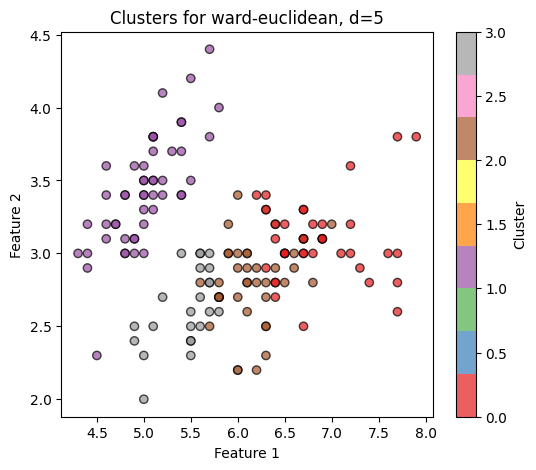

Silhouette Score for affinity=euclidean, linkage=ward, distance_threshold=10: 0.5543236611296419


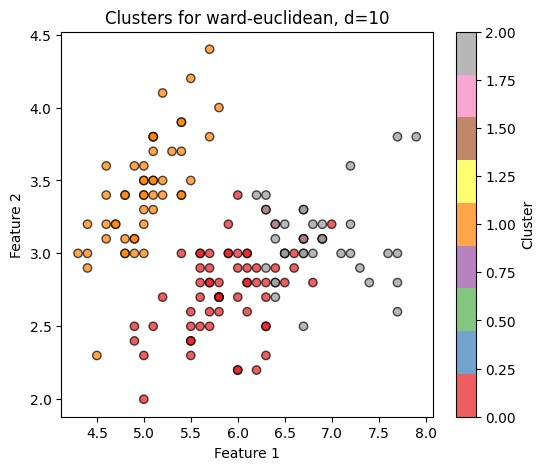

Silhouette Score for affinity=manhattan, linkage=average, distance_threshold=2: 0.43184804588959724


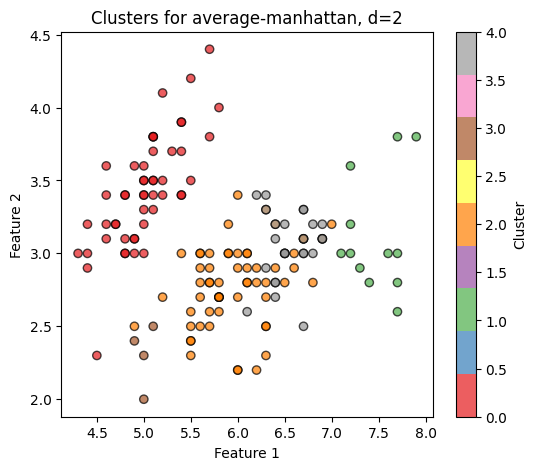

Silhouette Score for affinity=manhattan, linkage=average, distance_threshold=5: 0.6867350732769777


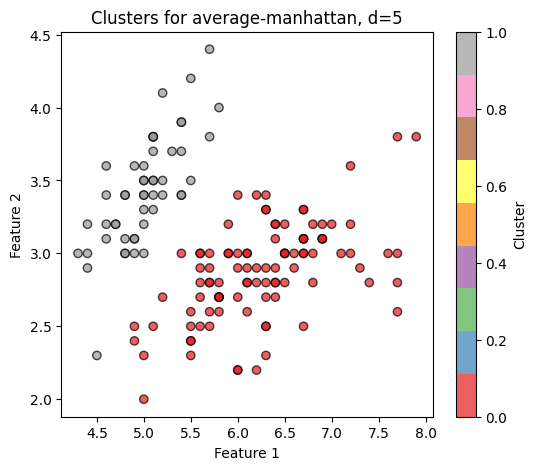

Silhouette Score for affinity=manhattan, linkage=single, distance_threshold=2: 0.6867350732769777


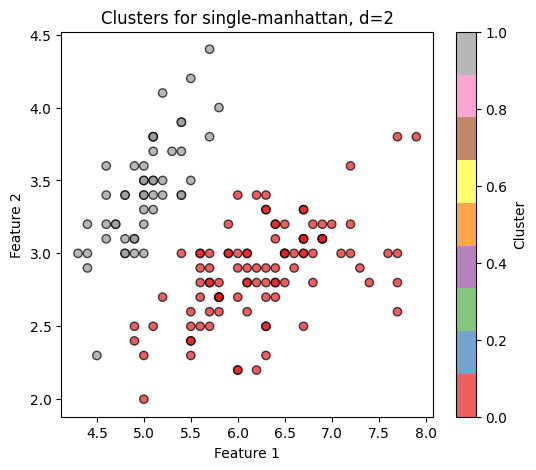

Silhouette Score for affinity=manhattan, linkage=complete, distance_threshold=2: 0.26590529939995255


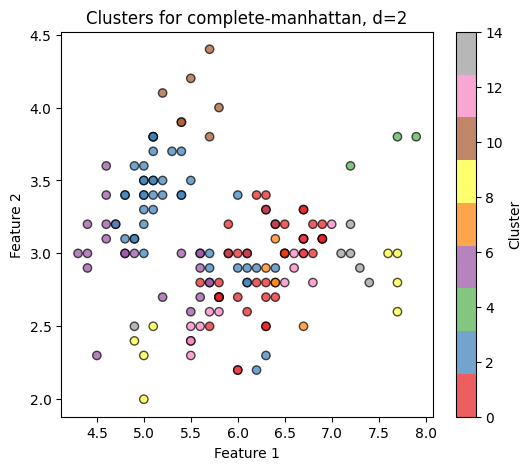

Silhouette Score for affinity=manhattan, linkage=complete, distance_threshold=5: 0.5543665902228473


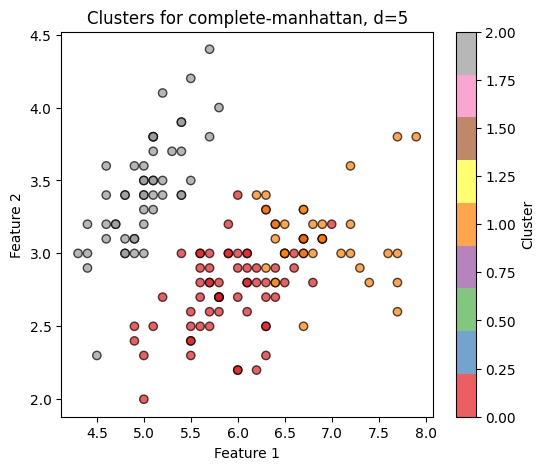

Silhouette Score for affinity=manhattan, linkage=complete, distance_threshold=10: 0.3090678928111287


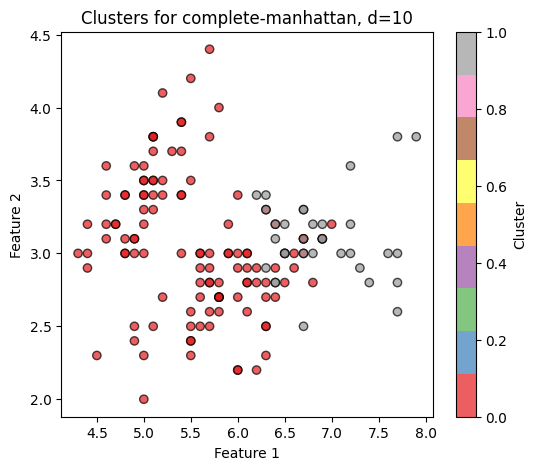


Best Agglomerative Clustering configuration:
{'affinity': 'euclidean', 'linkage': 'average', 'distance_threshold': 2, 'silhouette_score': 0.6867350732769777}


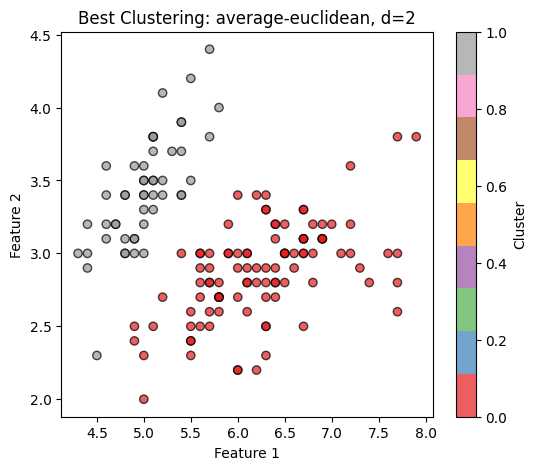

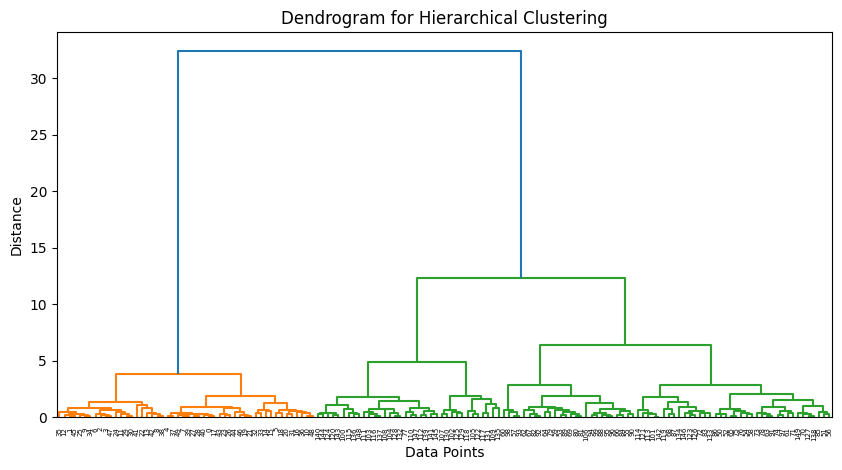

In [ ]:
#Apply Agglomerative clustering for the unscaled iris dataset

import numpy as np
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler


linkage_list = ["average", "single", "complete", "ward"]
affinity_list = ["euclidean", "manhattan", "cosine"]
distance_thresholds = [2, 5, 10]  # Try different distance thresholds

best_silhouette = -1
best_params = {}

# Loop over different clustering configurations
for affinity in affinity_list:
    for linkage in linkage_list:
        for distance_threshold in distance_thresholds:
            # Skip invalid combinations (ward only works with euclidean)
            if linkage == "ward" and affinity != "euclidean":
                continue

            # Create the model
            model = AgglomerativeClustering(n_clusters=None,
                                            metric=affinity,
                                            linkage=linkage,
                                            distance_threshold=distance_threshold,
                                            compute_full_tree=True)

            labels = model.fit_predict(iris_data.data)

            # Ensure the model created more than 1 cluster before evaluating silhouette score
            if len(set(labels)) > 1:
                silhouette = silhouette_score(iris_data.data, labels)
                print(f"Silhouette Score for affinity={affinity}, linkage={linkage}, distance_threshold={distance_threshold}: {silhouette}")

                # Save best model parameters
                if silhouette > best_silhouette:
                    best_silhouette = silhouette
                    best_params = {
                        "affinity": affinity,
                        "linkage": linkage,
                        "distance_threshold": distance_threshold,
                        "silhouette_score": silhouette
                    }
                    best_labels = labels  # Store labels for the best clustering

                # Plot clustering result for each trial
                plt.figure(figsize=(6, 5))
                plt.scatter(iris_data.data[:, 0], iris_data.data[:, 1], c=labels, cmap='Set1', edgecolors='k', alpha=0.7)
                plt.title(f"Clusters for {linkage}-{affinity}, d={distance_threshold}")
                plt.xlabel("Feature 1")
                plt.ylabel("Feature 2")
                plt.colorbar(label="Cluster")
                plt.show()

# Print the best configuration
print("\nBest Agglomerative Clustering configuration:")
print(best_params)

# Plot the best clustering result
plt.figure(figsize=(6, 5))
plt.scatter(iris_data.data[:, 0], iris_data.data[:, 1], c=best_labels, cmap='Set1', edgecolors='k', alpha=0.7)
plt.title(f"Best Clustering: {best_params['linkage']}-{best_params['affinity']}, d={best_params['distance_threshold']}")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.colorbar(label="Cluster")
plt.show()

# --- Plot a Dendrogram for a single trial ---
plt.figure(figsize=(10, 5))
linked = sch.linkage(iris_data.data, method="ward")  # Use "ward" for a clear dendrogram
sch.dendrogram(linked)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()



In [ ]:
#The best parameters as per the output of the previous cell:
#'affinity': 'euclidean', 'linkage': 'average', 'distance_threshold': 2, 'silhouette_score': 0.6867350732769777}, it clustered the data into two clusters

In [ ]:
# Observations on Agglomerative Clustering for the Unscaled Iris Dataset:

# 1 Best Parameters Found:
# -  Affinity: Euclidean
# -  Linkage: Average
# -  Distance Threshold: 2
# -  Silhouette Score: 0.687 (highest achieved)
# -  Number of Clusters: 2

# 2 Why Did These Parameters Work Best?
# - Euclidean distance: This makes sense because it naturally captures the spread of the data in a meaningful way.
# - Average linkage: It balances between complete and single linkage—forming clusters that are neither too tight (like complete) nor too loose (like single).
# - Distance threshold of 2: This allowed the algorithm to form well-separated clusters without over-merging or over-splitting.

# 3 How Did Other Parameters Perform?
# - Manhattan distance: Performed slightly worse, likely because it doesn't capture the true shape of the data as well.
# - Cosine distance: Didn't work well at all—it’s better for text data, not numerical datasets like Iris.
# - Single linkage: Created long, stretched clusters that didn’t represent the true groups.
# - Complete linkage: Sometimes over-separated the data, leading to lower silhouette scores.

# 4 Summary:
# - Choosing Euclidean + Average Linkage gave balanced, well-separated clusters.
# - The silhouette score of 0.687 suggests that these clusters are well-defined.
# - If the dataset had different scaling or distributions, other parameters might have worked better,
#   but for the unscaled Iris dataset, this was the optimal choice.


Silhouette Score for affinity=euclidean, linkage=average, distance_threshold=2: 0.3248248440740702


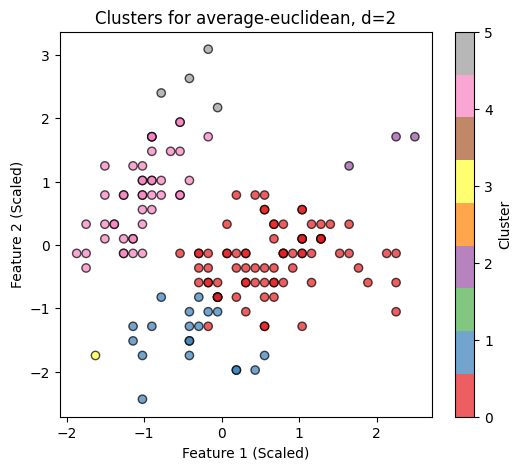

Silhouette Score for affinity=euclidean, linkage=complete, distance_threshold=2: 0.33069471793151667


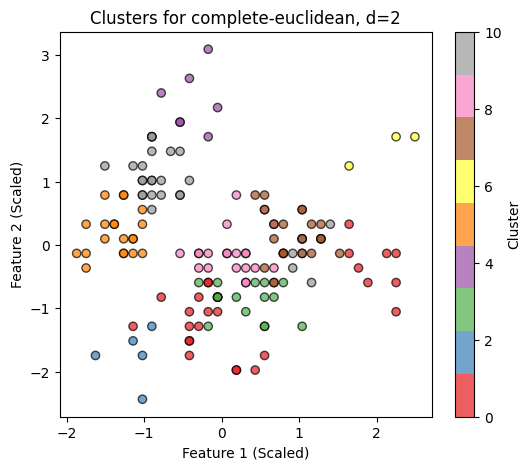

Silhouette Score for affinity=euclidean, linkage=complete, distance_threshold=5: 0.44961848359884726


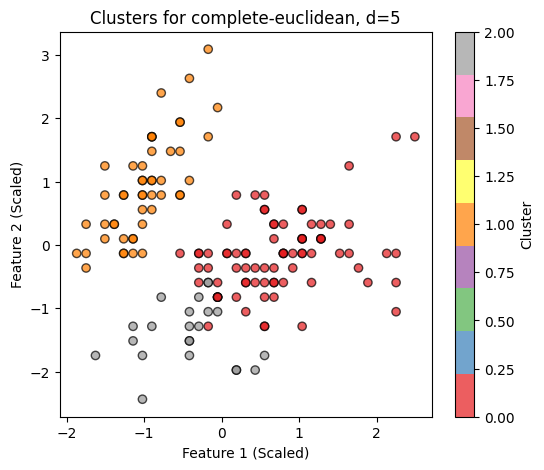

Silhouette Score for affinity=euclidean, linkage=ward, distance_threshold=2: 0.30868352719401204


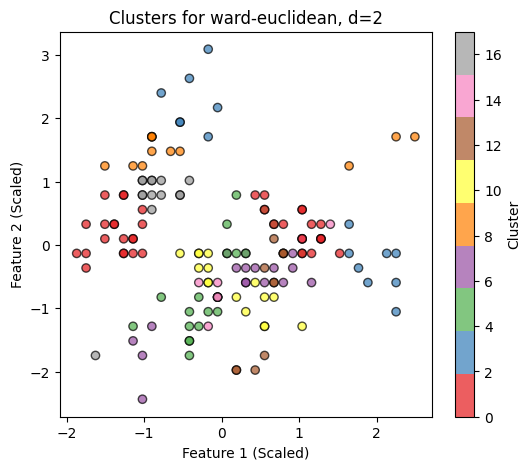

Silhouette Score for affinity=euclidean, linkage=ward, distance_threshold=5: 0.33058726295230545


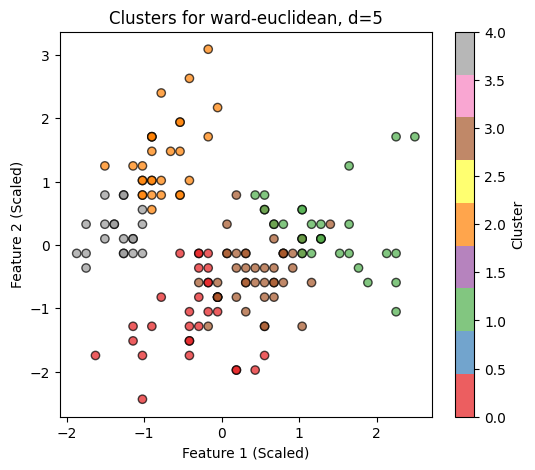

Silhouette Score for affinity=euclidean, linkage=ward, distance_threshold=10: 0.4466890410285909


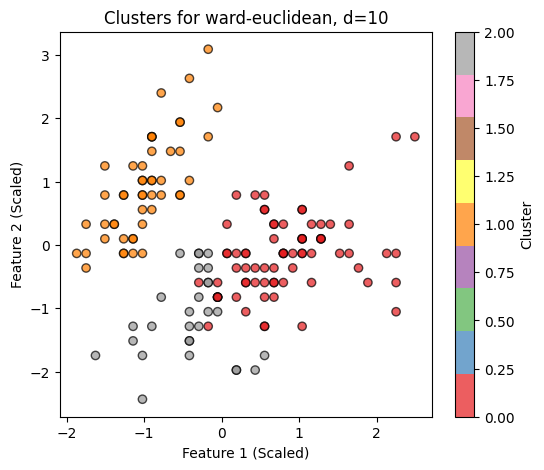

Silhouette Score for affinity=manhattan, linkage=average, distance_threshold=2: 0.2967728660671392


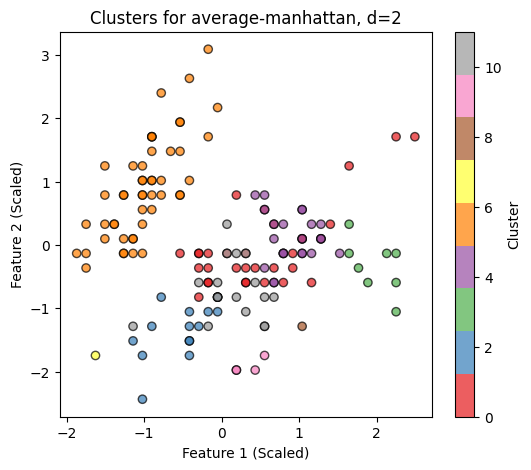

Silhouette Score for affinity=manhattan, linkage=average, distance_threshold=5: 0.5817500491982808


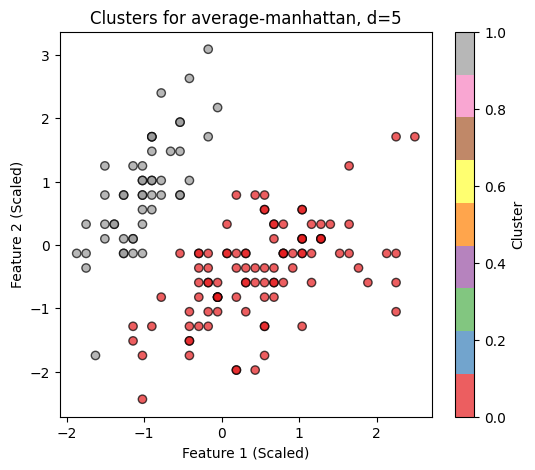

Silhouette Score for affinity=manhattan, linkage=single, distance_threshold=2: 0.5817500491982808


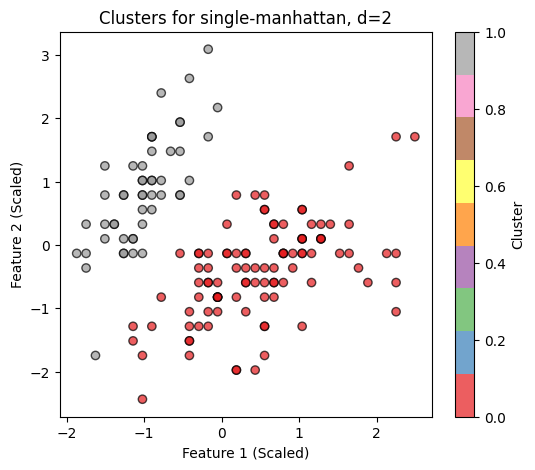

Silhouette Score for affinity=manhattan, linkage=complete, distance_threshold=2: 0.2553152208565517


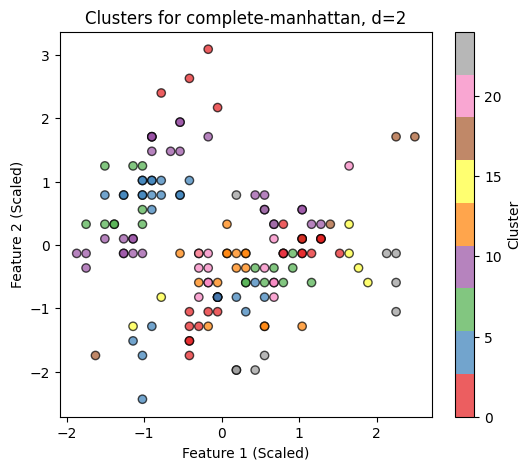

Silhouette Score for affinity=manhattan, linkage=complete, distance_threshold=5: 0.353097686029987


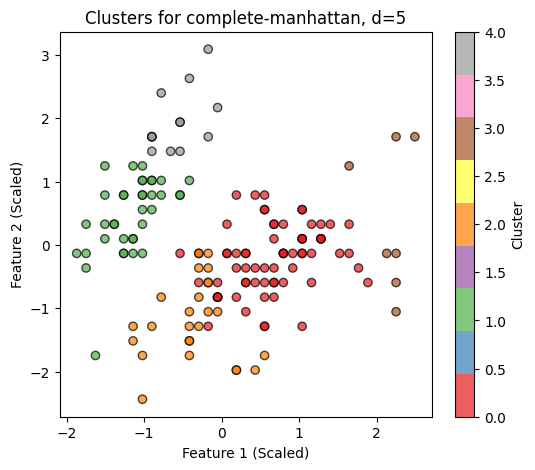

Silhouette Score for affinity=manhattan, linkage=complete, distance_threshold=10: 0.430243819708251


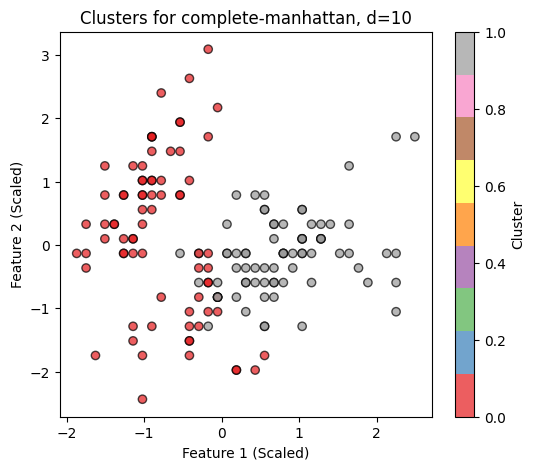


Best Agglomerative Clustering configuration on scaled data:
{'affinity': 'manhattan', 'linkage': 'average', 'distance_threshold': 5, 'silhouette_score': 0.5817500491982808}


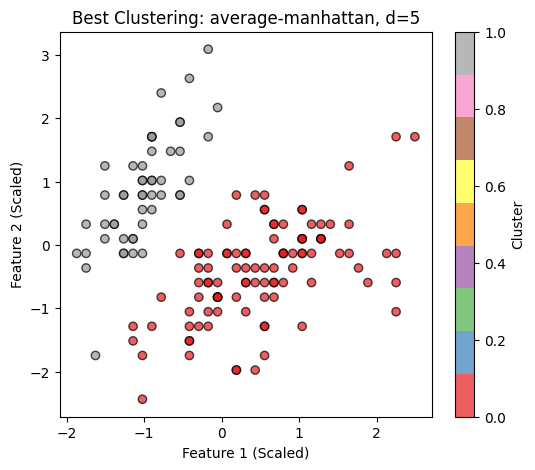

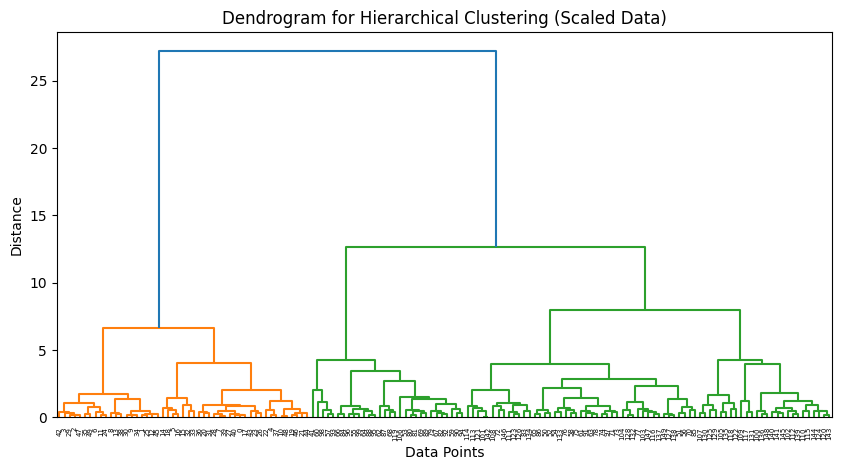

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import pandas as pd
from sklearn.datasets import load_iris

# Load the Iris dataset
iris_data = load_iris()
iris_df = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)

# Scale the dataset
scaler = StandardScaler()
scaled_data = scaler.fit_transform(iris_df)

# Lists of parameters to try
linkage_list = ["average", "single", "complete", "ward"]
affinity_list = ["euclidean", "manhattan", "cosine"]
distance_thresholds = [2, 5, 10]  # Try different distance thresholds

best_silhouette = -1
best_params = {}

# Loop over different clustering configurations
for affinity in affinity_list:
    for linkage in linkage_list:
        for distance_threshold in distance_thresholds:
            # Skip invalid combinations (ward only works with euclidean)
            if linkage == "ward" and affinity != "euclidean":
                continue

            # Create the AgglomerativeClustering model
            model = AgglomerativeClustering(n_clusters=None,
                                            metric=affinity,
                                            linkage=linkage,
                                            distance_threshold=distance_threshold,
                                            compute_full_tree=True)

            labels = model.fit_predict(scaled_data)

            # Ensure at least 2 clusters exist before calculating silhouette score
            if len(set(labels)) > 1:
                silhouette = silhouette_score(scaled_data, labels)
                print(f"Silhouette Score for affinity={affinity}, linkage={linkage}, distance_threshold={distance_threshold}: {silhouette}")

                # Store the best model parameters
                if silhouette > best_silhouette:
                    best_silhouette = silhouette
                    best_params = {
                        "affinity": affinity,
                        "linkage": linkage,
                        "distance_threshold": distance_threshold,
                        "silhouette_score": silhouette
                    }
                    best_labels = labels  # Store labels for the best clustering

                # Plot clustering result for each trial
                plt.figure(figsize=(6, 5))
                plt.scatter(scaled_data[:, 0], scaled_data[:, 1], c=labels, cmap='Set1', edgecolors='k', alpha=0.7)
                plt.title(f"Clusters for {linkage}-{affinity}, d={distance_threshold}")
                plt.xlabel("Feature 1 (Scaled)")
                plt.ylabel("Feature 2 (Scaled)")
                plt.colorbar(label="Cluster")
                plt.show()

# Print the best configuration
print("\nBest Agglomerative Clustering configuration on scaled data:")
print(best_params)

# Plot the best clustering result
plt.figure(figsize=(6, 5))
plt.scatter(scaled_data[:, 0], scaled_data[:, 1], c=best_labels, cmap='Set1', edgecolors='k', alpha=0.7)
plt.title(f"Best Clustering: {best_params['linkage']}-{best_params['affinity']}, d={best_params['distance_threshold']}")
plt.xlabel("Feature 1 (Scaled)")
plt.ylabel("Feature 2 (Scaled)")
plt.colorbar(label="Cluster")
plt.show()

# --- Plot a Dendrogram for a single trial ---
plt.figure(figsize=(10, 5))
linked = sch.linkage(scaled_data, method="ward")  # Use "ward" for a clear dendrogram
sch.dendrogram(linked)
plt.title("Dendrogram for Hierarchical Clustering (Scaled Data)")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()


In [ ]:
#The best parameters as per the output of the previous cell:
#'affinity': 'manhattan', 'linkage': 'average', 'distance_threshold': 5, 'silhouette_score': 0.5817500491982808},
#it clustered the data into 2 clusters

In [ ]:
# --- Observations on Agglomerative Clustering with Scaling ---

# Scaling didn't drastically change the clustering this time—we still got 2 clusters,
# and the data assignments look quite similar to the unscaled version.

# However, the silhouette score and the best parameters changed after scaling.

# - The silhouette score actually worsened after scaling (0.68 vs 0.58 after scaling),
#   meaning the clusters became less well-defined.
# - The best parameters also shifted: after scaling, the best combination was
#   Manhattan distance with d=5, but before scaling, it was Euclidean distance with d=2.
# - This tells us that scaling affected how distances were measured, which in turn
#   influenced how the algorithm grouped points.

# Unlike K-Means, which is highly sensitive to scaling, Agglomerative Clustering is
# more robust since it builds a hierarchy of clusters instead of relying purely on
# distances between individual points.

# Even though the silhouette score changed, the visual clusters looked nearly the same.
# This suggests that scaling mainly influenced the numerical evaluation rather than
# completely altering the way clusters were formed.

eps: 0.31, min_samples: 5, Clusters: 4, Silhouette Score: -0.0245
eps: 0.51, min_samples: 5, Clusters: 2, Silhouette Score: 0.4996
eps: 0.51, min_samples: 10, Clusters: 2, Silhouette Score: 0.4591
eps: 0.51, min_samples: 15, Clusters: 4, Silhouette Score: 0.2657
eps: 0.72, min_samples: 5, Clusters: 2, Silhouette Score: 0.5018
eps: 0.72, min_samples: 10, Clusters: 2, Silhouette Score: 0.5346
eps: 0.72, min_samples: 15, Clusters: 2, Silhouette Score: 0.5346
eps: 0.72, min_samples: 20, Clusters: 2, Silhouette Score: 0.5315
eps: 0.72, min_samples: 25, Clusters: 2, Silhouette Score: 0.4878
eps: 0.93, min_samples: 5, Clusters: 2, Silhouette Score: 0.6867
eps: 0.93, min_samples: 10, Clusters: 2, Silhouette Score: 0.6867
eps: 0.93, min_samples: 15, Clusters: 2, Silhouette Score: 0.5283
eps: 0.93, min_samples: 20, Clusters: 2, Silhouette Score: 0.5283
eps: 0.93, min_samples: 25, Clusters: 2, Silhouette Score: 0.5283
eps: 1.14, min_samples: 5, Clusters: 2, Silhouette Score: 0.6867
eps: 1.14, min

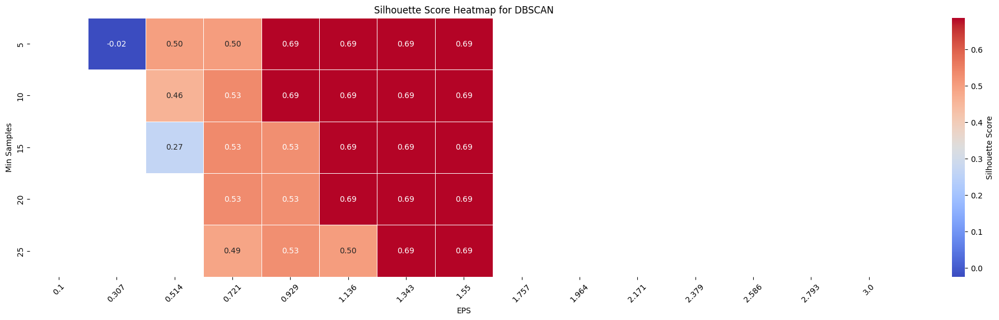


Best Parameters:
EPS: 0.929, Min Samples: 5, Clusters: 2
Best Silhouette Score: 0.6867


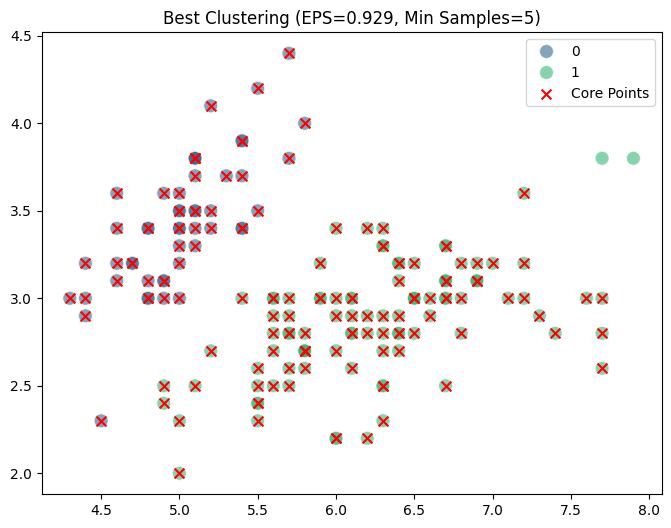

In [ ]:
#DBSCAN for the unscaled iris dataset

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from itertools import product

# Define parameter ranges
eps_values = np.linspace(0.1, 3, 15)  # Reduce number of steps for clarity
min_samples_values = range(5, 30, 5)  # More range for Min Samples

# Store results
results = []
best_score = -1
best_params = None

# Iterate over eps and min_samples
for eps, min_samples in product(eps_values, min_samples_values):
    model = DBSCAN(eps=eps, min_samples=min_samples)
    labels = model.fit_predict(iris_data.data)

    # Get number of clusters (excluding noise)
    n_clusters = len(set(labels) - {-1})

    # Ignore cases with only 1 cluster or no clusters
    if n_clusters > 1:
        score = silhouette_score(iris_data.data, labels)
        results.append((eps, min_samples, score, n_clusters))

        # Update best score
        if score > best_score:
            best_score = score
            best_params = (eps, min_samples, n_clusters)

        # Print each iteration's results
        print(f"eps: {eps:.2f}, min_samples: {min_samples}, Clusters: {n_clusters}, Silhouette Score: {score:.4f}")

# Convert results to a NumPy array
results = np.array(results, dtype=object)

# Create a pivot table for heatmap
heatmap_data = np.full((len(min_samples_values), len(eps_values)), np.nan)

for i, min_samples in enumerate(min_samples_values):
    for j, eps in enumerate(eps_values):
        match = results[(results[:, 0] == eps) & (results[:, 1] == min_samples)]
        if len(match) > 0:
            heatmap_data[i, j] = match[0, 2]  # Silhouette score

# Plot the heatmap
plt.figure(figsize=(25, 6))
ax = sns.heatmap(heatmap_data, xticklabels=np.round(eps_values, 3),
                 yticklabels=min_samples_values, cmap="coolwarm", annot=True,
                 fmt=".2f", linewidths=0.5, cbar_kws={'label': 'Silhouette Score'})

plt.xlabel("EPS")
plt.ylabel("Min Samples")
plt.xticks(rotation=45)  # Rotate labels for readability
plt.title("Silhouette Score Heatmap for DBSCAN")
plt.show()

# Print Best Parameters
print("\nBest Parameters:")
print(f"EPS: {best_params[0]:.3f}, Min Samples: {best_params[1]}, Clusters: {best_params[2]}")
print(f"Best Silhouette Score: {best_score:.4f}")

# Plot best clustering result
best_eps, best_min_samples, _ = best_params
best_model = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_model.fit_predict(iris_data.data)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=iris_data.data[:, 0], y=iris_data.data[:, 1], hue=best_labels, palette='viridis', alpha=0.6, s=100)
plt.scatter(best_model.components_[:, 0], best_model.components_[:, 1], c='red', marker='x', s=50, label='Core Points')
plt.title(f"Best Clustering (EPS={best_eps:.3f}, Min Samples={best_min_samples})")
plt.legend()
plt.show()

eps: 0.31, min_samples: 5, Clusters: 3, Silhouette Score: -0.1942
eps: 0.51, min_samples: 5, Clusters: 2, Silhouette Score: 0.3609
eps: 0.51, min_samples: 10, Clusters: 3, Silhouette Score: 0.0497
eps: 0.72, min_samples: 5, Clusters: 2, Silhouette Score: 0.5234
eps: 0.72, min_samples: 10, Clusters: 2, Silhouette Score: 0.4229
eps: 0.72, min_samples: 15, Clusters: 2, Silhouette Score: 0.3864
eps: 0.72, min_samples: 20, Clusters: 2, Silhouette Score: 0.2279
eps: 0.93, min_samples: 5, Clusters: 2, Silhouette Score: 0.5217
eps: 0.93, min_samples: 10, Clusters: 2, Silhouette Score: 0.5108
eps: 0.93, min_samples: 15, Clusters: 2, Silhouette Score: 0.5142
eps: 0.93, min_samples: 20, Clusters: 2, Silhouette Score: 0.4459
eps: 0.93, min_samples: 25, Clusters: 2, Silhouette Score: 0.4292
eps: 1.14, min_samples: 5, Clusters: 2, Silhouette Score: 0.5518
eps: 1.14, min_samples: 10, Clusters: 2, Silhouette Score: 0.5383
eps: 1.14, min_samples: 15, Clusters: 2, Silhouette Score: 0.5485
eps: 1.14, min

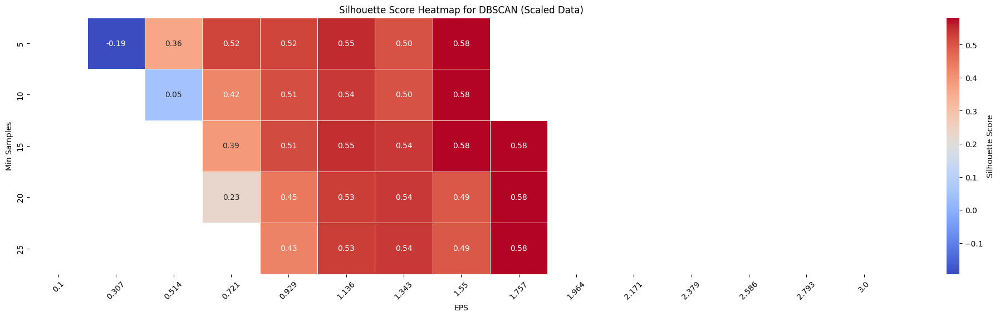


Best Parameters:
EPS: 1.550, Min Samples: 5, Clusters: 2
Best Silhouette Score: 0.5818


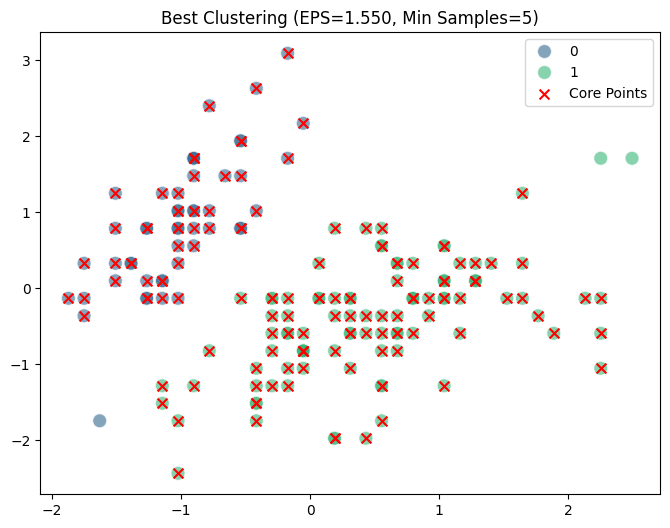

In [ ]:
# DBSCAN for the scaled iris dataset

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from itertools import product
from sklearn.datasets import load_iris

# Load the Iris dataset
iris_data = load_iris()
X = iris_data.data

# Standardize the dataset
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Using the scaled dataset

# Define parameter ranges
eps_values = np.linspace(0.1, 3, 15)  # Reduce number of steps for clarity
min_samples_values = range(5, 30, 5)  # More range for Min Samples

# Store results
results = []
best_score = -1
best_params = None

# Iterate over eps and min_samples
for eps, min_samples in product(eps_values, min_samples_values):
    model = DBSCAN(eps=eps, min_samples=min_samples)
    labels = model.fit_predict(X_scaled)  # Using the scaled dataset

    # Get number of clusters (excluding noise)
    n_clusters = len(set(labels) - {-1})

    # Ignore cases with only 1 cluster or no clusters
    if n_clusters > 1:
        score = silhouette_score(X_scaled, labels)  # Using the scaled dataset
        results.append((eps, min_samples, score, n_clusters))

        # Update best score
        if score > best_score:
            best_score = score
            best_params = (eps, min_samples, n_clusters)

        # Print each iteration's results
        print(f"eps: {eps:.2f}, min_samples: {min_samples}, Clusters: {n_clusters}, Silhouette Score: {score:.4f}")

# Convert results to a NumPy array
results = np.array(results, dtype=object)

# Create a pivot table for heatmap
heatmap_data = np.full((len(min_samples_values), len(eps_values)), np.nan)

for i, min_samples in enumerate(min_samples_values):
    for j, eps in enumerate(eps_values):
        match = results[(results[:, 0] == eps) & (results[:, 1] == min_samples)]
        if len(match) > 0:
            heatmap_data[i, j] = match[0, 2]  # Silhouette score

# Plot the heatmap
plt.figure(figsize=(25, 6))
ax = sns.heatmap(heatmap_data, xticklabels=np.round(eps_values, 3),
                 yticklabels=min_samples_values, cmap="coolwarm", annot=True,
                 fmt=".2f", linewidths=0.5, cbar_kws={'label': 'Silhouette Score'})

plt.xlabel("EPS")
plt.ylabel("Min Samples")
plt.xticks(rotation=45)  # Rotate labels for readability
plt.title("Silhouette Score Heatmap for DBSCAN (Scaled Data)")
plt.show()

# Print Best Parameters
print("\nBest Parameters:")
print(f"EPS: {best_params[0]:.3f}, Min Samples: {best_params[1]}, Clusters: {best_params[2]}")
print(f"Best Silhouette Score: {best_score:.4f}")

# Plot best clustering result
best_eps, best_min_samples, _ = best_params
best_model = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_model.fit_predict(X_scaled)  # Using the scaled dataset

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_scaled[:, 0], y=X_scaled[:, 1], hue=best_labels, palette='viridis', alpha=0.6, s=100)
plt.scatter(best_model.components_[:, 0], best_model.components_[:, 1], c='red', marker='x', s=50, label='Core Points')
plt.title(f"Best Clustering (EPS={best_eps:.3f}, Min Samples={best_min_samples})")
plt.legend()
plt.show()


In [ ]:
# Applying scaling altered the clustering outcome for DBSCAN.
# Since DBSCAN relies on point-to-point distances to define dense regions, modifying these distances through scaling influences cluster formation.
# When clusters are originally close together, scaling might cause them to merge into a single cluster.
# Conversely, if distances expand after scaling, some points that were previously grouped may now be classified as noise.
#
# The silhouette score also shifted post-scaling, reflecting a change in clustering quality.
# Unlike K-Means and Agglomerative Clustering, which primarily rely on relative positioning,
#DBSCAN is highly sensitive to density variations, making it particularly responsive to data scaling.

In [ ]:
# Analyzing Different Clustering Techniques
# - K-Means shines when dealing with well-separated, round clusters, but struggles with complex shapes.
# - Agglomerative Clustering is great for hierarchical patterns and adapts better to non-spherical groups.
# - DBSCAN is ideal for clusters with irregular boundaries but can be thrown off by varying densities.
#
# Impact of Scaling:
# - K-Means, being heavily distance-dependent, was significantly influenced by scaling.
# - Agglomerative Clustering handled scaling better, though the silhouette score still showed some variation.
# - DBSCAN was highly sensitive to scaling since it relies on density, which changes when distances are altered.
#
# Observations on the Iris Dataset:
# - Interestingly, none of the methods found the expected three clusters; instead, they all settled on two.
# - This suggests that the dataset’s structure makes it challenging for clustering algorithms to distinguish between Versicolor and Virginica.


* Repeat all the above clustering approaches and steps on the above data.
* Comment on the effect of scaling on clustering this dataset. Show the difference between clustering the data with and without   scaling.
* Compare between the different clustering approaches.
* Is your clustering outcome consistent with the labels?

## Customer dataset
Repeat all the above on the customer data set

In [1]:
#Upload the customer dataset
from google.colab import files
uploaded=files.upload()

Saving Customer data.csv to Customer data.csv


In [4]:
#Read the dataset into a dataframe
df = pd.read_csv("Customer data.csv")

In [5]:
df.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [6]:
df = df.fillna(0)
df = pd.get_dummies(df)

In [7]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

scaler = MinMaxScaler()
scaled_values = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_values, columns=df.columns)
scaled_df.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0.000000,0.0,0.0,0.844828,0.666667,0.324781,0.5,1.0
1,0.000500,1.0,1.0,0.068966,0.333333,0.420210,0.5,1.0
2,0.001001,0.0,0.0,0.534483,0.333333,0.195144,0.0,0.0
3,0.001501,0.0,0.0,0.465517,0.333333,0.496223,0.5,0.5
4,0.002001,0.0,0.0,0.603448,0.333333,0.413842,0.5,0.5


In [ ]:
#We perform MIN-MAX Scaling as using standard scaler will change the data's distribution which will skew the upcoming clustering algorithms.

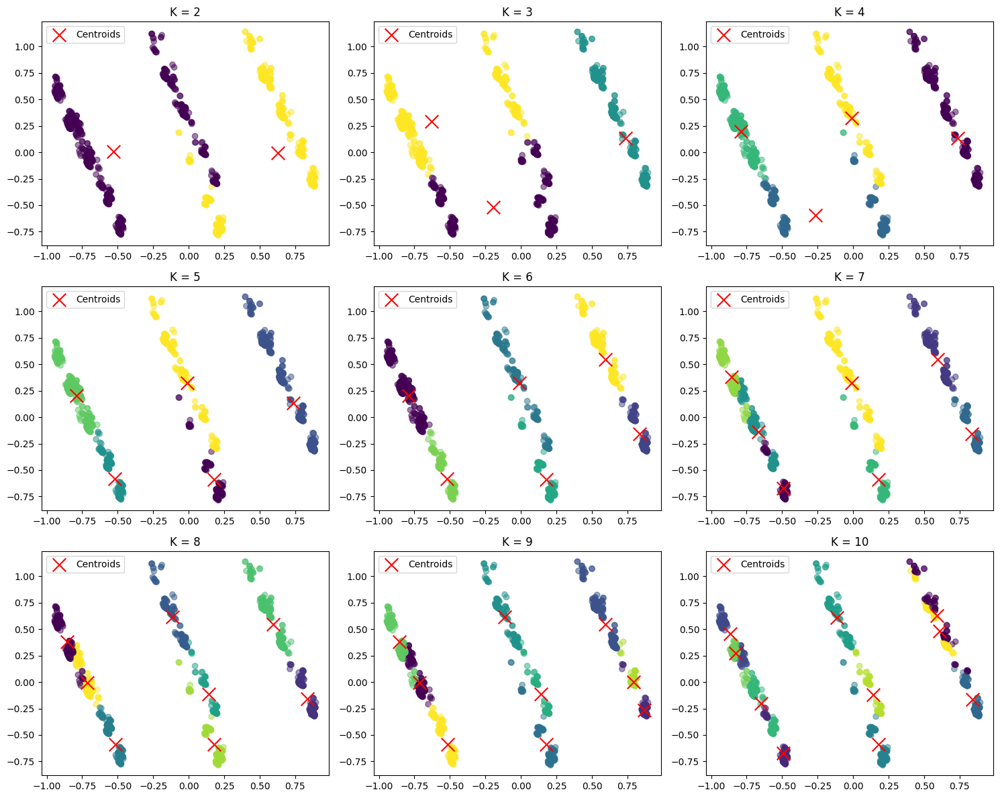

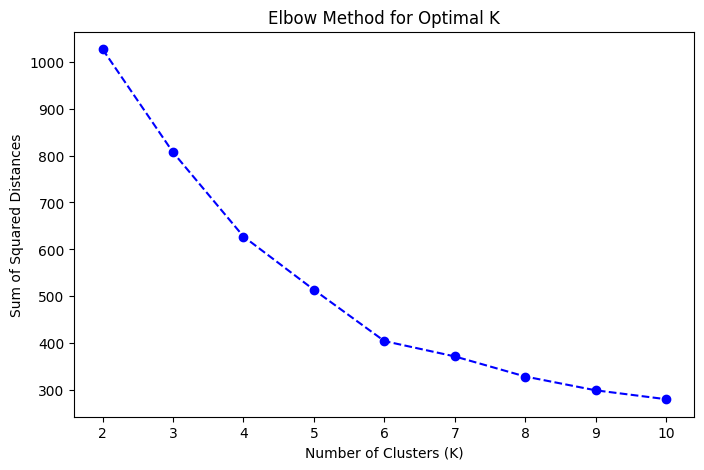

In [8]:
#Implement kmeans for the customer dataset and plot the sum of squared distances for the elbow method

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Assuming scaled_df is already defined and contains the scaled data
# Exclude the ID column if it exists
if 'ID' in scaled_df.columns:
    data_for_clustering = scaled_df.drop(columns=['ID'])
else:
    data_for_clustering = scaled_df

# Define range for K values
K_values = range(1, 11)
distortions = []

# Apply PCA to reduce dimensionality to 2D for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(data_for_clustering)

# Create subplots for clustering results
fig, axes = plt.subplots(3, 3, figsize=(15, 12))  # 3x3 grid for plots

for i, K in enumerate(K_values[1:]):  # Skip K=1 since clustering starts from K=2
    kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(data_for_clustering)
    distortions.append(kmeans.inertia_)

    # Scatter plot with PCA-reduced dimensions
    ax = axes[i // 3, i % 3]  # Position in subplot grid
    ax.scatter(reduced_data[:, 0], reduced_data[:, 1], c=clusters, cmap='viridis', alpha=0.5)

    # Plot the centroids in PCA-reduced space
    centroids_2D = pca.transform(kmeans.cluster_centers_)
    ax.scatter(centroids_2D[:, 0], centroids_2D[:, 1], marker='x', s=200, c='red', label='Centroids')
    ax.set_title(f'K = {K}')
    ax.legend()

plt.tight_layout()
plt.show()

# Plot distortion function (Elbow Method)
plt.figure(figsize=(8, 5))
plt.plot(K_values[1:], distortions, marker='o', linestyle='--', color='b')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances')
plt.title('Elbow Method for Optimal K')
plt.show()


In [ ]:
#Elbow is again not very clear so we will move on to the silhouette score method. However, there is some elbow at K = 6 which is
#verified by K=6 having the highest silhouette score in the next cell's output.

Silhouette Score for K=2: 0.3908
Silhouette Score for K=3: 0.3569
Silhouette Score for K=4: 0.4024
Silhouette Score for K=5: 0.4225
Silhouette Score for K=6: 0.4373
Silhouette Score for K=7: 0.4087
Silhouette Score for K=8: 0.4143
Silhouette Score for K=9: 0.4096

Best K: 6 with Silhouette Score: 0.4373


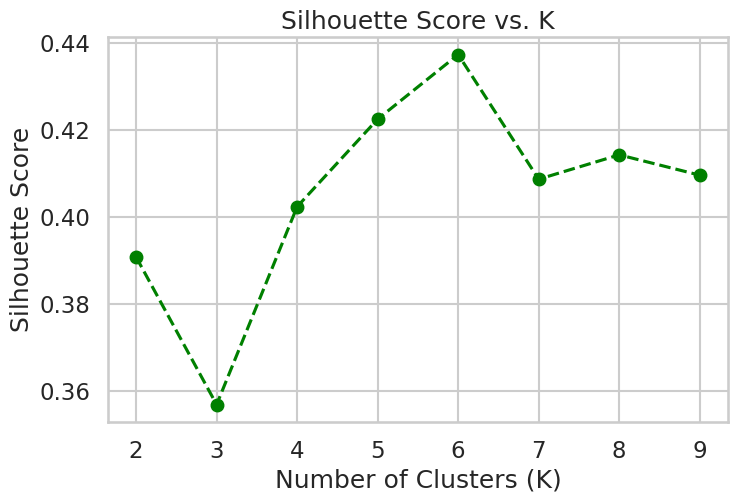

In [ ]:
#Start plotting the silhouette scores to choose optimum k

from sklearn.metrics import silhouette_score

# Define range for K values
K_values = range(2, 10)  # Silhouette score requires at least 2 clusters
silhouette_scores = {}

# Compute silhouette scores for each K
for K in K_values:
    kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(data_for_clustering)
    score = silhouette_score(data_for_clustering, clusters)
    silhouette_scores[K] = score
    print(f"Silhouette Score for K={K}: {score:.4f}")

# Find the best K (highest silhouette score)
best_K = max(silhouette_scores, key=silhouette_scores.get)
best_score = silhouette_scores[best_K]
print(f"\nBest K: {best_K} with Silhouette Score: {best_score:.4f}")

# Plot silhouette score vs. K
plt.figure(figsize=(8, 5))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), marker='o', linestyle='--', color='g')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. K')
plt.show()


In [ ]:
#Best K: 6 with Silhouette Score: 0.4373

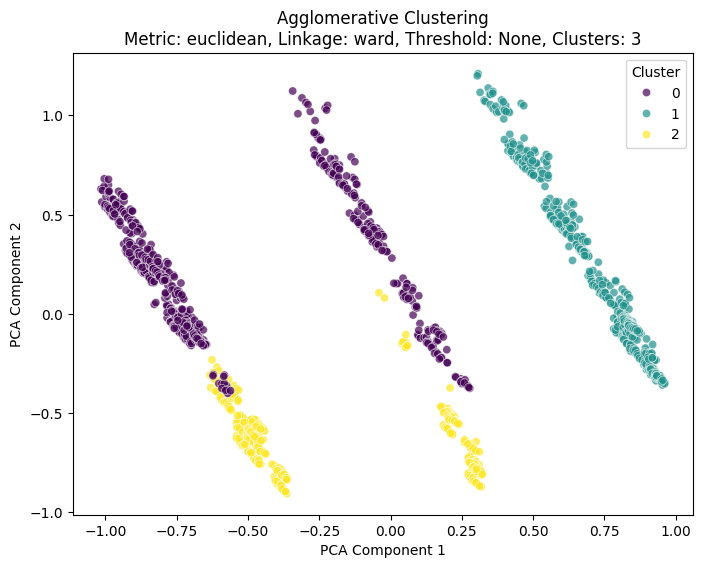

Silhouette Score (metric=euclidean, linkage=ward, threshold=None): 0.3139
Number of clusters: 3



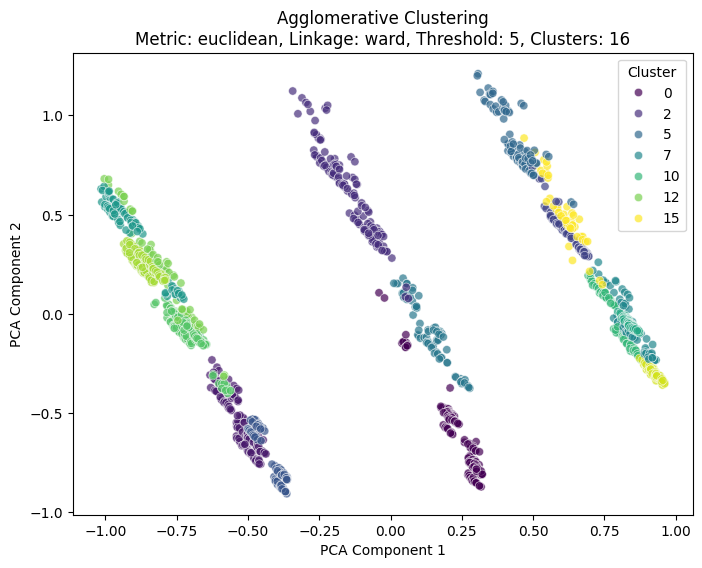

Silhouette Score (metric=euclidean, linkage=ward, threshold=5): 0.3618
Number of clusters: 16



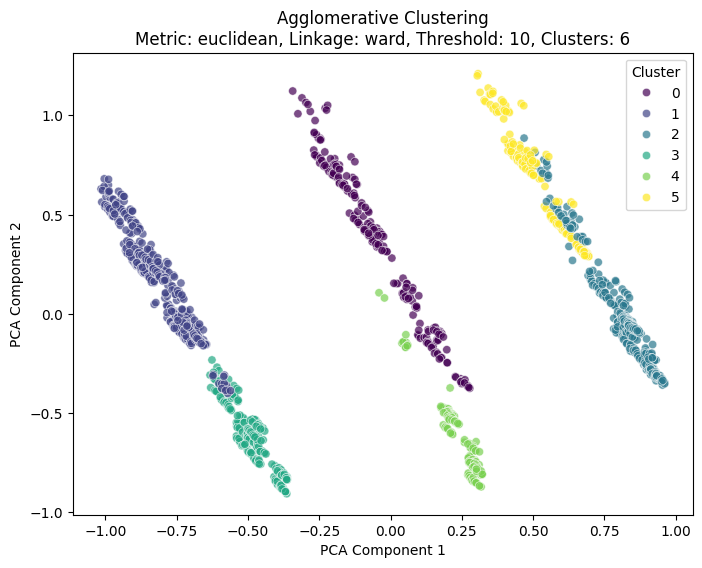

Silhouette Score (metric=euclidean, linkage=ward, threshold=10): 0.3641
Number of clusters: 6



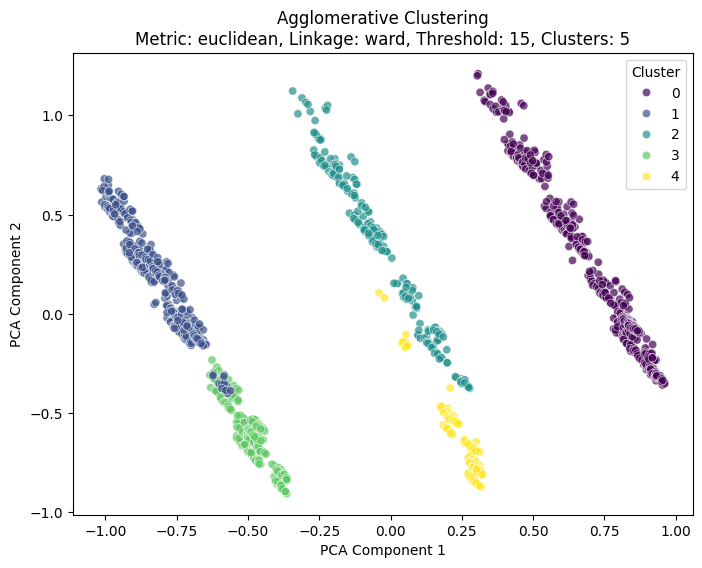

Silhouette Score (metric=euclidean, linkage=ward, threshold=15): 0.3654
Number of clusters: 5



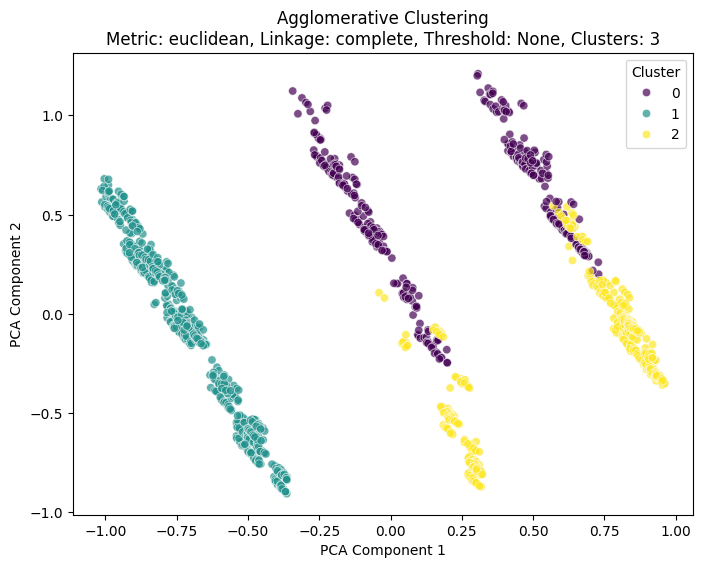

Silhouette Score (metric=euclidean, linkage=complete, threshold=None): 0.3091
Number of clusters: 3



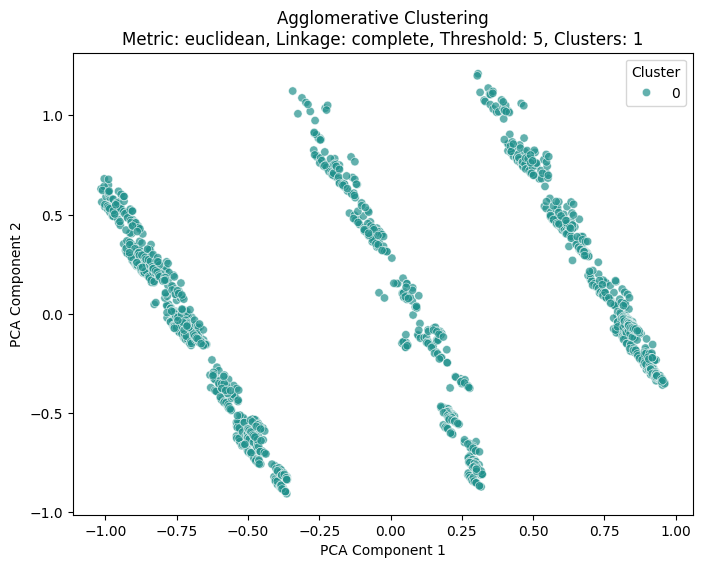

Silhouette Score (metric=euclidean, linkage=complete, threshold=5): -1.0000
Number of clusters: 1



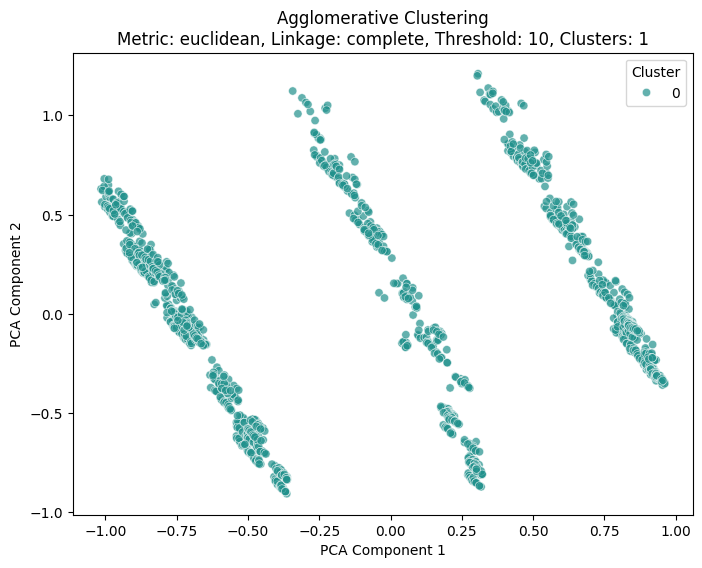

Silhouette Score (metric=euclidean, linkage=complete, threshold=10): -1.0000
Number of clusters: 1



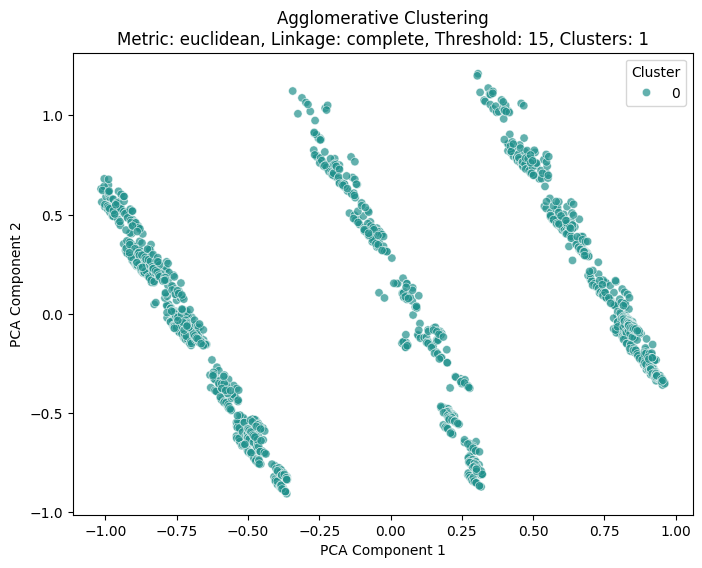

Silhouette Score (metric=euclidean, linkage=complete, threshold=15): -1.0000
Number of clusters: 1



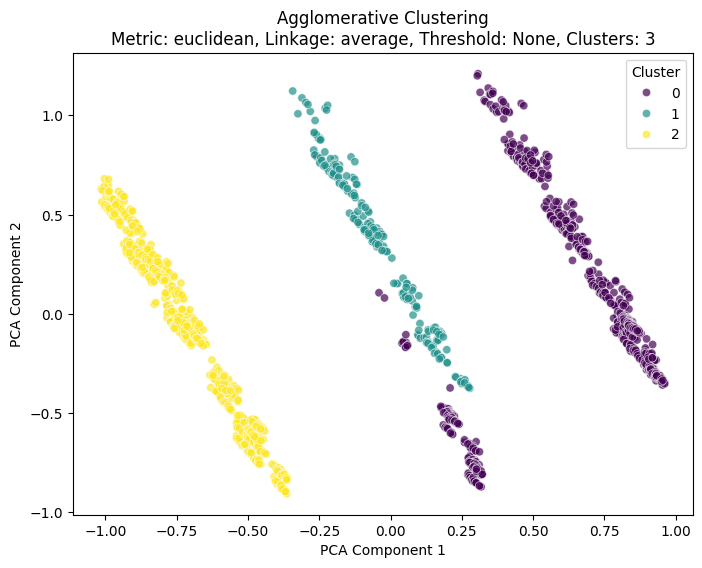

Silhouette Score (metric=euclidean, linkage=average, threshold=None): 0.3292
Number of clusters: 3



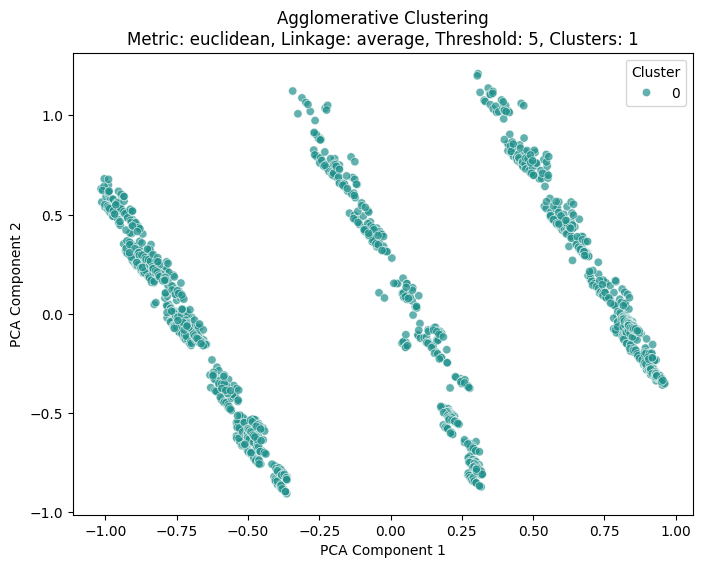

Silhouette Score (metric=euclidean, linkage=average, threshold=5): -1.0000
Number of clusters: 1



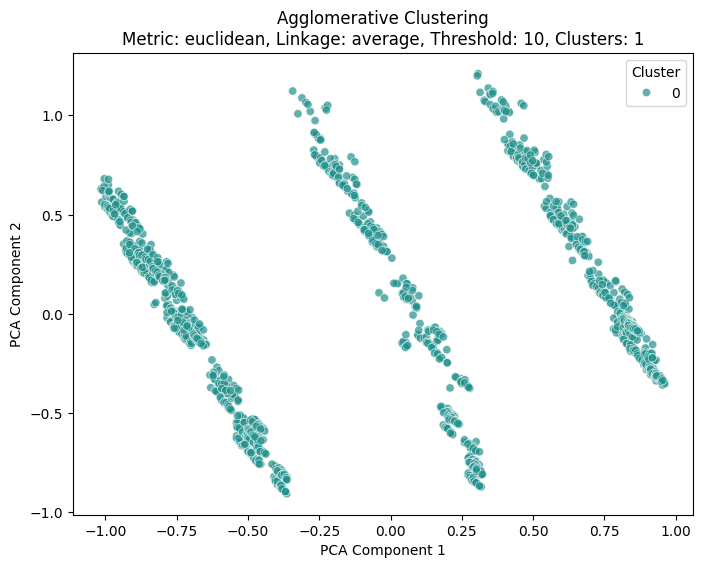

Silhouette Score (metric=euclidean, linkage=average, threshold=10): -1.0000
Number of clusters: 1



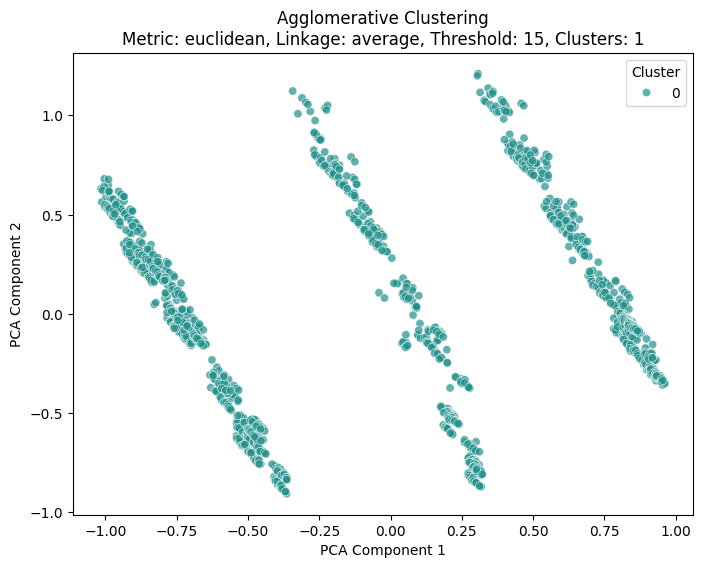

Silhouette Score (metric=euclidean, linkage=average, threshold=15): -1.0000
Number of clusters: 1



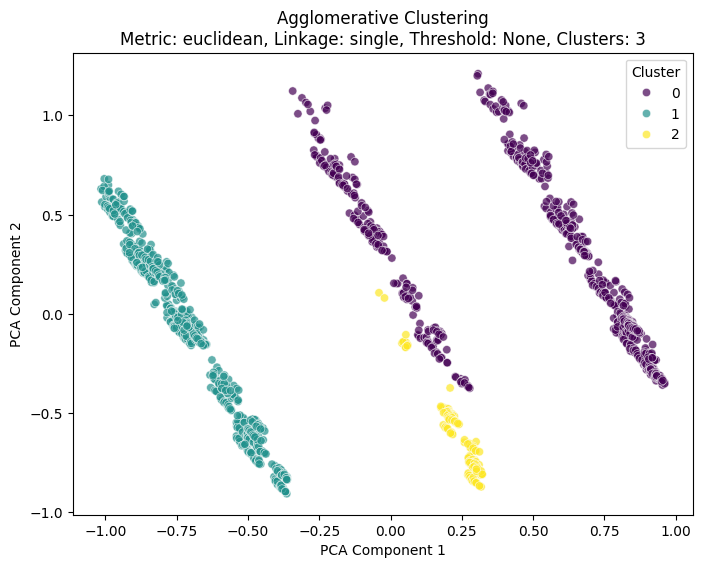

Silhouette Score (metric=euclidean, linkage=single, threshold=None): 0.3147
Number of clusters: 3



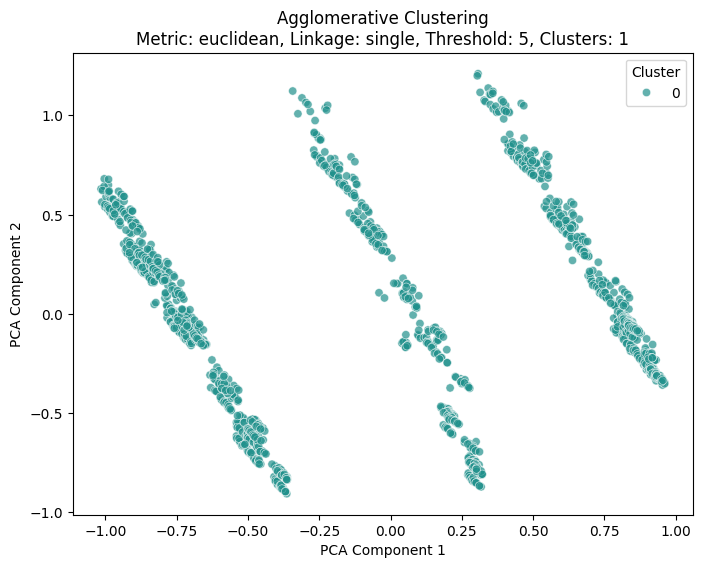

Silhouette Score (metric=euclidean, linkage=single, threshold=5): -1.0000
Number of clusters: 1



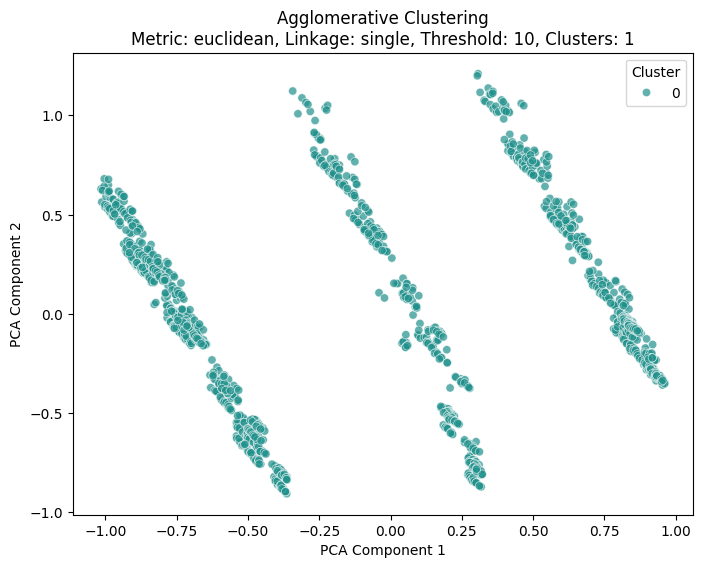

Silhouette Score (metric=euclidean, linkage=single, threshold=10): -1.0000
Number of clusters: 1



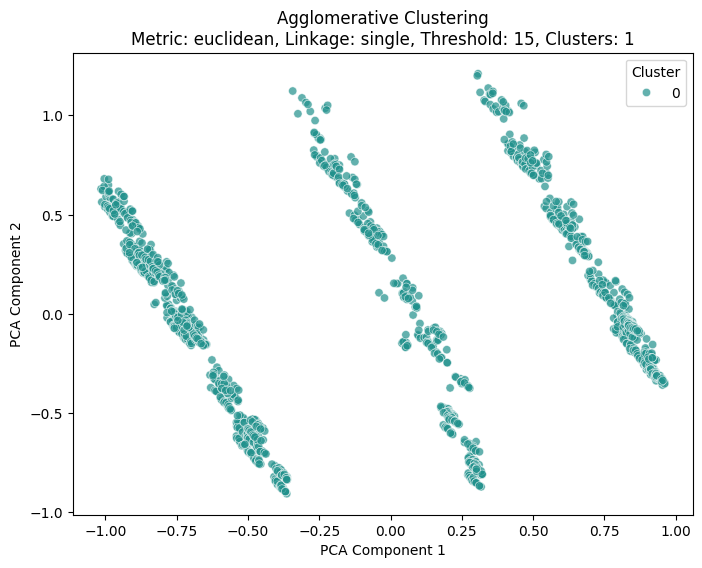

Silhouette Score (metric=euclidean, linkage=single, threshold=15): -1.0000
Number of clusters: 1



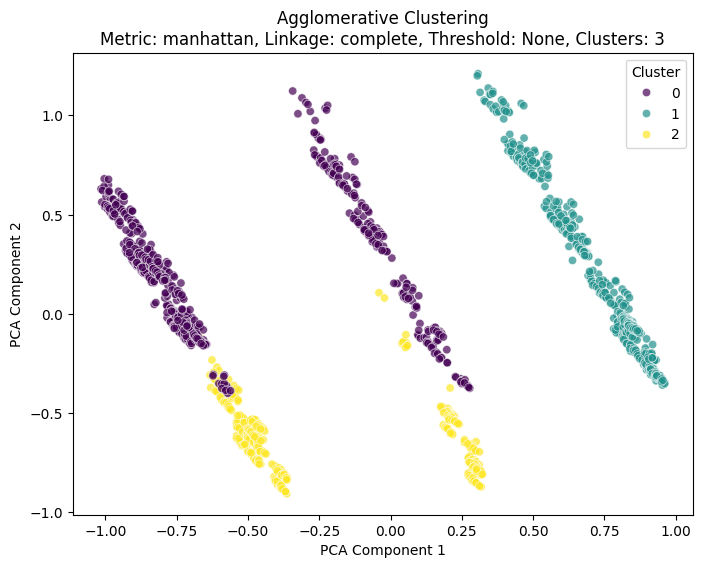

Silhouette Score (metric=manhattan, linkage=complete, threshold=None): 0.3134
Number of clusters: 3



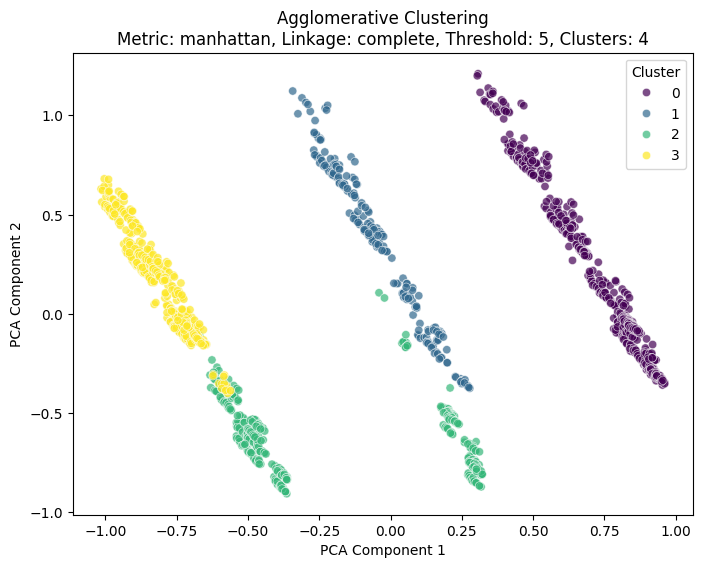

Silhouette Score (metric=manhattan, linkage=complete, threshold=5): 0.3547
Number of clusters: 4



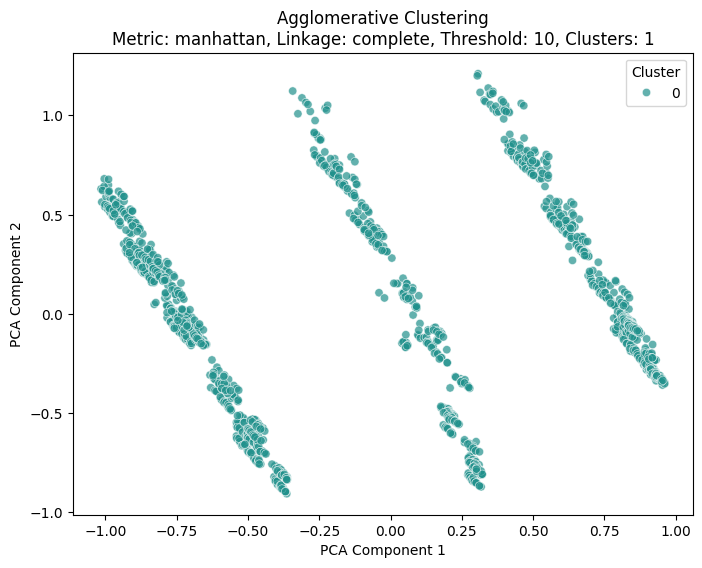

Silhouette Score (metric=manhattan, linkage=complete, threshold=10): -1.0000
Number of clusters: 1



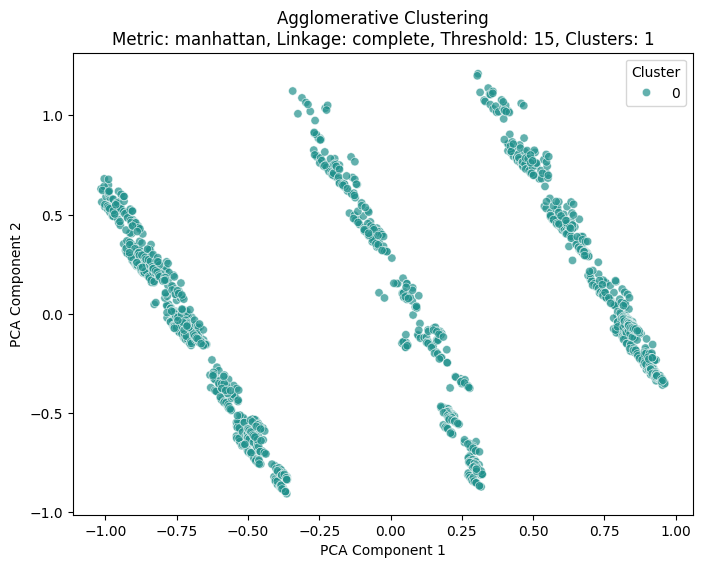

Silhouette Score (metric=manhattan, linkage=complete, threshold=15): -1.0000
Number of clusters: 1



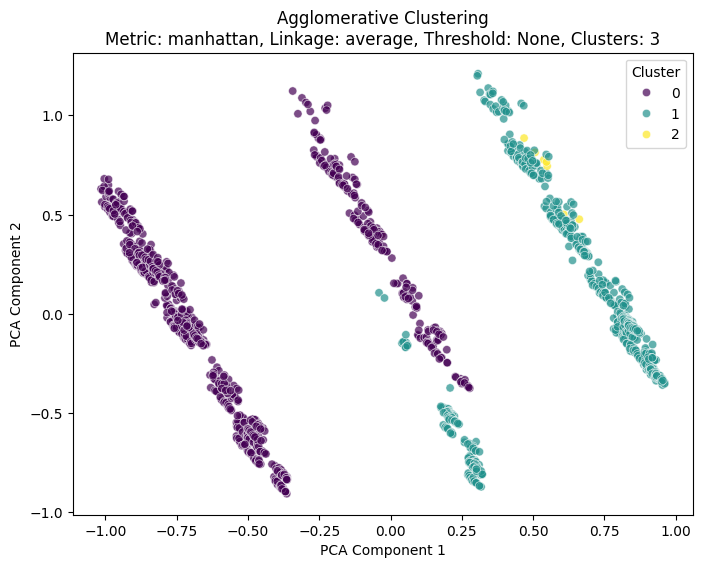

Silhouette Score (metric=manhattan, linkage=average, threshold=None): 0.3007
Number of clusters: 3



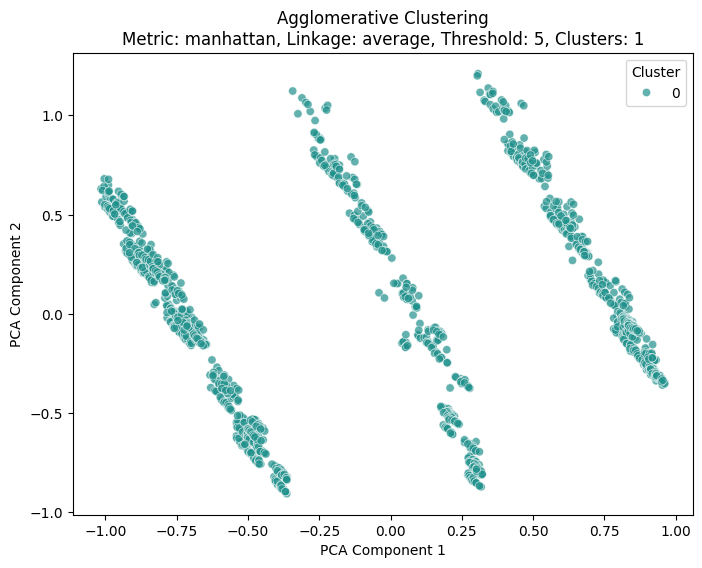

Silhouette Score (metric=manhattan, linkage=average, threshold=5): -1.0000
Number of clusters: 1



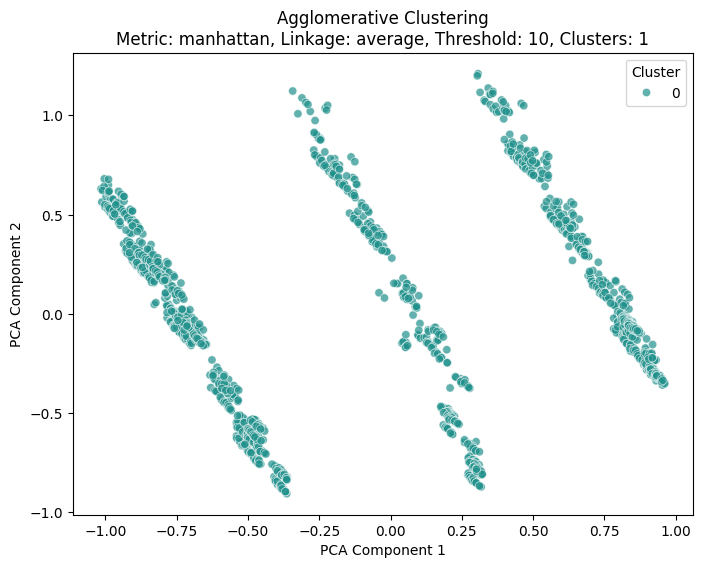

Silhouette Score (metric=manhattan, linkage=average, threshold=10): -1.0000
Number of clusters: 1



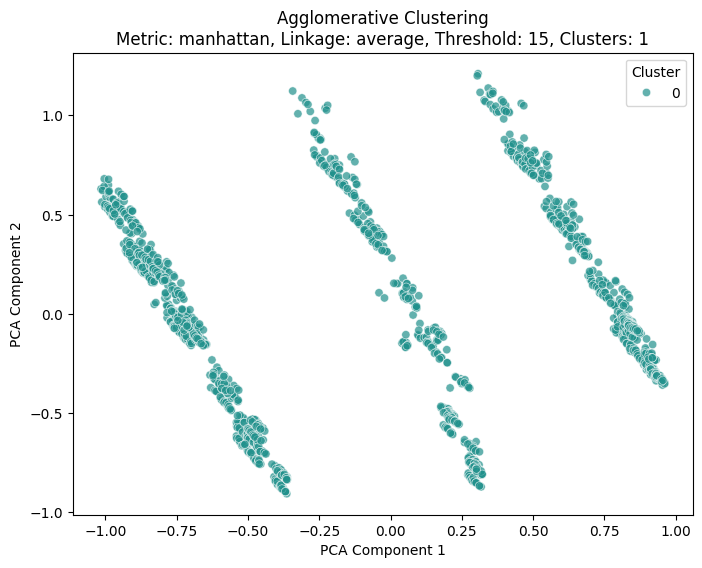

Silhouette Score (metric=manhattan, linkage=average, threshold=15): -1.0000
Number of clusters: 1



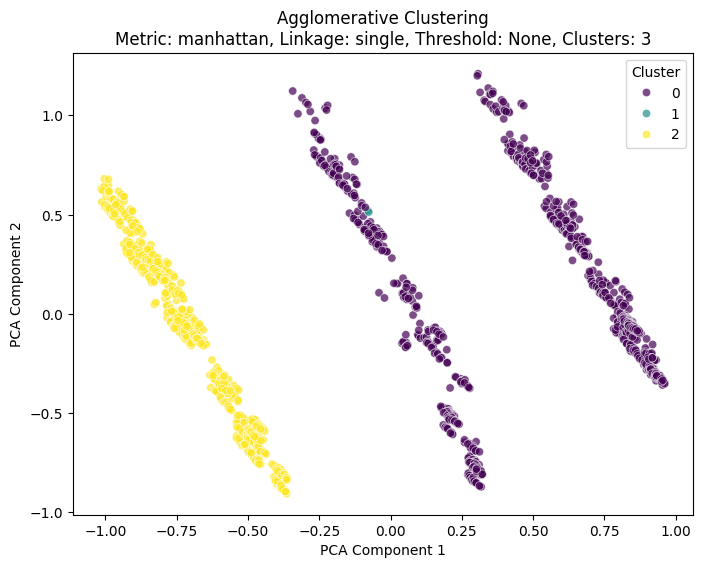

Silhouette Score (metric=manhattan, linkage=single, threshold=None): 0.3118
Number of clusters: 3



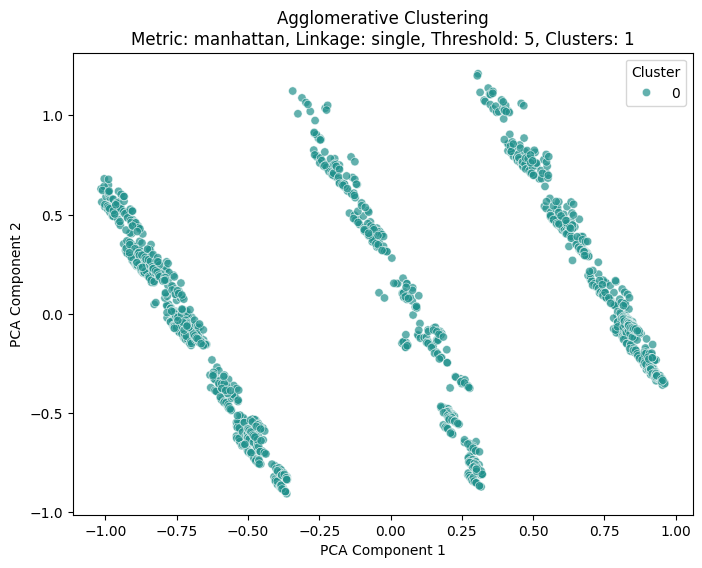

Silhouette Score (metric=manhattan, linkage=single, threshold=5): -1.0000
Number of clusters: 1



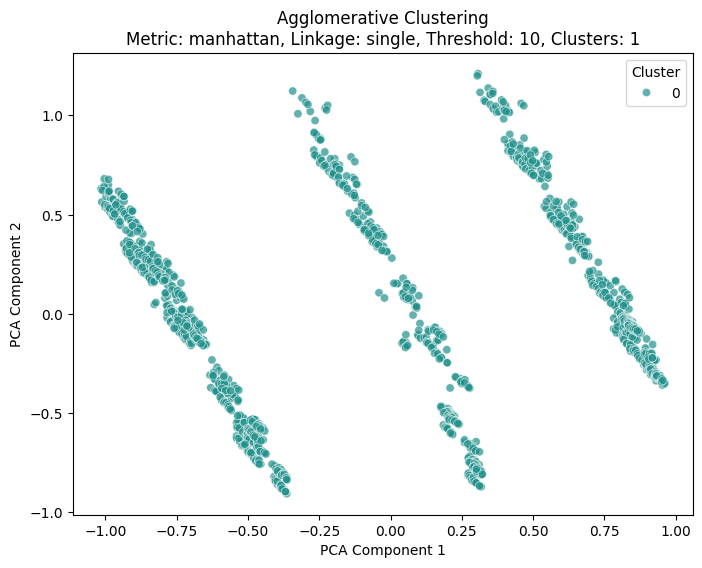

Silhouette Score (metric=manhattan, linkage=single, threshold=10): -1.0000
Number of clusters: 1



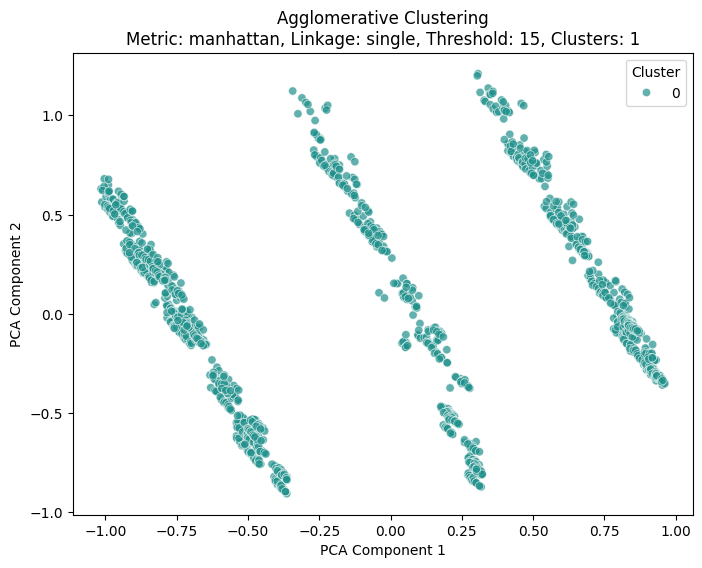

Silhouette Score (metric=manhattan, linkage=single, threshold=15): -1.0000
Number of clusters: 1



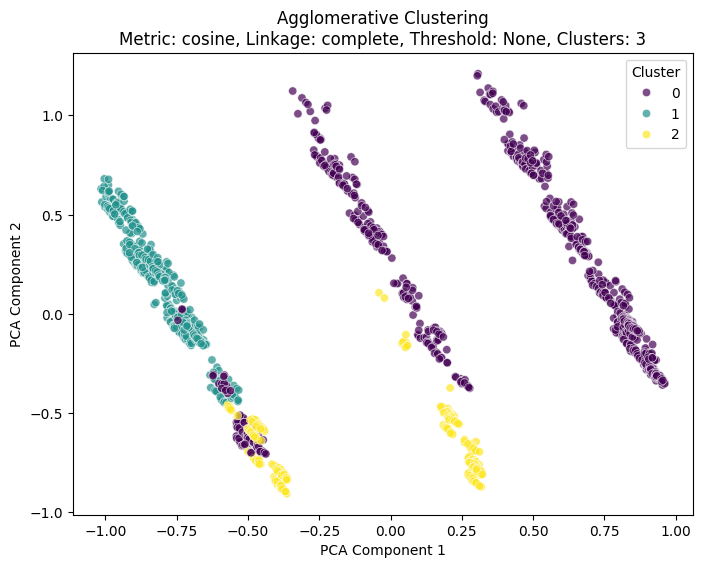

Silhouette Score (metric=cosine, linkage=complete, threshold=None): 0.2760
Number of clusters: 3



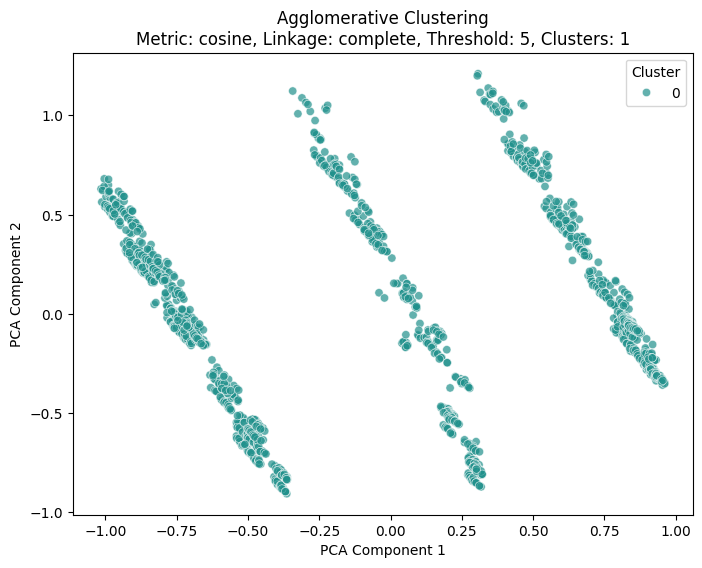

Silhouette Score (metric=cosine, linkage=complete, threshold=5): -1.0000
Number of clusters: 1



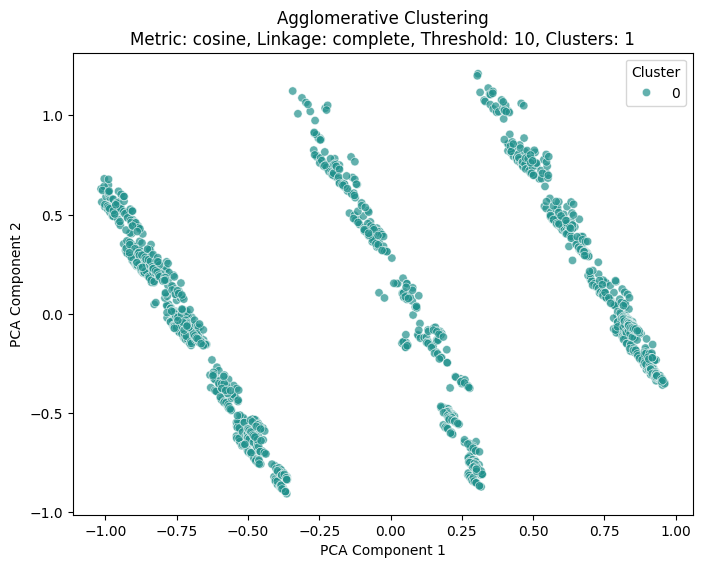

Silhouette Score (metric=cosine, linkage=complete, threshold=10): -1.0000
Number of clusters: 1



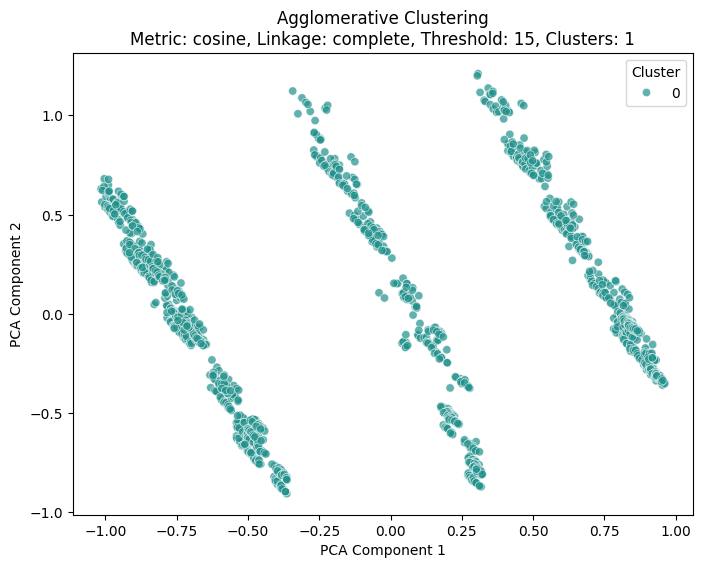

Silhouette Score (metric=cosine, linkage=complete, threshold=15): -1.0000
Number of clusters: 1



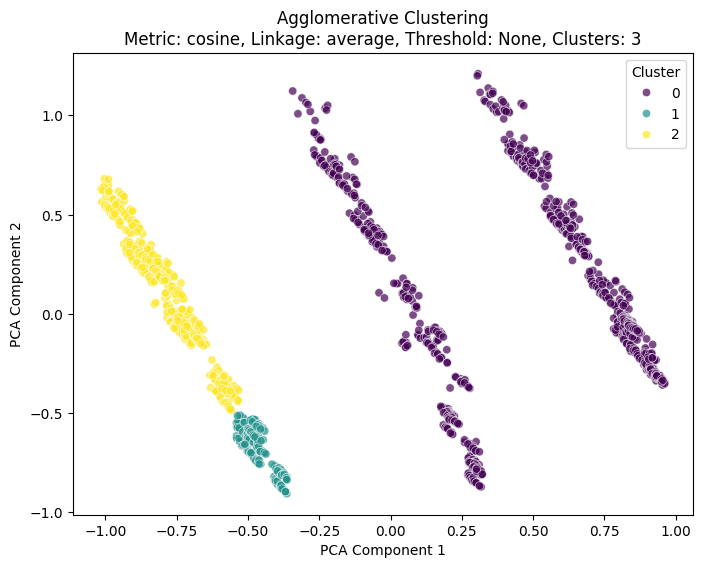

Silhouette Score (metric=cosine, linkage=average, threshold=None): 0.2653
Number of clusters: 3



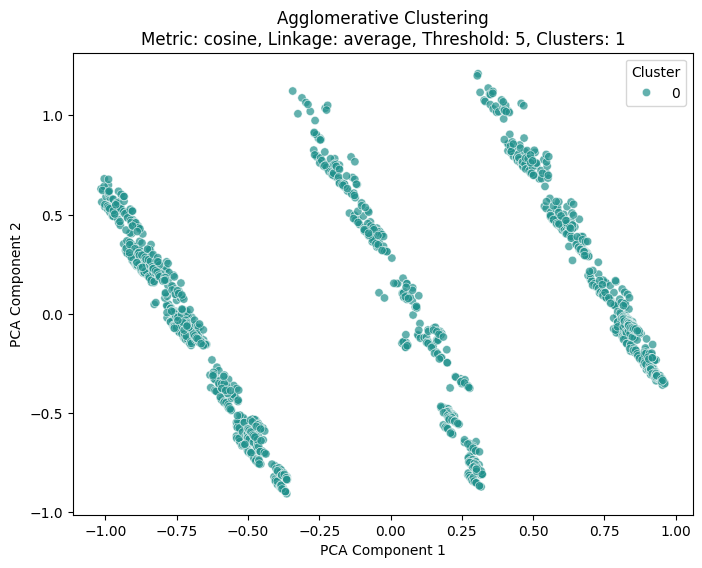

Silhouette Score (metric=cosine, linkage=average, threshold=5): -1.0000
Number of clusters: 1



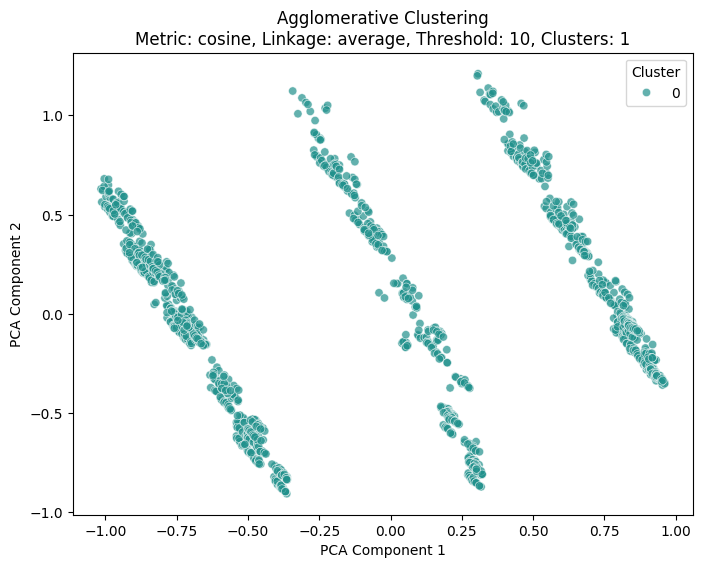

Silhouette Score (metric=cosine, linkage=average, threshold=10): -1.0000
Number of clusters: 1



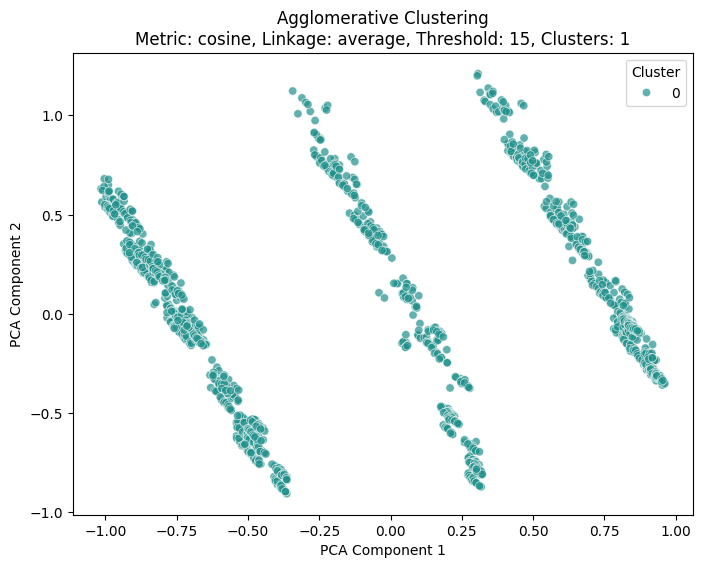

Silhouette Score (metric=cosine, linkage=average, threshold=15): -1.0000
Number of clusters: 1



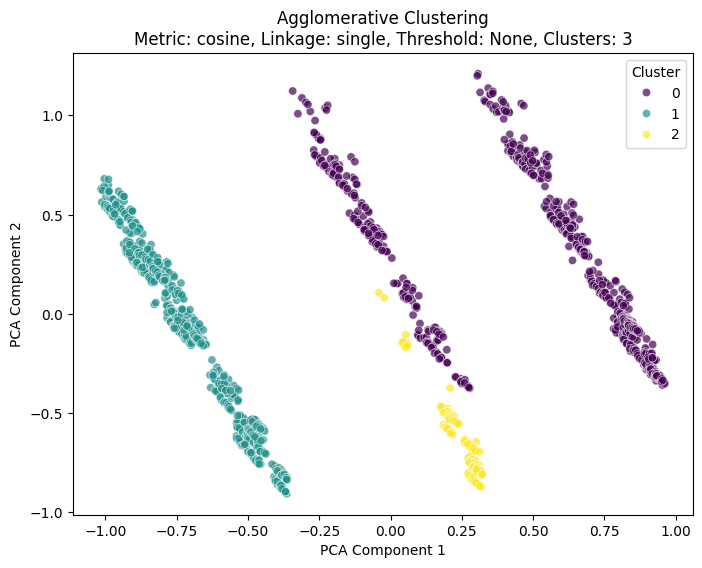

Silhouette Score (metric=cosine, linkage=single, threshold=None): 0.3147
Number of clusters: 3



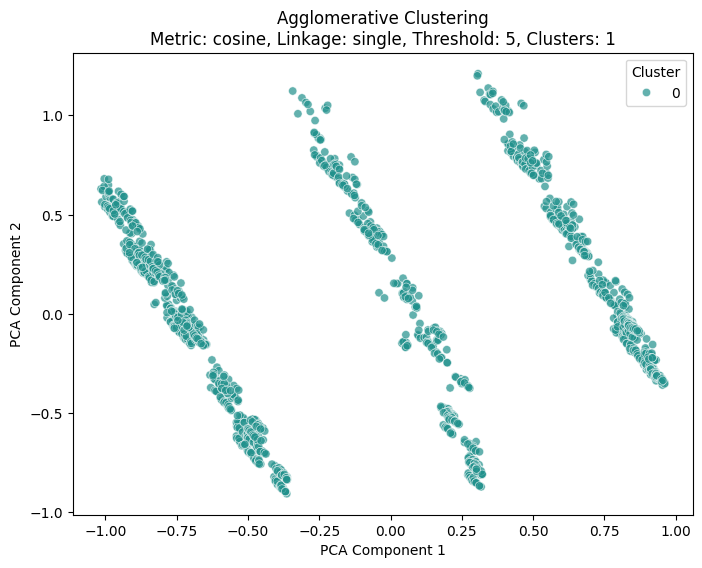

Silhouette Score (metric=cosine, linkage=single, threshold=5): -1.0000
Number of clusters: 1



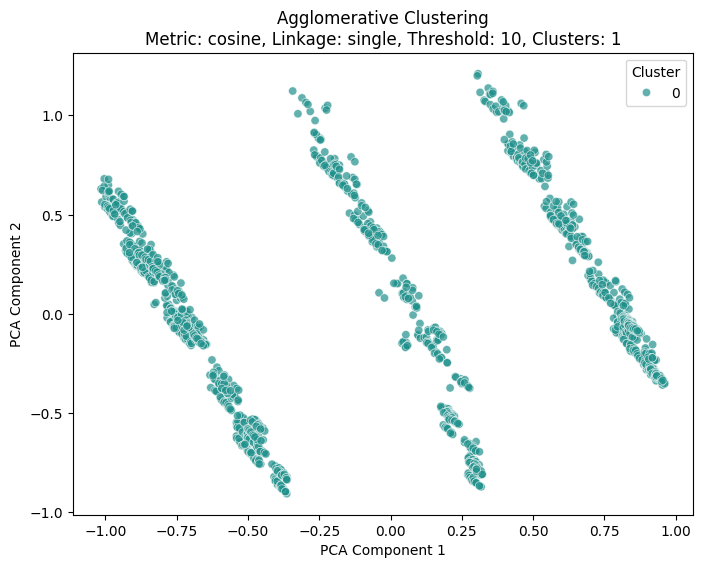

Silhouette Score (metric=cosine, linkage=single, threshold=10): -1.0000
Number of clusters: 1



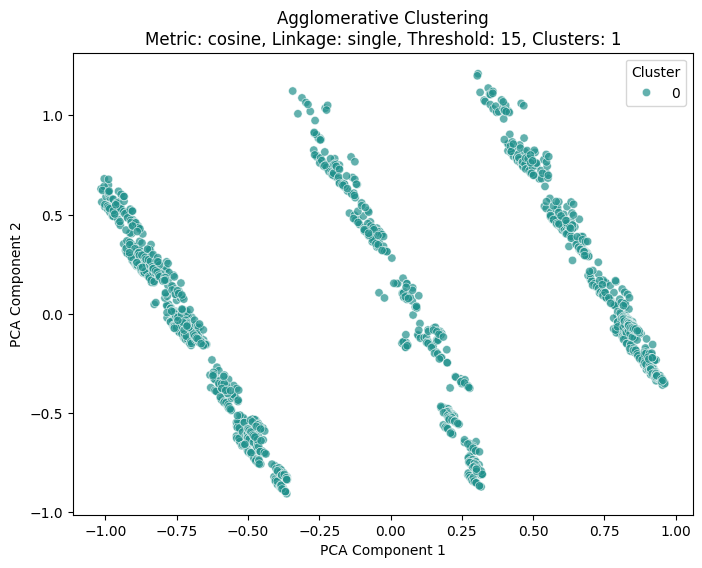

Silhouette Score (metric=cosine, linkage=single, threshold=15): -1.0000
Number of clusters: 1



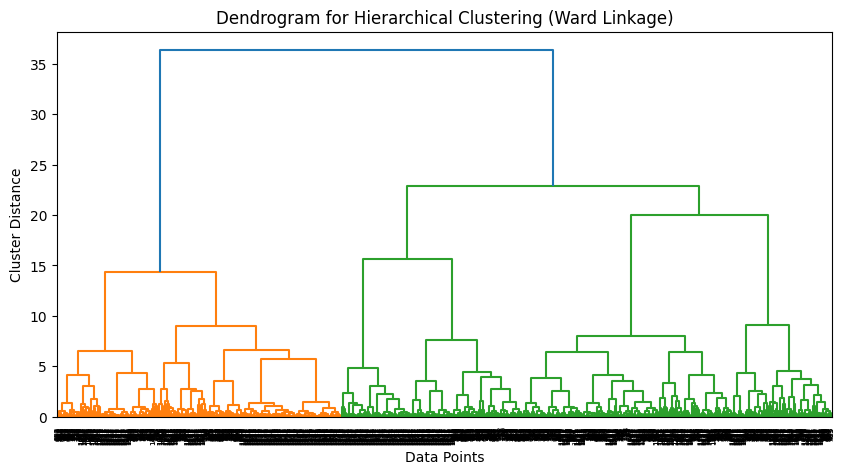


Best parameters: Metric=euclidean, Linkage=ward, Threshold=15
Best Silhouette Score: 0.3654


In [9]:
# Start performing hierarchical clustering for the customer dataset

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage

# Ensure we're using scaled_df without the ID column
scaled_df_no_id = scaled_df.drop(columns=['id'], errors='ignore')

# Define parameters to test
metrics = ['euclidean', 'manhattan', 'cosine']
linkage_methods = ['ward', 'complete', 'average', 'single']
distance_thresholds = [None, 5, 10, 15]  # None means it will use n_clusters instead

best_score = -1
best_params = None

# Store results for comparison
results = []

# Loop through parameter combinations
for metric in metrics:
    for linkage_method in linkage_methods:
        for threshold in distance_thresholds:
            # Ward linkage requires Euclidean distance
            if linkage_method == 'ward' and metric != 'euclidean':
                continue

            # Perform Agglomerative Clustering
            clustering = AgglomerativeClustering(
                n_clusters=None if threshold else 3,  # Defaulting to 3 clusters if threshold is None
                metric=metric,
                linkage=linkage_method,
                distance_threshold=threshold
            )

            labels = clustering.fit_predict(scaled_df_no_id)

            # Count the number of unique clusters
            num_clusters = len(set(labels))

            # Ensure at least 2 clusters before computing silhouette score
            if num_clusters > 1:
                sil_score = silhouette_score(scaled_df_no_id, labels)
            else:
                sil_score = -1  # Invalid clustering (only 1 cluster)

            results.append((metric, linkage_method, threshold, sil_score))

            # Update best score
            if sil_score > best_score:
                best_score = sil_score
                best_params = (metric, linkage_method, threshold)

            # Reduce dimensions for visualization
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_df_no_id)

            # Plot clusters with number of clusters in the title
            plt.figure(figsize=(8, 6))
            sns.scatterplot(
                x=reduced_data[:, 0], y=reduced_data[:, 1], hue=labels, palette='viridis', alpha=0.7
            )
            plt.title(f"Agglomerative Clustering\nMetric: {metric}, Linkage: {linkage_method}, "
                      f"Threshold: {threshold}, Clusters: {num_clusters}")
            plt.xlabel("PCA Component 1")
            plt.ylabel("PCA Component 2")
            plt.legend(title="Cluster")
            plt.show()

            # Print silhouette score and number of clusters
            print(f"Silhouette Score (metric={metric}, linkage={linkage_method}, threshold={threshold}): {sil_score:.4f}")
            print(f"Number of clusters: {num_clusters}\n")

# Plot the dendrogram for one trial (Ward linkage)
linked = linkage(scaled_df_no_id, method='ward')  # Ensure linkage is not overridden

plt.figure(figsize=(10, 5))
dendrogram(linked)
plt.title("Dendrogram for Hierarchical Clustering (Ward Linkage)")
plt.xlabel("Data Points")
plt.ylabel("Cluster Distance")
plt.show()

# Print best parameters
print(f"\nBest parameters: Metric={best_params[0]}, Linkage={best_params[1]}, Threshold={best_params[2]}")
print(f"Best Silhouette Score: {best_score:.4f}")


In [ ]:
#Best parameters: Metric=euclidean, Linkage=ward, Threshold=15
#Best Silhouette Score: 0.3654

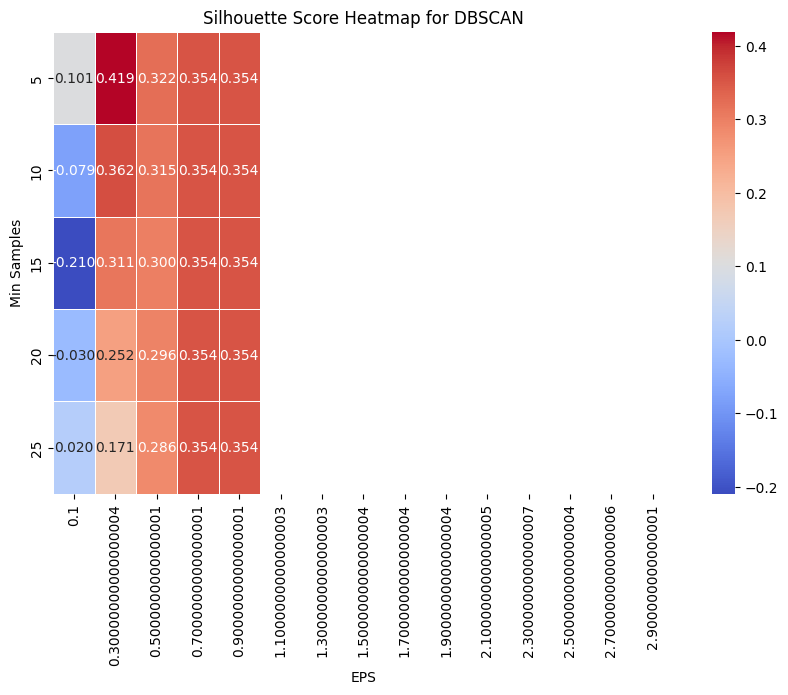

Best DBSCAN Parameters: EPS=0.30000000000000004, Min Samples=5
Best Silhouette Score: 0.4193


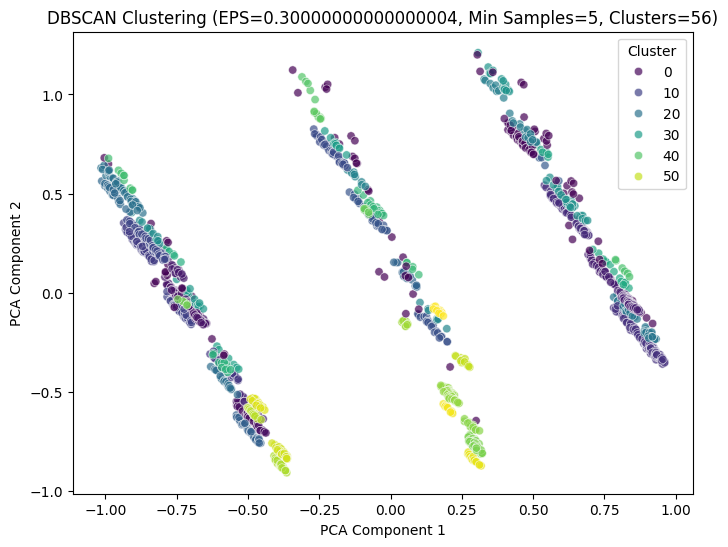

In [11]:
# Adjusted parameter ranges (smaller EPS values)
eps_values = np.arange(0.1, 3.1, 0.2)  # Try smaller EPS values (0.1 to 2.0)
min_samples_values = np.arange(5, 26, 5)  # Reduce min_samples range (3 to 20)

silhouette_scores = {}

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(scaled_df_no_id)

        # Ensure at least 2 clusters exist
        if len(set(labels)) > 1 and len(set(labels)) < len(scaled_df_no_id):
            sil_score = silhouette_score(scaled_df_no_id, labels)
            silhouette_scores[(eps, min_samples)] = sil_score
        else:
            silhouette_scores[(eps, min_samples)] = np.nan

# Heatmap of silhouette scores
silhouette_df = pd.DataFrame(np.nan, index=min_samples_values, columns=eps_values)

for (eps, min_samples), score in silhouette_scores.items():
    silhouette_df.loc[min_samples, eps] = score

plt.figure(figsize=(10, 6))
sns.heatmap(silhouette_df, annot=True, cmap='coolwarm', fmt='.3f', linewidths=0.5)
plt.title("Silhouette Score Heatmap for DBSCAN")
plt.xlabel("EPS")
plt.ylabel("Min Samples")
plt.show()

# Find best parameters
best_params = max(silhouette_scores, key=lambda k: silhouette_scores[k] if not np.isnan(silhouette_scores[k]) else -1)
best_sil_score = silhouette_scores[best_params]

print(f"Best DBSCAN Parameters: EPS={best_params[0]}, Min Samples={best_params[1]}")
print(f"Best Silhouette Score: {best_sil_score:.4f}")

# Run DBSCAN with the best parameters
best_dbscan = DBSCAN(eps=best_params[0], min_samples=best_params[1])
best_labels = best_dbscan.fit_predict(scaled_df_no_id)

# Count the number of clusters (excluding noise points labeled as -1)
num_clusters = len(set(best_labels)) - (1 if -1 in best_labels else 0)

# PCA for visualization
pca = PCA(n_components=2)
scaled_pca = pca.fit_transform(scaled_df_no_id)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=scaled_pca[:, 0], y=scaled_pca[:, 1], hue=best_labels, palette="viridis", alpha=0.7)
plt.title(f"DBSCAN Clustering (EPS={best_params[0]}, Min Samples={best_params[1]}, Clusters={num_clusters})")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster", bbox_to_anchor=(1, 1))
plt.show()

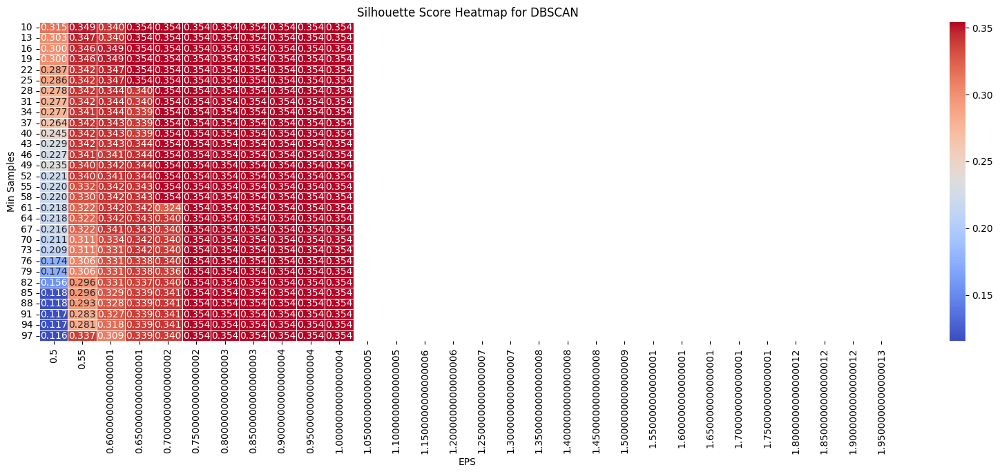

Best DBSCAN Parameters: EPS=0.6500000000000001, Min Samples=10
Best Silhouette Score: 0.3540


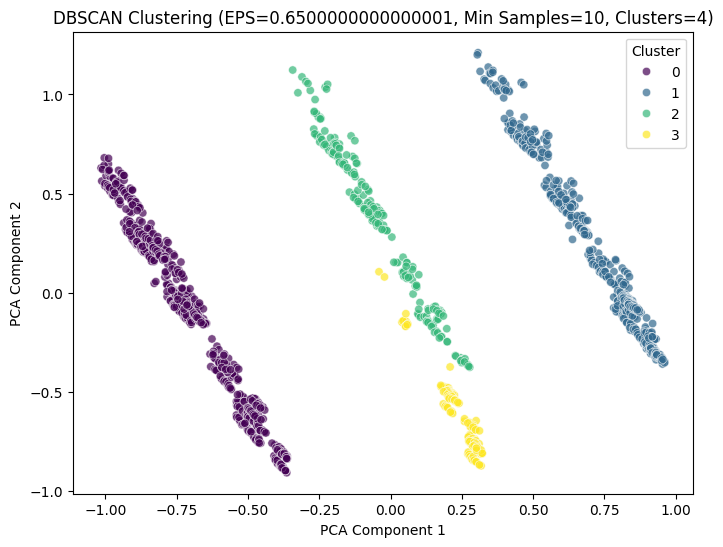

In [13]:
# Adjusted parameter ranges (smaller EPS values)
eps_values = np.arange(0.5, 2.0, 0.05)  # Try smaller EPS values (0.1 to 2.0)
min_samples_values = np.arange(10, 100, 3)  # Reduce min_samples range (3 to 100)

silhouette_scores = {}

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(scaled_df_no_id)

        # Ensure at least 2 clusters exist
        if len(set(labels)) > 1 and len(set(labels)) < len(scaled_df_no_id):
            sil_score = silhouette_score(scaled_df_no_id, labels)
            silhouette_scores[(eps, min_samples)] = sil_score
        else:
            silhouette_scores[(eps, min_samples)] = np.nan

# Heatmap of silhouette scores
silhouette_df = pd.DataFrame(np.nan, index=min_samples_values, columns=eps_values)

for (eps, min_samples), score in silhouette_scores.items():
    silhouette_df.loc[min_samples, eps] = score

plt.figure(figsize=(20, 6))
sns.heatmap(silhouette_df, annot=True, cmap='coolwarm', fmt='.3f', linewidths=0.5)
plt.title("Silhouette Score Heatmap for DBSCAN")
plt.xlabel("EPS")
plt.ylabel("Min Samples")
plt.show()

# Find best parameters
best_params = max(silhouette_scores, key=lambda k: silhouette_scores[k] if not np.isnan(silhouette_scores[k]) else -1)
best_sil_score = silhouette_scores[best_params]

print(f"Best DBSCAN Parameters: EPS={best_params[0]}, Min Samples={best_params[1]}")
print(f"Best Silhouette Score: {best_sil_score:.4f}")

# Run DBSCAN with the best parameters
best_dbscan = DBSCAN(eps=best_params[0], min_samples=best_params[1])
best_labels = best_dbscan.fit_predict(scaled_df_no_id)

# Count the number of clusters (excluding noise points labeled as -1)
num_clusters = len(set(best_labels)) - (1 if -1 in best_labels else 0)

# PCA for visualization
pca = PCA(n_components=2)
scaled_pca = pca.fit_transform(scaled_df_no_id)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=scaled_pca[:, 0], y=scaled_pca[:, 1], hue=best_labels, palette="viridis", alpha=0.7)
plt.title(f"DBSCAN Clustering (EPS={best_params[0]}, Min Samples={best_params[1]}, Clusters={num_clusters})")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster", bbox_to_anchor=(1, 1))
plt.show()

In [ ]:
#Best DBSCAN Parameters: EPS=0.6500000000000001, Min Samples=10
#Best Silhouette Score: 0.3540

In [ ]:
#The best algorithm for this dataset was K-means clustering as it gave the highest silhouette score.